In [1]:
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All"
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

# Use the kagglehub client library to attach Kaggle resources like competitions, datasets, and models to your session
# Learn more about kagglehub: https://github.com/Kaggle/kagglehub/blob/main/README.md

import kagglehub
# kagglehub.dataset_download('<owner>/<dataset-slug>')

/kaggle/input/notebooks/kbmhkhan/resnet50-final-code/__results__.html
/kaggle/input/notebooks/kbmhkhan/resnet50-final-code/__notebook__.ipynb
/kaggle/input/notebooks/kbmhkhan/resnet50-final-code/__output__.json
/kaggle/input/notebooks/kbmhkhan/resnet50-final-code/ResNet50_E1-E5_FINAL_CHECKPOINT.zip
/kaggle/input/notebooks/kbmhkhan/resnet50-final-code/custom.css
/kaggle/input/notebooks/kbmhkhan/resnet50-final-code/Dataset_Reports/extra_physical_images_22.csv
/kaggle/input/notebooks/kbmhkhan/resnet50-final-code/Dataset_Reports/missing_physical_images.csv
/kaggle/input/notebooks/kbmhkhan/resnet50-final-code/__results___files/__results___109_0.png
/kaggle/input/notebooks/kbmhkhan/resnet50-final-code/__results___files/__results___119_2.png
/kaggle/input/notebooks/kbmhkhan/resnet50-final-code/__results___files/__results___77_1.png
/kaggle/input/notebooks/kbmhkhan/resnet50-final-code/__results___files/__results___133_0.png
/kaggle/input/notebooks/kbmhkhan/resnet50-final-code/__results___files

## STEP 01 — Environment & Imports

# Waste Classification — 4-Model Comparative Research

This notebook performs an **apples-to-apples comparison** of four CNN
architectures trained on the Final Waste Dataset:

| Model | Source notebook |
|---|---|
| ResNet50 | `model-training-setup-1st-model-run` |
| DenseNet121 | `model-training-setup-2nd-model-densenet121` |
| EfficientNet-B0 | `efficientnet-b0-kaggle-notebook` |
| MobileNetV3-Large | `mobilenetv3-large-complete-kaggle-research-pipel` |

**Before running this notebook on Kaggle**, attach as Input (via *Add Input → Notebook Output*):

1. `full-final-dataset-code` (provides `Final_Waste_Dataset/research_metadata/*`)
2. `model-training-setup-1st-model-run` (ResNet50 outputs)
3. `model-training-setup-2nd-model-densenet121` (DenseNet121 outputs)
4. `efficientnet-b0-kaggle-notebook` (EfficientNet-B0 outputs)
5. `mobilenetv3-large-complete-kaggle-research-pipel` (MobileNetV3-Large outputs)

**Design notes / why this version is different from the draft:**

- All accuracy / precision / recall / F1 / calibration numbers are **recomputed
  directly from the raw per-image prediction files** of every model (not read
  from each model's own `final_summary.json`). The three source notebooks each
  saved that JSON with a **different, incompatible key layout**
  (`overall_test.macro_f1` vs `performance.macro_f1` vs `overall_test.f1_macro`,
  etc.), so reading it directly — as the earlier draft did — silently returned
  `NaN` for almost every column. Recomputing from predictions makes every
  number correct, consistent, and directly comparable across models.
- **ResNet50's** training notebook does not export the standardized
  `resnet50_test_predictions.csv` / `_bangladesh_predictions.csv` /
  `_international_predictions.csv` files that the other three notebooks
  produce (only checkpoints, `history.csv`, `config.json`, and a
  `resnet50_domain_results.csv` summary table). This notebook automatically
  falls back to `resnet50_domain_results.csv` for ResNet50 so it is **never
  silently dropped** from the comparison — it clearly labels which metrics
  are full (from raw predictions) vs. reconstructed (from the domain-results
  fallback, weighted-average only, no per-class/ECE/confusion matrix).
- Every search step is defensive: missing inputs produce a clear printed
  warning and the pipeline keeps going instead of crashing on the last cell.


In [2]:
# ============================================================
# STEP 01 — ENVIRONMENT & IMPORTS
# ============================================================

import os
import json
import warnings
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.metrics import (
    accuracy_score,
    precision_recall_fscore_support,
    confusion_matrix,
)

from IPython.display import display, Markdown

warnings.filterwarnings("ignore")
plt.rcParams["figure.facecolor"] = "white"
np.random.seed(42)

KAGGLE_INPUT = Path("/kaggle/input")
KAGGLE_WORKING = Path("/kaggle/working")

print("=" * 80)
print("4-MODEL COMPARATIVE RESEARCH ENVIRONMENT")
print("=" * 80)
print("Working directory:", KAGGLE_WORKING)
print("Input directory   :", KAGGLE_INPUT)

if KAGGLE_INPUT.exists():
    print("\nKaggle inputs attached:")
    for p in sorted(KAGGLE_INPUT.iterdir()):
        print(" ->", p.name)
else:
    warnings.warn("‼ /kaggle/input does not exist — are you running this on Kaggle?")

print("\n✓ Environment ready")


4-MODEL COMPARATIVE RESEARCH ENVIRONMENT
Working directory: /kaggle/working
Input directory   : /kaggle/input

Kaggle inputs attached:
 -> notebooks

✓ Environment ready


## STEP 02 — Index every file under /kaggle/input (used by all later searches)

In [3]:
# ============================================================
# STEP 02 — INDEX ALL INPUT FILES
# ============================================================
# Every later "find the file for model X" step filters this single list
# instead of re-walking the filesystem, and matching is case-insensitive
# and substring-based so small naming differences don't break the search.

ALL_INPUT_FILES = [p for p in KAGGLE_INPUT.rglob("*") if p.is_file()] if KAGGLE_INPUT.exists() else []

print("=" * 80)
print("INPUT FILE INDEX")
print("=" * 80)
print(f"Total files indexed under /kaggle/input: {len(ALL_INPUT_FILES):,}")

def find_files(*must_contain, exts=None):
    """Return files whose lowercase name contains every token in must_contain
    (case-insensitive) and whose suffix is in exts (if given)."""
    tokens = [t.lower() for t in must_contain]
    out = []
    for p in ALL_INPUT_FILES:
        name = p.name.lower()
        if all(t in name for t in tokens):
            if exts is None or p.suffix.lower() in exts:
                out.append(p)
    return sorted(set(out))

print("✓ find_files() helper ready")


INPUT FILE INDEX
Total files indexed under /kaggle/input: 30,213
✓ find_files() helper ready


## STEP 03 — Locate the Final Waste Dataset metadata

In [4]:
# ============================================================
# STEP 03 — LOCATE FINAL WASTE DATASET METADATA
# ============================================================
# Tries several strategies in order, because Kaggle's attach path for a
# notebook's output can nest the folder differently depending on how it
# was attached (dataset vs. "notebook output").

def find_research_metadata_dir():
    # Strategy 1: a directory literally named Final_Waste_Dataset, then its
    # research_metadata subfolder.
    for root in KAGGLE_INPUT.rglob("Final_Waste_Dataset"):
        if root.is_dir():
            for meta in root.rglob("research_metadata"):
                if meta.is_dir():
                    return meta

    # Strategy 2: any directory literally named research_metadata, anywhere.
    matches = [p for p in KAGGLE_INPUT.rglob("research_metadata") if p.is_dir()]
    if matches:
        return matches[0]

    # Strategy 3: locate final_metadata.csv directly and use its parent folder.
    csvs = list(KAGGLE_INPUT.rglob("final_metadata.csv"))
    if csvs:
        return csvs[0].parent

    return None

META = find_research_metadata_dir()

print("=" * 80)
print("RESEARCH METADATA LOCATION")
print("=" * 80)

if META is None:
    warnings.warn(
        "research_metadata directory was not found under /kaggle/input. "
        "Add 'full-final-dataset-code' output as an Input. "
        "Falling back to hard-coded class names; dataset-size stats will be unavailable."
    )
else:
    print("Selected:", META)
    print("\nFiles found there:")
    for p in sorted(META.iterdir()):
        print(" ->", p.name)


RESEARCH METADATA LOCATION
Selected: /kaggle/input/notebooks/kbmhkhan/full-final-waste-dataset-structure/Final_Waste_Dataset/research_metadata

Files found there:
 -> FINAL_CHECKPOINT.json
 -> final_metadata.csv
 -> manual_review_decisions.csv
 -> test_bangladesh_final.csv
 -> test_final.csv
 -> test_international_final.csv
 -> train_final.csv
 -> training_class_balance.csv
 -> validation_final.csv


## STEP 04 — Load dataset metadata (soft-fail: never crashes the run)

In [5]:
# ============================================================
# STEP 04 — LOAD FINAL DATASET METADATA
# ============================================================

METADATA_FILES = {
    "final": "final_metadata.csv",
    "train": "train_final.csv",
    "validation": "validation_final.csv",
    "test": "test_final.csv",
    "bangladesh_test": "test_bangladesh_final.csv",
    "international_test": "test_international_final.csv",
}

metadata_dfs = {}

print("=" * 80)
print("LOADING METADATA FILES")
print("=" * 80)

if META is not None:
    for key, filename in METADATA_FILES.items():
        path = META / filename
        if path.exists():
            metadata_dfs[key] = pd.read_csv(path)
            print(f"✓ {filename:<32} {len(metadata_dfs[key]):>7,} rows")
        else:
            print(f"✗ {filename:<32} not found")
else:
    print("Skipped — no research_metadata directory available.")

print("\n✓ Metadata loading step complete (missing files do not stop the notebook)")


LOADING METADATA FILES
✓ final_metadata.csv                10,668 rows
✓ train_final.csv                    7,245 rows
✓ validation_final.csv               1,552 rows
✓ test_final.csv                     1,871 rows
✓ test_bangladesh_final.csv            319 rows
✓ test_international_final.csv       1,289 rows

✓ Metadata loading step complete (missing files do not stop the notebook)


## STEP 05 — Class configuration

In [6]:
# ============================================================
# STEP 05 — CLASS CONFIGURATION
# ============================================================

if "final" in metadata_dfs and "class" in metadata_dfs["final"].columns:
    CLASS_NAMES = sorted(metadata_dfs["final"]["class"].dropna().unique().tolist())
else:
    # Matches the fixed label set used identically by all four training notebooks.
    CLASS_NAMES = ["Cardboard", "Glass", "Metal", "Paper", "Plastic"]

CLASS_TO_IDX = {name: idx for idx, name in enumerate(CLASS_NAMES)}
IDX_TO_CLASS = {idx: name for name, idx in CLASS_TO_IDX.items()}
NUM_CLASSES = len(CLASS_NAMES)

print("=" * 80)
print("CLASS CONFIGURATION")
print("=" * 80)
for idx, name in enumerate(CLASS_NAMES):
    print(f"{idx} -> {name}")
print("\nNumber of classes:", NUM_CLASSES)


CLASS CONFIGURATION
0 -> Cardboard
1 -> Glass
2 -> Metal
3 -> Paper
4 -> Plastic

Number of classes: 5


## STEP 06 — Model registry

In [7]:
# ============================================================
# STEP 06 — MODEL REGISTRY
# ============================================================
# MODEL_TOKEN is the exact filename substring each training notebook uses,
# e.g. "efficientnet_b0_test_predictions.csv". Keeping this in one place
# means every later search step stays perfectly consistent.

MODEL_TOKEN = {
    "ResNet50": "resnet50",
    "DenseNet121": "densenet121",
    "EfficientNet-B0": "efficientnet_b0",
    "MobileNetV3-Large": "mobilenetv3_large",
}

MODELS = list(MODEL_TOKEN.keys())

print("=" * 80)
print("MODEL REGISTRY")
print("=" * 80)
for model_name, token in MODEL_TOKEN.items():
    print(f"{model_name:<20} token = '{token}'")


MODEL REGISTRY
ResNet50             token = 'resnet50'
DenseNet121          token = 'densenet121'
EfficientNet-B0      token = 'efficientnet_b0'
MobileNetV3-Large    token = 'mobilenetv3_large'


## STEP 07 — Find model checkpoints (.pth)

In [8]:
# ============================================================
# FINAL RESEARCH BACKUP — ALL 4 MODELS
# ZIP + JSON + CSV + CHECKPOINTS + REPORTS + VISUALIZATIONS
# ============================================================

from pathlib import Path
import shutil
import os
import json

BACKUP_ROOT = Path("/kaggle/working/FINAL_RESEARCH_BACKUP")
BACKUP_ROOT.mkdir(parents=True, exist_ok=True)

print("=" * 100)
print("CREATING FINAL RESEARCH BACKUP")
print("=" * 100)

# ------------------------------------------------------------
# SOURCE PATHS
# ------------------------------------------------------------

sources = {
    "ResNet50": [
        Path("/kaggle/input/notebooks/kbmhkhan/resnet50-final-code/waste_model_results"),
    ],

    "DenseNet121": [
        Path("/kaggle/input/notebooks/kbmhkhan/model-training-setup-2nd-model-densenet121/DenseNet121_Research"),
        Path("/kaggle/input/notebooks/kbmhkhan/model-training-setup-2nd-model-densenet121/DenseNet121_Research_Results"),
    ],

    "EfficientNet-B0": [
        Path("/kaggle/input/notebooks/kbmhkhan/efficientnet-b0-kaggle-notebook/efficientnet_b0_experiment"),
    ],

    # MobileNet output backup
    "MobileNetV3-Large": [
        Path("/kaggle/input/notebooks/kbmhkhan/mobilenetv3-large-complete-kaggle-research-pipel"),
    ],
}

# ------------------------------------------------------------
# COPY EXISTING MODEL RESULTS
# ------------------------------------------------------------

for model_name, paths in sources.items():

    model_dir = BACKUP_ROOT / model_name
    model_dir.mkdir(parents=True, exist_ok=True)

    print(f"\n{'=' * 80}")
    print(model_name)
    print(f"{'=' * 80}")

    found = False

    for src in paths:

        if not src.exists():
            print(f"⚠ Not found: {src}")
            continue

        found = True

        destination = model_dir / src.name

        if src.is_dir():

            shutil.copytree(
                src,
                destination,
                dirs_exist_ok=True
            )

            print(f"✓ Copied directory:")
            print(f"  {src}")

        elif src.is_file():

            shutil.copy2(
                src,
                destination
            )

            print(f"✓ Copied file:")
            print(f"  {src}")

    if not found:
        print("⚠ No source found for this model.")


# ------------------------------------------------------------
# ALSO COPY MOBILE NET EXISTING BACKUP ZIP IF AVAILABLE
# ------------------------------------------------------------

possible_mobilenet_zips = [
    Path("/kaggle/input/notebooks/kbmhkhan/mobilenetv3-large-complete-kaggle-research-pipel/MOBILENETV3-LARGE_complete_backup.zip"),
    Path("/kaggle/working/MOBILENETV3-LARGE_complete_backup.zip"),
]

for zip_path in possible_mobilenet_zips:

    if zip_path.exists():

        shutil.copy2(
            zip_path,
            BACKUP_ROOT / zip_path.name
        )

        print(
            f"\n✓ MobileNetV3 backup ZIP copied:\n"
            f"  {zip_path}"
        )

        break


# ------------------------------------------------------------
# CREATE MASTER MANIFEST
# ------------------------------------------------------------

manifest = {
    "backup_name": "FINAL_RESEARCH_BACKUP",
    "purpose": "Complete research backup for 4-model waste classification study",
    "models": [
        "ResNet50",
        "DenseNet121",
        "EfficientNet-B0",
        "MobileNetV3-Large"
    ],
    "classes": [
        "Cardboard",
        "Glass",
        "Metal",
        "Paper",
        "Plastic"
    ],
    "contents": [
        "model checkpoints",
        "training histories",
        "configuration JSON files",
        "classification reports",
        "prediction CSV files",
        "performance summaries",
        "confusion matrices",
        "normalized confusion matrices",
        "training curves",
        "reliability diagrams",
        "experiment results"
    ]
}

manifest_path = BACKUP_ROOT / "MASTER_MANIFEST.json"

with open(
    manifest_path,
    "w",
    encoding="utf-8"
) as f:

    json.dump(
        manifest,
        f,
        indent=4,
        ensure_ascii=False
    )

print("\n✓ MASTER_MANIFEST.json created")


# ------------------------------------------------------------
# FILE INVENTORY
# ------------------------------------------------------------

inventory = []

for file in sorted(BACKUP_ROOT.rglob("*")):

    if file.is_file():

        size_mb = file.stat().st_size / (1024 ** 2)

        inventory.append({
            "file": str(file.relative_to(BACKUP_ROOT)),
            "size_mb": round(size_mb, 3)
        })

inventory_path = BACKUP_ROOT / "FILE_INVENTORY.json"

with open(
    inventory_path,
    "w",
    encoding="utf-8"
) as f:

    json.dump(
        inventory,
        f,
        indent=4,
        ensure_ascii=False
    )

print("✓ FILE_INVENTORY.json created")


# ------------------------------------------------------------
# FINAL ZIP
# ------------------------------------------------------------

archive_base = Path(
    "/kaggle/working/FINAL_RESEARCH_BACKUP_ALL_MODELS"
)

archive_path = shutil.make_archive(
    str(archive_base),
    "zip",
    root_dir=BACKUP_ROOT
)

size_gb = os.path.getsize(archive_path) / (1024 ** 3)

print("\n" + "=" * 100)
print("FINAL BACKUP CREATED")
print("=" * 100)

print(f"ZIP: {archive_path}")
print(f"Size: {size_gb:.3f} GB")

print(f"\nTotal files: {len(inventory)}")

print("\n✓ ResNet50 backup")
print("✓ DenseNet121 backup")
print("✓ EfficientNet-B0 backup")
print("✓ MobileNetV3-Large backup")
print("✓ JSON metadata")
print("✓ CSV results")
print("✓ Model checkpoints")
print("✓ Reports")
print("✓ Visualizations")

print("\n✓ FINAL BACKUP READY")

CREATING FINAL RESEARCH BACKUP

ResNet50
✓ Copied directory:
  /kaggle/input/notebooks/kbmhkhan/resnet50-final-code/waste_model_results

DenseNet121
✓ Copied directory:
  /kaggle/input/notebooks/kbmhkhan/model-training-setup-2nd-model-densenet121/DenseNet121_Research
✓ Copied directory:
  /kaggle/input/notebooks/kbmhkhan/model-training-setup-2nd-model-densenet121/DenseNet121_Research_Results

EfficientNet-B0
✓ Copied directory:
  /kaggle/input/notebooks/kbmhkhan/efficientnet-b0-kaggle-notebook/efficientnet_b0_experiment

MobileNetV3-Large
✓ Copied directory:
  /kaggle/input/notebooks/kbmhkhan/mobilenetv3-large-complete-kaggle-research-pipel

✓ MobileNetV3 backup ZIP copied:
  /kaggle/input/notebooks/kbmhkhan/mobilenetv3-large-complete-kaggle-research-pipel/MOBILENETV3-LARGE_complete_backup.zip

✓ MASTER_MANIFEST.json created
✓ FILE_INVENTORY.json created

FINAL BACKUP CREATED
ZIP: /kaggle/working/FINAL_RESEARCH_BACKUP_ALL_MODELS.zip
Size: 0.956 GB

Total files: 117

✓ ResNet50 backup
✓

In [9]:
# ============================================================
# FINAL BACKUP VERIFICATION
# ============================================================

from pathlib import Path
import zipfile
import os

zip_path = Path(
    "/kaggle/working/FINAL_RESEARCH_BACKUP_ALL_MODELS.zip"
)

print("=" * 100)
print("FINAL BACKUP VERIFICATION")
print("=" * 100)

print("ZIP exists:", zip_path.exists())

if zip_path.exists():

    size_gb = zip_path.stat().st_size / (1024 ** 3)

    print(f"ZIP size: {size_gb:.3f} GB")

    with zipfile.ZipFile(zip_path, "r") as z:

        files = z.namelist()

        print(f"Files inside ZIP: {len(files)}")

        print("\nModels found:")

        for model in [
            "ResNet50",
            "DenseNet121",
            "EfficientNet-B0",
            "MobileNetV3-Large"
        ]:

            found = any(model in f for f in files)

            print(
                f"{'✓' if found else '✗'} {model}"
            )

        print("\nCheckpoint files:")

        checkpoints = [
            f for f in files
            if f.endswith(".pth")
        ]

        for f in checkpoints:
            print("✓", f)

        print("\nJSON files:")

        json_files = [
            f for f in files
            if f.endswith(".json")
        ]

        for f in json_files:
            print("✓", f)

print("\n✓ VERIFICATION COMPLETE")

FINAL BACKUP VERIFICATION
ZIP exists: True
ZIP size: 0.956 GB
Files inside ZIP: 158

Models found:
✓ ResNet50
✓ DenseNet121
✓ EfficientNet-B0
✓ MobileNetV3-Large

Checkpoint files:
✓ EfficientNet-B0/efficientnet_b0_experiment/checkpoints/efficientnet_b0_best.pth
✓ EfficientNet-B0/efficientnet_b0_experiment/checkpoints/efficientnet_b0_last.pth
✓ MobileNetV3-Large/mobilenetv3-large-complete-kaggle-research-pipel/mobilenetv3_large_experiment/checkpoints/mobilenetv3_large_best.pth
✓ ResNet50/waste_model_results/resnet50_experiments/E2_strong_augmentation/resnet50_best.pth
✓ ResNet50/waste_model_results/resnet50_experiments/E5_high_resolution/resnet50_best.pth
✓ ResNet50/waste_model_results/resnet50_experiments/E4_label_smoothing/resnet50_best.pth
✓ ResNet50/waste_model_results/resnet50_experiments/E3_adamw_cosine/resnet50_best.pth
✓ ResNet50/waste_model_results/checkpoints/resnet50_best.pth
✓ DenseNet121/DenseNet121_Research/checkpoints/densenet121_last.pth
✓ DenseNet121/DenseNet121_Resear

In [10]:
# ============================================================
# STEP 07 — FIND MODEL CHECKPOINTS
# ============================================================

model_checkpoints = {}

print("=" * 80)
print("SEARCHING MODEL CHECKPOINTS (*.pth)")
print("=" * 80)

for model_name, token in MODEL_TOKEN.items():
    found = find_files(token, exts={".pth", ".pt"})
    model_checkpoints[model_name] = found

    print(f"\n{model_name}")
    if not found:
        print("  ✗ Not found")
    else:
        for path in found:
            size_mb = path.stat().st_size / (1024 ** 2)
            print(f"  ✓ {path} ({size_mb:.2f} MB)")


SEARCHING MODEL CHECKPOINTS (*.pth)

ResNet50
  ✓ /kaggle/input/notebooks/kbmhkhan/model-training-setup-1st-model-resnet50/waste_model_results/checkpoints/resnet50_best.pth (269.58 MB)
  ✓ /kaggle/input/notebooks/kbmhkhan/model-training-setup-1st-model-resnet50/waste_model_results/resnet50_experiments/E2_strong_augmentation/resnet50_best.pth (90.02 MB)
  ✓ /kaggle/input/notebooks/kbmhkhan/model-training-setup-1st-model-resnet50/waste_model_results/resnet50_experiments/E3_adamw_cosine/resnet50_best.pth (90.02 MB)
  ✓ /kaggle/input/notebooks/kbmhkhan/model-training-setup-1st-model-resnet50/waste_model_results/resnet50_experiments/E4_label_smoothing/resnet50_best.pth (90.02 MB)
  ✓ /kaggle/input/notebooks/kbmhkhan/model-training-setup-1st-model-resnet50/waste_model_results/resnet50_experiments/E5_high_resolution/resnet50_best.pth (90.02 MB)
  ✓ /kaggle/input/notebooks/kbmhkhan/resnet50-final-code/waste_model_results/checkpoints/resnet50_best.pth (269.58 MB)
  ✓ /kaggle/input/notebooks/kbm

## STEP 08 — Find standardized prediction files (test / bangladesh / international)

In [11]:
# ============================================================
# STEP 08 — FIND PREDICTION FILES
# ============================================================

PREDICTION_SUFFIX = {
    "test": "test_predictions.csv",
    "bangladesh": "bangladesh_predictions.csv",
    "international": "international_predictions.csv",
}

prediction_files = {model_name: {} for model_name in MODELS}

print("=" * 80)
print("SEARCHING STANDARDIZED PREDICTION FILES")
print("=" * 80)

for model_name, token in MODEL_TOKEN.items():
    print(f"\n{model_name}")
    for split, suffix in PREDICTION_SUFFIX.items():
        matches = find_files(f"{token}_{suffix}", exts={".csv"})
        prediction_files[model_name][split] = matches
        status = "✓" if matches else "✗"
        print(f"  {status} {split:<15}: {len(matches)} file(s)")


SEARCHING STANDARDIZED PREDICTION FILES

ResNet50
  ✓ test           : 1 file(s)
  ✓ bangladesh     : 1 file(s)
  ✓ international  : 1 file(s)

DenseNet121
  ✓ test           : 1 file(s)
  ✓ bangladesh     : 1 file(s)
  ✓ international  : 1 file(s)

EfficientNet-B0
  ✓ test           : 1 file(s)
  ✓ bangladesh     : 1 file(s)
  ✓ international  : 1 file(s)

MobileNetV3-Large
  ✓ test           : 1 file(s)
  ✓ bangladesh     : 1 file(s)
  ✓ international  : 1 file(s)


## STEP 09 — Load predictions & validate schema

In [12]:
# ============================================================
# STEP 09 — LOAD PREDICTIONS
# ============================================================

REQUIRED_PRED_COLUMNS = {"true_idx", "pred_idx", "confidence", "correct"}

predictions = {model_name: {} for model_name in MODELS}
prediction_warnings = []

print("=" * 80)
print("LOADING PREDICTION FILES")
print("=" * 80)

for model_name in MODELS:
    for split, paths in prediction_files[model_name].items():
        if not paths:
            continue
        df = pd.read_csv(paths[0])
        missing_cols = REQUIRED_PRED_COLUMNS - set(df.columns)
        if missing_cols:
            msg = f"{model_name} / {split}: missing columns {missing_cols} — file skipped"
            prediction_warnings.append(msg)
            print("  ⚠", msg)
            continue
        predictions[model_name][split] = df
        print(f"  ✓ {model_name:<20} | {split:<15} | {len(df):,} rows")

if prediction_warnings:
    print("\nWarnings:")
    for w in prediction_warnings:
        print(" -", w)


LOADING PREDICTION FILES
  ✓ ResNet50             | test            | 1,871 rows
  ✓ ResNet50             | bangladesh      | 582 rows
  ✓ ResNet50             | international   | 1,289 rows
  ✓ DenseNet121          | test            | 1,871 rows
  ✓ DenseNet121          | bangladesh      | 582 rows
  ✓ DenseNet121          | international   | 1,289 rows
  ✓ EfficientNet-B0      | test            | 1,871 rows
  ✓ EfficientNet-B0      | bangladesh      | 582 rows
  ✓ EfficientNet-B0      | international   | 1,289 rows
  ✓ MobileNetV3-Large    | test            | 1,871 rows
  ✓ MobileNetV3-Large    | bangladesh      | 582 rows
  ✓ MobileNetV3-Large    | international   | 1,289 rows


## STEP 10 — ResNet50 fallback

The ResNet50 training notebook does not export
`resnet50_test_predictions.csv` / `_bangladesh_predictions.csv` /
`_international_predictions.csv`. If those are missing, this step looks for
`resnet50_domain_results.csv`, which the notebook *does* save (columns:
`Dataset`, `Samples`, `Accuracy`, `Precision`, `Recall`, `F1`, weighted-averaged,
for the `Overall Test` / `Bangladesh Test` / `International Test` rows) and
builds a reduced-but-honest metrics record from it.

In [13]:
# ============================================================
# STEP 10 — RESNET50 FALLBACK (DOMAIN-RESULTS RECONSTRUCTION)
# ============================================================

DOMAIN_ROW_FOR_SPLIT = {
    "test": "Overall Test",
    "bangladesh": "Bangladesh Test",
    "international": "International Test",
}

reconstructed_metrics = {model_name: {} for model_name in MODELS}

print("=" * 80)
print("RESNET50 FALLBACK CHECK")
print("=" * 80)

for model_name in MODELS:
    missing_splits = [s for s in PREDICTION_SUFFIX if s not in predictions[model_name]]
    if not missing_splits:
        print(f"{model_name}: all splits have raw predictions — no fallback needed.")
        continue

    domain_files = find_files(MODEL_TOKEN[model_name], "domain_results", exts={".csv"})
    if not domain_files:
        print(f"⚠ {model_name}: missing splits {missing_splits} and no *_domain_results.csv fallback found. "
              f"These splits will show as N/A in the final comparison.")
        continue

    domain_df = pd.read_csv(domain_files[0])
    print(f"✓ {model_name}: using fallback file {domain_files[0].name} for splits {missing_splits}")

    for split in missing_splits:
        row_label = DOMAIN_ROW_FOR_SPLIT[split]
        row = domain_df[domain_df["Dataset"] == row_label]
        if row.empty:
            print(f"  ⚠ row '{row_label}' not found inside {domain_files[0].name}")
            continue
        row = row.iloc[0]
        reconstructed_metrics[model_name][split] = {
            "source": "reconstructed (weighted avg only, no per-class/ECE/confusion-matrix)",
            "n_samples": int(row.get("Samples", np.nan)) if not pd.isna(row.get("Samples", np.nan)) else None,
            "accuracy": float(row.get("Accuracy", np.nan)),
            "weighted_precision": float(row.get("Precision", np.nan)),
            "weighted_recall": float(row.get("Recall", np.nan)),
            "weighted_f1": float(row.get("F1", np.nan)),
            "macro_precision": np.nan,
            "macro_recall": np.nan,
            "macro_f1": np.nan,
            "ece": np.nan,
            "n_errors": (
                int(round((1 - float(row.get("Accuracy", np.nan))) * float(row.get("Samples", np.nan))))
                if not pd.isna(row.get("Accuracy", np.nan)) and not pd.isna(row.get("Samples", np.nan))
                else None
            ),
            "confusion_matrix": None,
            "per_class_f1": None,
        }
        print(f"  -> {split}: accuracy={reconstructed_metrics[model_name][split]['accuracy']:.4f} (reconstructed)")


RESNET50 FALLBACK CHECK
ResNet50: all splits have raw predictions — no fallback needed.
DenseNet121: all splits have raw predictions — no fallback needed.
EfficientNet-B0: all splits have raw predictions — no fallback needed.
MobileNetV3-Large: all splits have raw predictions — no fallback needed.


## STEP 11 — Unified metric functions (computed identically for every model)

In [14]:
# ============================================================
# STEP 11 — UNIFIED METRIC FUNCTIONS
# ============================================================

def compute_ece(confidence, correct, n_bins=10):
    """Expected Calibration Error with equal-width confidence bins."""
    confidence = np.asarray(confidence, dtype=float)
    correct = np.asarray(correct, dtype=bool)
    n = len(confidence)
    if n == 0:
        return np.nan
    edges = np.linspace(0.0, 1.0, n_bins + 1)
    ece = 0.0
    for i in range(n_bins):
        lo, hi = edges[i], edges[i + 1]
        mask = (confidence >= lo) & (confidence <= hi if i == n_bins - 1 else confidence < hi)
        if mask.sum() == 0:
            continue
        bin_acc = correct[mask].mean()
        bin_conf = confidence[mask].mean()
        ece += (mask.sum() / n) * abs(bin_acc - bin_conf)
    return float(ece)


def compute_metrics_from_predictions(df, num_classes=NUM_CLASSES):
    """Compute a full, consistent metrics record from a raw prediction dataframe."""
    y_true = df["true_idx"].to_numpy()
    y_pred = df["pred_idx"].to_numpy()

    accuracy = accuracy_score(y_true, y_pred)

    macro_p, macro_r, macro_f1, _ = precision_recall_fscore_support(
        y_true, y_pred, average="macro", zero_division=0
    )
    weighted_p, weighted_r, weighted_f1, _ = precision_recall_fscore_support(
        y_true, y_pred, average="weighted", zero_division=0
    )
    _, _, per_class_f1, _ = precision_recall_fscore_support(
        y_true, y_pred, labels=list(range(num_classes)), zero_division=0
    )

    ece = compute_ece(df["confidence"], df["correct"])
    cm = confusion_matrix(y_true, y_pred, labels=list(range(num_classes)))

    return {
        "source": "raw predictions",
        "n_samples": int(len(df)),
        "accuracy": float(accuracy),
        "macro_precision": float(macro_p),
        "macro_recall": float(macro_r),
        "macro_f1": float(macro_f1),
        "weighted_precision": float(weighted_p),
        "weighted_recall": float(weighted_r),
        "weighted_f1": float(weighted_f1),
        "ece": float(ece),
        "n_errors": int((~df["correct"].astype(bool)).sum()),
        "confusion_matrix": cm,
        "per_class_f1": dict(zip(CLASS_NAMES, per_class_f1.tolist())),
    }

print("✓ compute_ece() and compute_metrics_from_predictions() ready")


✓ compute_ece() and compute_metrics_from_predictions() ready


## STEP 12 — Compute metrics for every model / every split

In [15]:
# ============================================================
# STEP 12 — COMPUTE METRICS FOR EVERY MODEL / SPLIT
# ============================================================

all_metrics = {model_name: {} for model_name in MODELS}

print("=" * 80)
print("COMPUTING METRICS")
print("=" * 80)

for model_name in MODELS:
    print(f"\n{model_name}")
    for split in PREDICTION_SUFFIX:
        if split in predictions[model_name]:
            all_metrics[model_name][split] = compute_metrics_from_predictions(predictions[model_name][split])
            m = all_metrics[model_name][split]
            print(f"  {split:<15}: accuracy={m['accuracy']:.4f}  macro_f1={m['macro_f1']:.4f}  n={m['n_samples']:,}")
        elif split in reconstructed_metrics[model_name]:
            all_metrics[model_name][split] = reconstructed_metrics[model_name][split]
            m = all_metrics[model_name][split]
            print(f"  {split:<15}: accuracy={m['accuracy']:.4f}  (reconstructed, macro metrics N/A)")
        else:
            all_metrics[model_name][split] = None
            print(f"  {split:<15}: ✗ unavailable")


COMPUTING METRICS

ResNet50
  test           : accuracy=0.9947  macro_f1=0.9946  n=1,871
  bangladesh     : accuracy=0.9845  macro_f1=0.9764  n=582
  international  : accuracy=0.9992  macro_f1=0.9993  n=1,289

DenseNet121
  test           : accuracy=0.9947  macro_f1=0.9946  n=1,871
  bangladesh     : accuracy=0.9880  macro_f1=0.9847  n=582
  international  : accuracy=0.9977  macro_f1=0.9978  n=1,289

EfficientNet-B0
  test           : accuracy=0.9936  macro_f1=0.9933  n=1,871
  bangladesh     : accuracy=0.9828  macro_f1=0.9698  n=582
  international  : accuracy=0.9984  macro_f1=0.9985  n=1,289

MobileNetV3-Large
  test           : accuracy=0.9904  macro_f1=0.9904  n=1,871
  bangladesh     : accuracy=0.9742  macro_f1=0.9663  n=582
  international  : accuracy=0.9977  macro_f1=0.9977  n=1,289


## STEP 13 — Supplementary info from each model's own summary file

Each source notebook's `*_final_summary.json` uses a **different nested
key layout** (confirmed by inspecting all three), so a single flat
`.get("key")` lookup — as in the earlier draft — silently returns nothing.
`deep_get` below tries every known layout in turn. This step is used only
for *supplementary* info (parameter count, best epoch); the actual
accuracy/F1/etc. comparison always comes from STEP 12, not from this file.

In [16]:
# ============================================================
# STEP 13 — SUPPLEMENTARY INFO FROM SUMMARY / CONFIG FILES
# ============================================================

def deep_get(d, candidate_paths, default=None):
    """Try several nested key paths (each a tuple of keys) against dict d,
    returning the first one that resolves."""
    for path in candidate_paths:
        cur = d
        ok = True
        for key in path:
            if isinstance(cur, dict) and key in cur:
                cur = cur[key]
            else:
                ok = False
                break
        if ok:
            return cur
    return default

TOTAL_PARAM_PATHS = [
    ("model_parameters", "total_parameters"),
    ("model_parameters", "total"),
    ("model_parameters",),          # DenseNet121 stores this as a flat int
]
BEST_EPOCH_PATHS = [
    ("training", "best_epoch"),
    ("experiment", "best_epoch"),
    ("best_epoch",),
]

model_supplementary = {}

print("=" * 80)
print("LOADING SUMMARY / CONFIG FILES (supplementary info only)")
print("=" * 80)

for model_name, token in MODEL_TOKEN.items():
    info = {"total_parameters": None, "best_epoch": None, "summary_source": None}

    summary_files = find_files(token, "final_summary", exts={".json"})
    if summary_files:
        with open(summary_files[0], "r", encoding="utf-8") as f:
            data = json.load(f)
        info["total_parameters"] = deep_get(data, TOTAL_PARAM_PATHS)
        info["best_epoch"] = deep_get(data, BEST_EPOCH_PATHS)
        info["summary_source"] = summary_files[0].name
    else:
        # ResNet50 fallback: config.json only has per-experiment info, no
        # param count — leave as None rather than guessing.
        config_files = find_files(token, "config", exts={".json"})
        if config_files:
            with open(config_files[0], "r", encoding="utf-8") as f:
                data = json.load(f)
            info["best_epoch"] = deep_get(data, BEST_EPOCH_PATHS)
            info["summary_source"] = config_files[0].name

    model_supplementary[model_name] = info
    print(f"{model_name:<20} source={info['summary_source']!s:<40} "
          f"params={info['total_parameters']!s:<12} best_epoch={info['best_epoch']}")


LOADING SUMMARY / CONFIG FILES (supplementary info only)
ResNet50             source=resnet50_final_summary.json              params=23518277     best_epoch=None
DenseNet121          source=densenet121_final_summary.json           params=6958981      best_epoch=20
EfficientNet-B0      source=efficientnet_b0_final_summary.json       params=4013953      best_epoch=14
MobileNetV3-Large    source=mobilenetv3_large_final_summary.json     params=4208437      best_epoch=13


## STEP 14 — Build the four-model comparison table

In [17]:
# ============================================================
# STEP 14 — FOUR MODEL COMPARISON TABLE
# ============================================================

def pct_or_nan(v):
    return float(v) if v is not None and not (isinstance(v, float) and np.isnan(v)) else np.nan

rows = []
for model_name in MODELS:
    test_m = all_metrics[model_name].get("test")
    bd_m = all_metrics[model_name].get("bangladesh")
    intl_m = all_metrics[model_name].get("international")
    supp = model_supplementary[model_name]

    rows.append({
        "Model": model_name,
        "Test Samples": test_m["n_samples"] if test_m else np.nan,
        "Accuracy": pct_or_nan(test_m["accuracy"]) if test_m else np.nan,
        "Macro Precision": pct_or_nan(test_m.get("macro_precision")) if test_m else np.nan,
        "Macro Recall": pct_or_nan(test_m.get("macro_recall")) if test_m else np.nan,
        "Macro F1": pct_or_nan(test_m.get("macro_f1")) if test_m else np.nan,
        "Weighted F1": pct_or_nan(test_m.get("weighted_f1")) if test_m else np.nan,
        "ECE": pct_or_nan(test_m.get("ece")) if test_m else np.nan,
        "Errors": test_m["n_errors"] if test_m else np.nan,
        "Bangladesh Accuracy": pct_or_nan(bd_m["accuracy"]) if bd_m else np.nan,
        "International Accuracy": pct_or_nan(intl_m["accuracy"]) if intl_m else np.nan,
        "Total Parameters": supp["total_parameters"],
        "Data Source": test_m["source"] if test_m else "unavailable",
    })

comparison_df = pd.DataFrame(rows).sort_values("Accuracy", ascending=False, na_position="last").reset_index(drop=True)

print("=" * 80)
print("FOUR MODEL COMPARISON")
print("=" * 80)
display(comparison_df)

incomplete = comparison_df[comparison_df["Data Source"] != "raw predictions"]
if not incomplete.empty:
    print("\n⚠ The following model(s) use reconstructed or unavailable data for one or more")
    print("  splits (see STEP 10) — their Macro Precision/Recall/F1 and ECE are N/A:")
    for name in incomplete["Model"]:
        print("   -", name)


FOUR MODEL COMPARISON


,Model,Test Samples,Accuracy,Macro Precision,Macro Recall,Macro F1,Weighted F1,ECE,Errors,Bangladesh Accuracy,International Accuracy,Total Parameters,Data Source
0,ResNet50,1871,0.994655,0.995115,0.994061,0.994575,0.994650,0.002433,10,0.984536,0.999224,23518277,raw predictions
1,DenseNet121,1871,0.994655,0.994333,0.994845,0.994574,0.994657,0.003094,10,0.987973,0.997673,6958981,raw predictions
2,EfficientNet-B0,1871,0.993586,0.993002,0.993669,0.993327,0.993587,0.003647,12,0.982818,0.998448,4013953,raw predictions
3,MobileNetV3-Large,1871,0.990379,0.990106,0.990646,0.990355,0.990368,0.004608,18,0.974227,0.997673,4208437,raw predictions


## STEP 15 — Save the comparison table

In [18]:
# ============================================================
# STEP 15 — SAVE MODEL COMPARISON
# ============================================================

COMPARISON_DIR = KAGGLE_WORKING / "four_model_comparison"
COMPARISON_DIR.mkdir(parents=True, exist_ok=True)

comparison_path = COMPARISON_DIR / "four_model_performance_comparison.csv"
comparison_df.to_csv(comparison_path, index=False)

print("Saved:", comparison_path)


Saved: /kaggle/working/four_model_comparison/four_model_performance_comparison.csv


## STEP 16 — Accuracy comparison

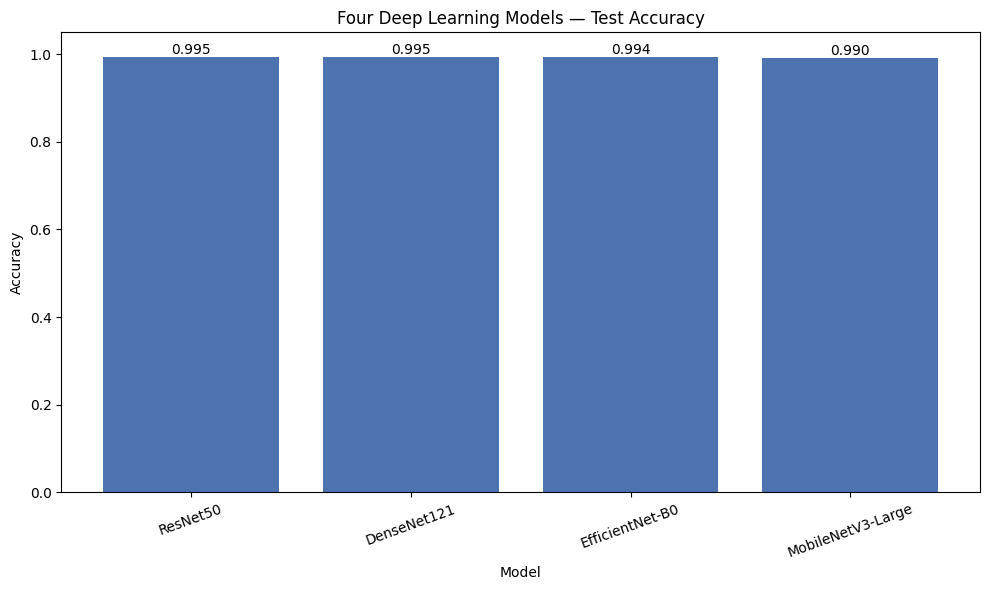

Saved: /kaggle/working/four_model_comparison/four_model_accuracy_comparison.png


In [19]:
# ============================================================
# STEP 16 — ACCURACY COMPARISON
# ============================================================

plot_df = comparison_df.dropna(subset=["Accuracy"])

plt.figure(figsize=(10, 6))
bars = plt.bar(plot_df["Model"], plot_df["Accuracy"], color="#4C72B0")
plt.bar_label(bars, fmt="%.3f")
plt.ylabel("Accuracy")
plt.xlabel("Model")
plt.title("Four Deep Learning Models — Test Accuracy")
plt.xticks(rotation=20)
plt.ylim(0, 1.05)
plt.tight_layout()

accuracy_path = COMPARISON_DIR / "four_model_accuracy_comparison.png"
plt.savefig(accuracy_path, dpi=300, bbox_inches="tight")
plt.show()
print("Saved:", accuracy_path)


## STEP 17 — Macro F1 comparison

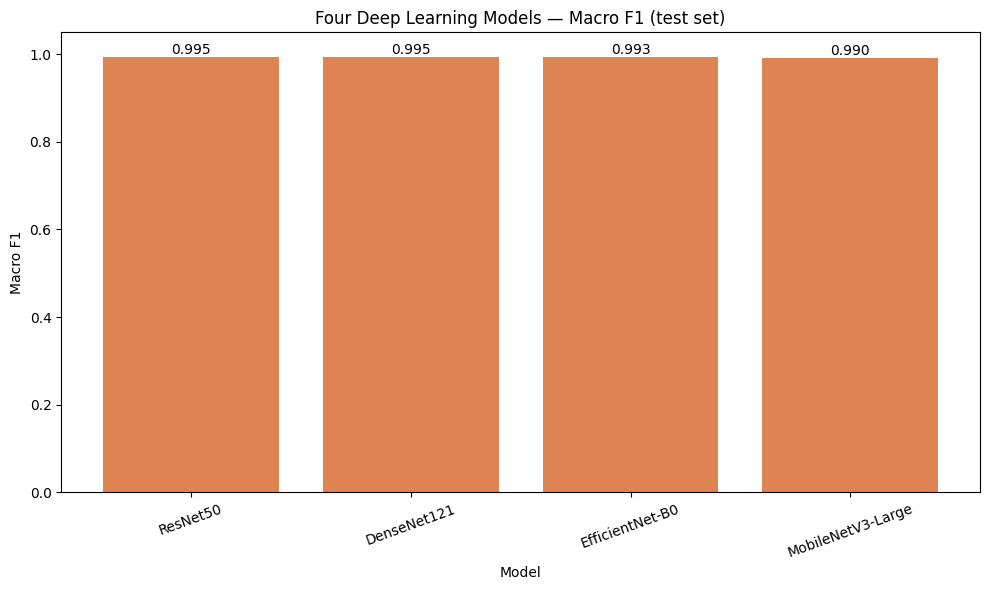

Saved: /kaggle/working/four_model_comparison/four_model_macro_f1_comparison.png


In [20]:
# ============================================================
# STEP 17 — MACRO F1 COMPARISON
# ============================================================

plot_df = comparison_df.dropna(subset=["Macro F1"])

plt.figure(figsize=(10, 6))
bars = plt.bar(plot_df["Model"], plot_df["Macro F1"], color="#DD8452")
plt.bar_label(bars, fmt="%.3f")
plt.ylabel("Macro F1")
plt.xlabel("Model")
plt.title("Four Deep Learning Models — Macro F1 (test set)")
plt.xticks(rotation=20)
plt.ylim(0, 1.05)
plt.tight_layout()

f1_path = COMPARISON_DIR / "four_model_macro_f1_comparison.png"
plt.savefig(f1_path, dpi=300, bbox_inches="tight")
plt.show()
print("Saved:", f1_path)

if len(plot_df) < len(comparison_df):
    missing = set(comparison_df["Model"]) - set(plot_df["Model"])
    print(f"\nNote: {sorted(missing)} excluded — Macro F1 unavailable (reconstructed data only).")


## STEP 18 — Bangladesh vs. International accuracy

,Model,Bangladesh Accuracy,International Accuracy
0,ResNet50,0.984536,0.999224
1,DenseNet121,0.987973,0.997673
2,EfficientNet-B0,0.982818,0.998448
3,MobileNetV3-Large,0.974227,0.997673


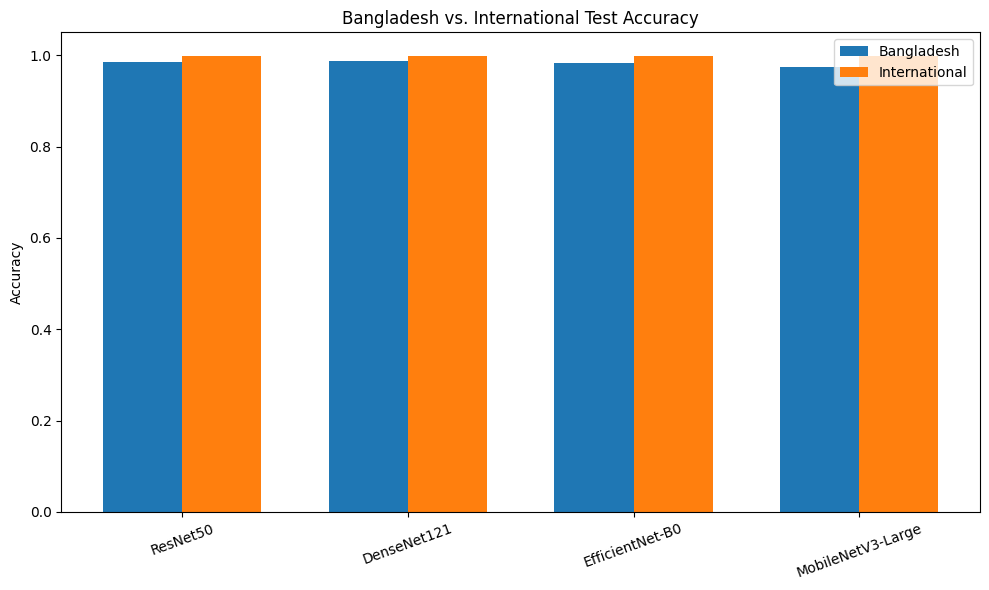

Saved: /kaggle/working/four_model_comparison/bangladesh_vs_international_accuracy.png


In [21]:
# ============================================================
# STEP 18 — DOMAIN ACCURACY COMPARISON
# ============================================================

domain_df = comparison_df[["Model", "Bangladesh Accuracy", "International Accuracy"]].copy()
display(domain_df)

plot_df = domain_df.dropna(subset=["Bangladesh Accuracy", "International Accuracy"], how="all")
x = np.arange(len(plot_df))
width = 0.35

plt.figure(figsize=(10, 6))
plt.bar(x - width / 2, plot_df["Bangladesh Accuracy"], width, label="Bangladesh")
plt.bar(x + width / 2, plot_df["International Accuracy"], width, label="International")
plt.xticks(x, plot_df["Model"], rotation=20)
plt.ylabel("Accuracy")
plt.ylim(0, 1.05)
plt.title("Bangladesh vs. International Test Accuracy")
plt.legend()
plt.tight_layout()

domain_path = COMPARISON_DIR / "bangladesh_vs_international_accuracy.png"
plt.savefig(domain_path, dpi=300, bbox_inches="tight")
plt.show()
print("Saved:", domain_path)


## STEP 19 — Per-class F1 heatmap (models with raw predictions only)

,Cardboard,Glass,Metal,Paper,Plastic
ResNet50,0.994,0.999,0.991,0.996,0.993
DenseNet121,0.994,0.996,0.993,0.996,0.993
EfficientNet-B0,0.989,0.997,0.993,0.994,0.993
MobileNetV3-Large,0.993,0.993,0.985,0.993,0.988


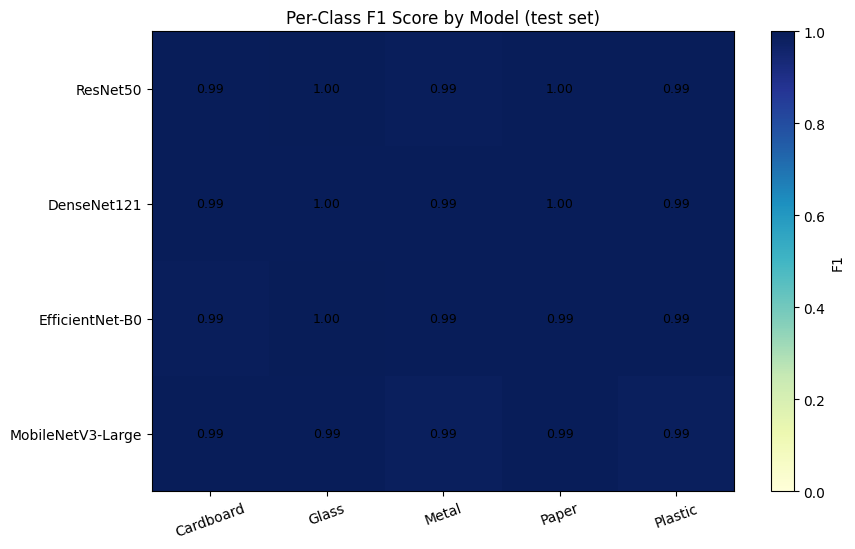

Saved: /kaggle/working/four_model_comparison/per_class_f1_heatmap.png


In [22]:
# ============================================================
# STEP 19 — PER-CLASS F1 HEATMAP
# ============================================================

per_class_rows = {}
for model_name in MODELS:
    test_m = all_metrics[model_name].get("test")
    if test_m and test_m.get("per_class_f1"):
        per_class_rows[model_name] = test_m["per_class_f1"]

if not per_class_rows:
    print("No model has per-class F1 available (all rely on reconstructed data) — skipping heatmap.")
else:
    per_class_df = pd.DataFrame(per_class_rows).T[CLASS_NAMES]
    display(per_class_df.style.format("{:.3f}").background_gradient(cmap="YlGnBu", axis=None))

    fig, ax = plt.subplots(figsize=(9, 0.9 * len(per_class_df) + 2))
    im = ax.imshow(per_class_df.values, cmap="YlGnBu", vmin=0, vmax=1, aspect="auto")
    ax.set_xticks(range(len(CLASS_NAMES)))
    ax.set_xticklabels(CLASS_NAMES, rotation=20)
    ax.set_yticks(range(len(per_class_df)))
    ax.set_yticklabels(per_class_df.index)
    for i in range(per_class_df.shape[0]):
        for j in range(per_class_df.shape[1]):
            ax.text(j, i, f"{per_class_df.values[i, j]:.2f}", ha="center", va="center",
                    color="black", fontsize=9)
    plt.colorbar(im, ax=ax, label="F1")
    plt.title("Per-Class F1 Score by Model (test set)")
    plt.tight_layout()

    per_class_path = COMPARISON_DIR / "per_class_f1_heatmap.png"
    plt.savefig(per_class_path, dpi=300, bbox_inches="tight")
    plt.show()
    print("Saved:", per_class_path)

    missing_models = set(MODELS) - set(per_class_rows)
    if missing_models:
        print(f"\nNote: {sorted(missing_models)} excluded — per-class F1 needs raw predictions.")


## STEP 20 — Confusion matrices (models with raw predictions only)

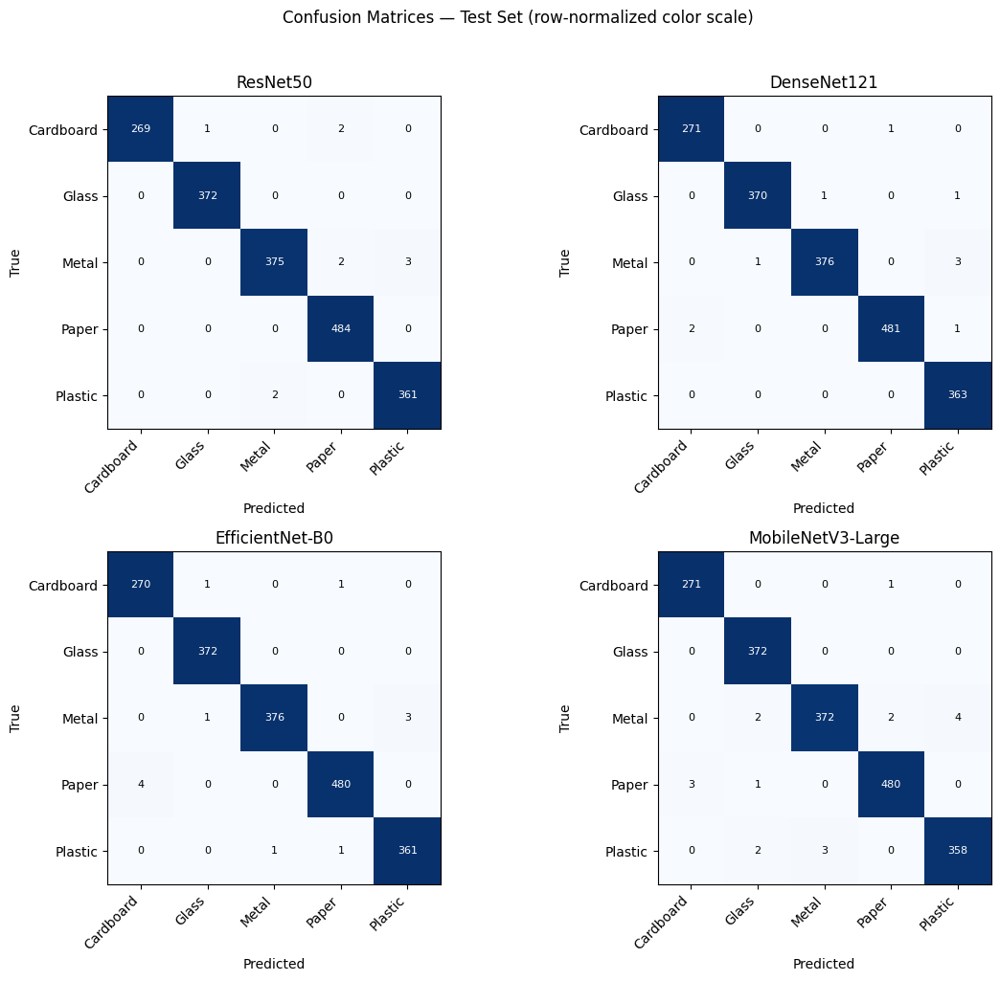

Saved: /kaggle/working/four_model_comparison/confusion_matrices_grid.png


In [23]:
# ============================================================
# STEP 20 — CONFUSION MATRIX GRID
# ============================================================

models_with_cm = [m for m in MODELS if all_metrics[m].get("test") and all_metrics[m]["test"].get("confusion_matrix") is not None]

if not models_with_cm:
    print("No confusion matrices available — skipping.")
else:
    n = len(models_with_cm)
    ncols = 2
    nrows = int(np.ceil(n / ncols))
    fig, axes = plt.subplots(nrows, ncols, figsize=(6 * ncols, 5 * nrows))
    axes = np.array(axes).reshape(-1)

    for ax, model_name in zip(axes, models_with_cm):
        cm = all_metrics[model_name]["test"]["confusion_matrix"]
        cm_norm = cm.astype(float) / cm.sum(axis=1, keepdims=True).clip(min=1)
        im = ax.imshow(cm_norm, cmap="Blues", vmin=0, vmax=1)
        ax.set_xticks(range(NUM_CLASSES))
        ax.set_xticklabels(CLASS_NAMES, rotation=45, ha="right")
        ax.set_yticks(range(NUM_CLASSES))
        ax.set_yticklabels(CLASS_NAMES)
        ax.set_xlabel("Predicted")
        ax.set_ylabel("True")
        ax.set_title(model_name)
        for i in range(NUM_CLASSES):
            for j in range(NUM_CLASSES):
                ax.text(j, i, cm[i, j], ha="center", va="center",
                        color="white" if cm_norm[i, j] > 0.5 else "black", fontsize=8)

    for ax in axes[len(models_with_cm):]:
        ax.axis("off")

    plt.suptitle("Confusion Matrices — Test Set (row-normalized color scale)", y=1.02)
    plt.tight_layout()

    cm_path = COMPARISON_DIR / "confusion_matrices_grid.png"
    plt.savefig(cm_path, dpi=300, bbox_inches="tight")
    plt.show()
    print("Saved:", cm_path)

    missing_models = set(MODELS) - set(models_with_cm)
    if missing_models:
        print(f"\nNote: {sorted(missing_models)} excluded — confusion matrix needs raw predictions.")


## STEP 21 — Calibration (ECE) comparison

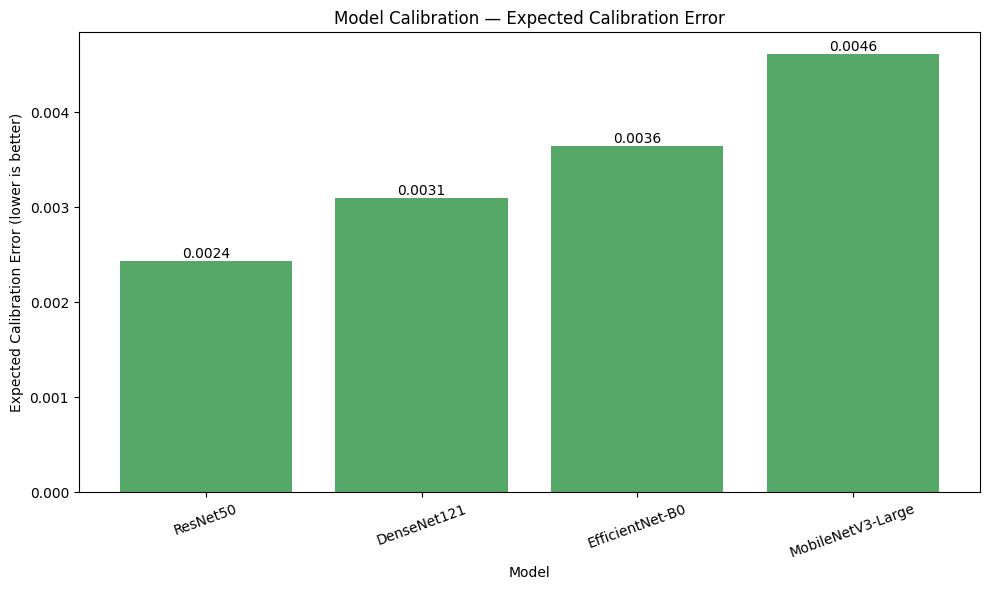

Saved: /kaggle/working/four_model_comparison/calibration_ece_comparison.png


In [24]:
# ============================================================
# STEP 21 — CALIBRATION (ECE) COMPARISON
# ============================================================

plot_df = comparison_df.dropna(subset=["ECE"])

if plot_df.empty:
    print("No model has ECE available — skipping.")
else:
    plt.figure(figsize=(10, 6))
    bars = plt.bar(plot_df["Model"], plot_df["ECE"], color="#55A868")
    plt.bar_label(bars, fmt="%.4f")
    plt.ylabel("Expected Calibration Error (lower is better)")
    plt.xlabel("Model")
    plt.title("Model Calibration — Expected Calibration Error")
    plt.xticks(rotation=20)
    plt.tight_layout()

    ece_path = COMPARISON_DIR / "calibration_ece_comparison.png"
    plt.savefig(ece_path, dpi=300, bbox_inches="tight")
    plt.show()
    print("Saved:", ece_path)


## STEP 22 — Overall ranking radar chart

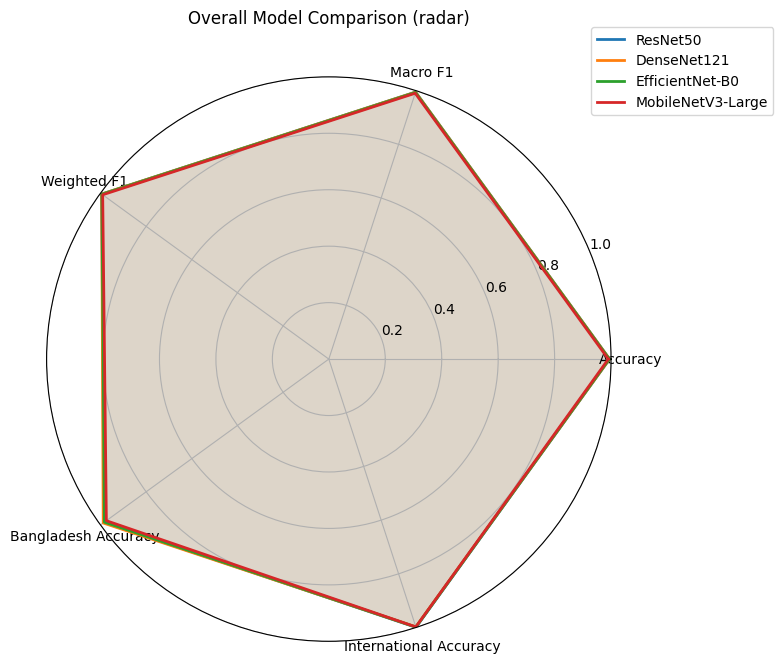

Saved: /kaggle/working/four_model_comparison/overall_radar_comparison.png

Note: rows with reconstructed-only data show 0 for unavailable metrics on the radar (not a true score).


In [25]:
# ============================================================
# STEP 22 — OVERALL RANKING RADAR CHART
# ============================================================

radar_metrics = ["Accuracy", "Macro F1", "Weighted F1", "Bangladesh Accuracy", "International Accuracy"]
radar_df = comparison_df.set_index("Model")[radar_metrics]

if radar_df.dropna(how="all").empty:
    print("Not enough data for a radar chart — skipping.")
else:
    angles = np.linspace(0, 2 * np.pi, len(radar_metrics), endpoint=False).tolist()
    angles += angles[:1]

    fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(polar=True))
    for model_name in radar_df.index:
        values = radar_df.loc[model_name].fillna(0).tolist()
        values += values[:1]
        ax.plot(angles, values, label=model_name, linewidth=2)
        ax.fill(angles, values, alpha=0.08)

    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(radar_metrics)
    ax.set_ylim(0, 1)
    ax.set_title("Overall Model Comparison (radar)", y=1.08)
    ax.legend(loc="upper right", bbox_to_anchor=(1.3, 1.1))
    plt.tight_layout()

    radar_path = COMPARISON_DIR / "overall_radar_comparison.png"
    plt.savefig(radar_path, dpi=300, bbox_inches="tight")
    plt.show()
    print("Saved:", radar_path)
    print("\nNote: rows with reconstructed-only data show 0 for unavailable metrics on the radar (not a true score).")


## STEP 23 — Best model selection

In [26]:
# ============================================================
# STEP 23 — BEST MODEL SELECTION
# ============================================================

valid_comparison = comparison_df.dropna(subset=["Accuracy"]).copy()

print("=" * 80)
print("MODEL RANKING (by test accuracy)")
print("=" * 80)

if valid_comparison.empty:
    print("⚠ No model has a usable accuracy value — cannot determine a best model.")
    best_model_row = None
else:
    ranked = valid_comparison.sort_values("Accuracy", ascending=False).reset_index(drop=True)
    display(ranked[["Model", "Accuracy", "Macro F1", "Weighted F1", "Bangladesh Accuracy", "International Accuracy"]])

    best_model_row = ranked.iloc[0]
    print("\nBEST MODEL")
    print("-" * 40)
    print("Model   :", best_model_row["Model"])
    print(f"Accuracy: {best_model_row['Accuracy']:.4%}")
    if not pd.isna(best_model_row["Macro F1"]):
        print(f"Macro F1: {best_model_row['Macro F1']:.4%}")
    else:
        print("Macro F1: N/A (reconstructed data only for this model)")


MODEL RANKING (by test accuracy)


,Model,Accuracy,Macro F1,Weighted F1,Bangladesh Accuracy,International Accuracy
0,ResNet50,0.994655,0.994575,0.994650,0.984536,0.999224
1,DenseNet121,0.994655,0.994574,0.994657,0.987973,0.997673
2,EfficientNet-B0,0.993586,0.993327,0.993587,0.982818,0.998448
3,MobileNetV3-Large,0.990379,0.990355,0.990368,0.974227,0.997673



BEST MODEL
----------------------------------------
Model   : ResNet50
Accuracy: 99.4655%
Macro F1: 99.4575%


## STEP 24 — Written research summary

In [27]:
# ============================================================
# STEP 24 — WRITTEN RESEARCH SUMMARY
# ============================================================

lines = []
lines.append("# 4-Model Comparative Research — Summary Report\n")
lines.append(f"Classes: {', '.join(CLASS_NAMES)}\n")
lines.append("## Results\n")
lines.append(comparison_df.to_markdown(index=False))
lines.append("\n\n## Data completeness\n")

for model_name in MODELS:
    test_m = all_metrics[model_name].get("test")
    if test_m is None:
        lines.append(f"- **{model_name}**: no test-set data found at all.\n")
    elif test_m["source"] == "raw predictions":
        lines.append(f"- **{model_name}**: full metrics computed from raw per-image predictions.\n")
    else:
        lines.append(f"- **{model_name}**: reconstructed from `*_domain_results.csv` "
                      f"(weighted precision/recall/F1 and accuracy only; macro metrics, ECE, "
                      f"confusion matrix, and per-class F1 are not available because the source "
                      f"notebook does not export raw per-image predictions).\n")

if best_model_row is not None:
    lines.append(f"\n## Best model\n\n**{best_model_row['Model']}** achieved the highest test "
                  f"accuracy ({best_model_row['Accuracy']:.4%}) among models with full comparable data.\n")

lines.append("\n## Recommendation\n")
lines.append("To get a fully apples-to-apples comparison (including ResNet50's macro metrics, "
              "ECE, confusion matrix, and per-class F1), re-run the ResNet50 training notebook with "
              "a final cell that exports `resnet50_test_predictions.csv`, "
              "`resnet50_bangladesh_predictions.csv`, and `resnet50_international_predictions.csv` "
              "using the same `true_idx, pred_idx, true_class, pred_class, confidence, correct, "
              "prob_<class>` schema used by the other three notebooks.\n")

report_md = "\n".join(lines)
report_path = COMPARISON_DIR / "four_model_research_summary.md"
with open(report_path, "w", encoding="utf-8") as f:
    f.write(report_md)

display(Markdown(report_md))
print("\nSaved:", report_path)


# 4-Model Comparative Research — Summary Report

Classes: Cardboard, Glass, Metal, Paper, Plastic

## Results

| Model             |   Test Samples |   Accuracy |   Macro Precision |   Macro Recall |   Macro F1 |   Weighted F1 |        ECE |   Errors |   Bangladesh Accuracy |   International Accuracy |   Total Parameters | Data Source     |
|:------------------|---------------:|-----------:|------------------:|---------------:|-----------:|--------------:|-----------:|---------:|----------------------:|-------------------------:|-------------------:|:----------------|
| ResNet50          |           1871 |   0.994655 |          0.995115 |       0.994061 |   0.994575 |      0.99465  | 0.00243259 |       10 |              0.984536 |                 0.999224 |           23518277 | raw predictions |
| DenseNet121       |           1871 |   0.994655 |          0.994333 |       0.994845 |   0.994574 |      0.994657 | 0.00309421 |       10 |              0.987973 |                 0.997673 |            6958981 | raw predictions |
| EfficientNet-B0   |           1871 |   0.993586 |          0.993002 |       0.993669 |   0.993327 |      0.993587 | 0.00364741 |       12 |              0.982818 |                 0.998448 |            4013953 | raw predictions |
| MobileNetV3-Large |           1871 |   0.990379 |          0.990106 |       0.990646 |   0.990355 |      0.990368 | 0.00460783 |       18 |              0.974227 |                 0.997673 |            4208437 | raw predictions |


## Data completeness

- **ResNet50**: full metrics computed from raw per-image predictions.

- **DenseNet121**: full metrics computed from raw per-image predictions.

- **EfficientNet-B0**: full metrics computed from raw per-image predictions.

- **MobileNetV3-Large**: full metrics computed from raw per-image predictions.


## Best model

**ResNet50** achieved the highest test accuracy (99.4655%) among models with full comparable data.


## Recommendation

To get a fully apples-to-apples comparison (including ResNet50's macro metrics, ECE, confusion matrix, and per-class F1), re-run the ResNet50 training notebook with a final cell that exports `resnet50_test_predictions.csv`, `resnet50_bangladesh_predictions.csv`, and `resnet50_international_predictions.csv` using the same `true_idx, pred_idx, true_class, pred_class, confidence, correct, prob_<class>` schema used by the other three notebooks.



Saved: /kaggle/working/four_model_comparison/four_model_research_summary.md


## STEP 25 — Output manifest / final verification

In [28]:
# ============================================================
# STEP 25 — OUTPUT MANIFEST
# ============================================================

print("=" * 80)
print("FILES WRITTEN TO", COMPARISON_DIR)
print("=" * 80)

output_files = sorted(COMPARISON_DIR.rglob("*"))
if not output_files:
    print("⚠ No output files were written — check the warnings printed above.")
else:
    for p in output_files:
        if p.is_file():
            size_kb = p.stat().st_size / 1024
            print(f" - {p.name:<45} {size_kb:>8.1f} KB")

print("\n" + "=" * 80)
print("MODEL DATA COMPLETENESS SUMMARY")
print("=" * 80)
for model_name in MODELS:
    statuses = []
    for split in PREDICTION_SUFFIX:
        m = all_metrics[model_name].get(split)
        if m is None:
            statuses.append(f"{split}=MISSING")
        else:
            statuses.append(f"{split}={m['source']}")
    print(f"{model_name:<20} " + " | ".join(statuses))

print("\n✓ NOTEBOOK COMPLETE")


FILES WRITTEN TO /kaggle/working/four_model_comparison
 - bangladesh_vs_international_accuracy.png         143.1 KB
 - calibration_ece_comparison.png                   170.8 KB
 - confusion_matrices_grid.png                      281.0 KB
 - four_model_accuracy_comparison.png               143.4 KB
 - four_model_macro_f1_comparison.png               142.7 KB
 - four_model_performance_comparison.csv              0.9 KB
 - four_model_research_summary.md                     2.4 KB
 - overall_radar_comparison.png                     425.6 KB
 - per_class_f1_heatmap.png                         146.0 KB

MODEL DATA COMPLETENESS SUMMARY
ResNet50             test=raw predictions | bangladesh=raw predictions | international=raw predictions
DenseNet121          test=raw predictions | bangladesh=raw predictions | international=raw predictions
EfficientNet-B0      test=raw predictions | bangladesh=raw predictions | international=raw predictions
MobileNetV3-Large    test=raw predictions | bangladesh

In [29]:
# ============================================================
# STEP 26 — MCNEMAR'S TEST (PAIRWISE STATISTICAL SIGNIFICANCE)
# ============================================================
from itertools import combinations

try:
    from statsmodels.stats.contingency_tables import mcnemar
    HAVE_STATSMODELS = True
except ImportError:
    HAVE_STATSMODELS = False
    from scipy.stats import binomtest

print("=" * 80)
print("MCNEMAR'S TEST — PAIRWISE MODEL COMPARISON (test split)")
print("=" * 80)

mcnemar_rows = []

for model_a, model_b in combinations(MODELS, 2):
    df_a = predictions[model_a].get("test")
    df_b = predictions[model_b].get("test")
    if df_a is None or df_b is None or len(df_a) != len(df_b):
        print(f"⚠ Skipping {model_a} vs {model_b}: predictions not aligned/available")
        continue

    correct_a = df_a["correct"].astype(bool).to_numpy()
    correct_b = df_b["correct"].astype(bool).to_numpy()

    # Contingency table:
    # b = A correct, B wrong   |   c = A wrong, B correct
    b = int(np.sum(correct_a & ~correct_b))
    c = int(np.sum(~correct_a & correct_b))
    both_correct = int(np.sum(correct_a & correct_b))
    both_wrong = int(np.sum(~correct_a & ~correct_b))

    table = [[both_correct, b], [c, both_wrong]]

    if HAVE_STATSMODELS:
        exact = (b + c) < 25  # small discordant count -> exact binomial test
        result = mcnemar(table, exact=exact, correction=not exact)
        p_value = result.pvalue
        stat = result.statistic
    else:
        # Manual exact McNemar via binomial test
        n = b + c
        if n == 0:
            p_value = 1.0
        else:
            p_value = binomtest(min(b, c), n, 0.5).pvalue
        stat = np.nan

    sig = "significant (p<0.05)" if p_value < 0.05 else "not significant"
    mcnemar_rows.append({
        "Model A": model_a, "Model B": model_b,
        "A_correct_B_wrong": b, "A_wrong_B_correct": c,
        "statistic": stat, "p_value": p_value, "result": sig
    })
    print(f"{model_a:<18} vs {model_b:<18}: p={p_value:.4f} -> {sig}")

mcnemar_df = pd.DataFrame(mcnemar_rows)
mcnemar_path = COMPARISON_DIR / "mcnemar_pairwise_significance.csv"
mcnemar_df.to_csv(mcnemar_path, index=False)
display(mcnemar_df)
print("\nSaved:", mcnemar_path)

MCNEMAR'S TEST — PAIRWISE MODEL COMPARISON (test split)
ResNet50           vs DenseNet121       : p=1.0000 -> not significant
ResNet50           vs EfficientNet-B0   : p=0.8036 -> not significant
ResNet50           vs MobileNetV3-Large : p=0.1153 -> not significant
DenseNet121        vs EfficientNet-B0   : p=0.7744 -> not significant
DenseNet121        vs MobileNetV3-Large : p=0.1153 -> not significant
EfficientNet-B0    vs MobileNetV3-Large : p=0.2863 -> not significant


,Model A,Model B,A_correct_B_wrong,A_wrong_B_correct,statistic,p_value,result
0,ResNet50,DenseNet121,6,6,6.0,1.000000,not significant
1,ResNet50,EfficientNet-B0,9,7,7.0,0.803619,not significant
2,ResNet50,MobileNetV3-Large,14,6,6.0,0.115318,not significant
3,DenseNet121,EfficientNet-B0,7,5,5.0,0.774414,not significant
4,DenseNet121,MobileNetV3-Large,14,6,6.0,0.115318,not significant
5,EfficientNet-B0,MobileNetV3-Large,14,8,8.0,0.286279,not significant



Saved: /kaggle/working/four_model_comparison/mcnemar_pairwise_significance.csv


In [30]:
# ============================================================
# STEP 27 — 95% CONFIDENCE INTERVAL FOR ACCURACY (Wilson score)
# ============================================================
from math import sqrt

def wilson_ci(correct_count, n, z=1.96):
    if n == 0:
        return (np.nan, np.nan)
    p = correct_count / n
    denom = 1 + z**2 / n
    centre = p + z**2 / (2 * n)
    margin = z * sqrt((p * (1 - p) / n) + (z**2 / (4 * n**2)))
    return ((centre - margin) / denom, (centre + margin) / denom)

ci_rows = []
for model_name in MODELS:
    test_m = all_metrics[model_name].get("test")
    if test_m is None:
        continue
    n = test_m["n_samples"]
    correct_count = n - test_m["n_errors"]
    lo, hi = wilson_ci(correct_count, n)
    ci_rows.append({
        "Model": model_name,
        "Accuracy": test_m["accuracy"],
        "CI_lower_95": lo,
        "CI_upper_95": hi,
        "CI_width": hi - lo,
    })

ci_df = pd.DataFrame(ci_rows)
comparison_df = comparison_df.merge(ci_df[["Model", "CI_lower_95", "CI_upper_95"]], on="Model", how="left")

ci_path = COMPARISON_DIR / "accuracy_confidence_intervals.csv"
ci_df.to_csv(ci_path, index=False)
display(ci_df)
print("Saved:", ci_path)

,Model,Accuracy,CI_lower_95,CI_upper_95,CI_width
0,ResNet50,0.994655,0.990189,0.997094,0.006905
1,DenseNet121,0.994655,0.990189,0.997094,0.006905
2,EfficientNet-B0,0.993586,0.988823,0.996327,0.007505
3,MobileNetV3-Large,0.990379,0.984843,0.993906,0.009063


Saved: /kaggle/working/four_model_comparison/accuracy_confidence_intervals.csv


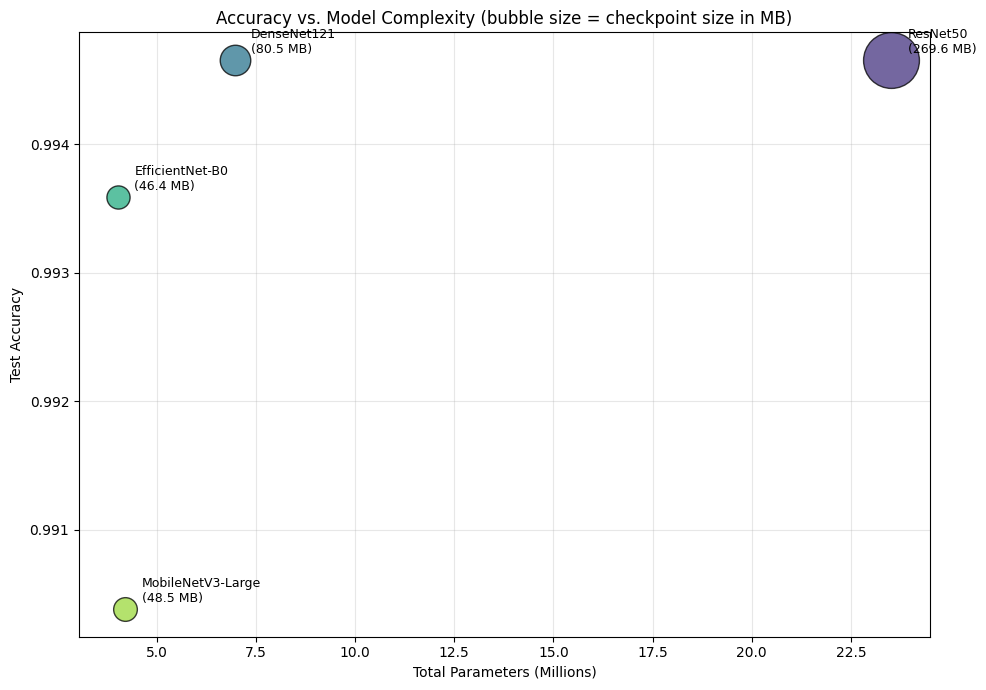

Saved: /kaggle/working/four_model_comparison/params_vs_accuracy_tradeoff.png


,Model,Accuracy,Total Parameters,Model Size (MB)
0,ResNet50,0.994655,23518277,269.583480
1,DenseNet121,0.994655,6958981,80.527013
2,EfficientNet-B0,0.993586,4013953,46.404291
3,MobileNetV3-Large,0.990379,4208437,48.507068


In [31]:
# ============================================================
# STEP 28 — PARAMS vs ACCURACY TRADE-OFF (with model-size bubble)
# ============================================================

def best_checkpoint_size_mb(model_name):
    """Pick the *_best.pth for this model and return its size in MB."""
    candidates = [p for p in model_checkpoints.get(model_name, []) if "best" in p.name.lower()]
    if not candidates:
        candidates = model_checkpoints.get(model_name, [])
    if not candidates:
        return np.nan
    return candidates[0].stat().st_size / (1024 ** 2)

comparison_df["Model Size (MB)"] = comparison_df["Model"].apply(best_checkpoint_size_mb)

plot_df = comparison_df.dropna(subset=["Total Parameters", "Accuracy"])

plt.figure(figsize=(10, 7))
sizes = (plot_df["Model Size (MB)"].fillna(20) * 6)  # scale bubble size
colors = plt.cm.viridis(np.linspace(0.15, 0.85, len(plot_df)))

for (_, row), color in zip(plot_df.iterrows(), colors):
    plt.scatter(row["Total Parameters"] / 1e6, row["Accuracy"],
                s=row["Model Size (MB)"] * 6 if not pd.isna(row["Model Size (MB)"]) else 100,
                color=color, alpha=0.75, edgecolors="black", linewidth=1)
    plt.annotate(f"{row['Model']}\n({row['Model Size (MB)']:.1f} MB)",
                 (row["Total Parameters"] / 1e6, row["Accuracy"]),
                 textcoords="offset points", xytext=(12, 5), fontsize=9)

plt.xlabel("Total Parameters (Millions)")
plt.ylabel("Test Accuracy")
plt.title("Accuracy vs. Model Complexity (bubble size = checkpoint size in MB)")
plt.grid(alpha=0.3)
plt.tight_layout()

tradeoff_path = COMPARISON_DIR / "params_vs_accuracy_tradeoff.png"
plt.savefig(tradeoff_path, dpi=300, bbox_inches="tight")
plt.show()
print("Saved:", tradeoff_path)

display(comparison_df[["Model", "Accuracy", "Total Parameters", "Model Size (MB)"]])

In [32]:
# ============================================================
# STEP 29 — INFERENCE SPEED BENCHMARK
# ============================================================
import time
import torch
import torchvision.models as tvm

ARCH_BUILDERS = {
    "ResNet50": lambda: tvm.resnet50(num_classes=NUM_CLASSES),
    "DenseNet121": lambda: tvm.densenet121(num_classes=NUM_CLASSES),
    "EfficientNet-B0": lambda: tvm.efficientnet_b0(num_classes=NUM_CLASSES),
    "MobileNetV3-Large": lambda: tvm.mobilenet_v3_large(num_classes=NUM_CLASSES),
}

def benchmark_model(model_fn, device, input_size=224, batch_size=1, n_warmup=10, n_iters=50):
    model = model_fn().to(device).eval()
    dummy = torch.randn(batch_size, 3, input_size, input_size, device=device)
    with torch.no_grad():
        for _ in range(n_warmup):
            model(dummy)
        if device.type == "cuda":
            torch.cuda.synchronize()
        start = time.perf_counter()
        for _ in range(n_iters):
            model(dummy)
        if device.type == "cuda":
            torch.cuda.synchronize()
        end = time.perf_counter()
    avg_ms = (end - start) / n_iters * 1000
    del model
    return avg_ms

devices = [torch.device("cpu")]
if torch.cuda.is_available():
    devices.append(torch.device("cuda"))

speed_rows = []
print("=" * 80)
print("INFERENCE SPEED BENCHMARK (architecture-level, untrained weights — timing only)")
print("=" * 80)
for model_name, builder in ARCH_BUILDERS.items():
    row = {"Model": model_name}
    for device in devices:
        avg_ms = benchmark_model(builder, device)
        row[f"Latency_{device.type}_ms"] = avg_ms
        row[f"Throughput_{device.type}_img_per_sec"] = 1000 / avg_ms
        print(f"{model_name:<20} [{device.type}] {avg_ms:.2f} ms/img  |  {1000/avg_ms:.1f} img/sec")
    speed_rows.append(row)

speed_df = pd.DataFrame(speed_rows)
comparison_df = comparison_df.merge(speed_df, on="Model", how="left")

speed_path = COMPARISON_DIR / "inference_speed_benchmark.csv"
speed_df.to_csv(speed_path, index=False)
display(speed_df)
print("\nSaved:", speed_path)

INFERENCE SPEED BENCHMARK (architecture-level, untrained weights — timing only)
ResNet50             [cpu] 74.72 ms/img  |  13.4 img/sec
ResNet50             [cuda] 5.88 ms/img  |  170.2 img/sec
DenseNet121          [cpu] 85.07 ms/img  |  11.8 img/sec
DenseNet121          [cuda] 13.87 ms/img  |  72.1 img/sec
EfficientNet-B0      [cpu] 32.02 ms/img  |  31.2 img/sec
EfficientNet-B0      [cuda] 8.00 ms/img  |  125.1 img/sec
MobileNetV3-Large    [cpu] 21.89 ms/img  |  45.7 img/sec
MobileNetV3-Large    [cuda] 6.09 ms/img  |  164.1 img/sec


,Model,Latency_cpu_ms,Throughput_cpu_img_per_sec,Latency_cuda_ms,Throughput_cuda_img_per_sec
0,ResNet50,74.715760,13.384057,5.875925,170.185961
1,DenseNet121,85.069992,11.755026,13.869114,72.102660
2,EfficientNet-B0,32.022795,31.227755,7.995177,125.075410
3,MobileNetV3-Large,21.889892,45.683185,6.092047,164.148441



Saved: /kaggle/working/four_model_comparison/inference_speed_benchmark.csv


In [33]:
# ============================================================
# STEP 30 — TOP CONFUSED CLASS PAIRS PER MODEL
# ============================================================

confusion_summary_rows = []
print("=" * 80)
print("TOP MISCLASSIFIED CLASS PAIRS (test set)")
print("=" * 80)

for model_name in MODELS:
    test_m = all_metrics[model_name].get("test")
    if test_m is None or test_m.get("confusion_matrix") is None:
        continue
    cm = test_m["confusion_matrix"]
    pairs = []
    for i in range(NUM_CLASSES):
        for j in range(NUM_CLASSES):
            if i != j and cm[i, j] > 0:
                pairs.append((CLASS_NAMES[i], CLASS_NAMES[j], int(cm[i, j])))
    pairs.sort(key=lambda x: x[2], reverse=True)

    print(f"\n{model_name}")
    for true_cls, pred_cls, count in pairs[:3]:
        print(f"  True={true_cls:<10} -> Predicted={pred_cls:<10} : {count} errors")
        confusion_summary_rows.append({
            "Model": model_name, "True Class": true_cls,
            "Predicted Class": pred_cls, "Count": count
        })

confusion_summary_df = pd.DataFrame(confusion_summary_rows)
confusion_summary_path = COMPARISON_DIR / "top_confused_class_pairs.csv"
confusion_summary_df.to_csv(confusion_summary_path, index=False)
display(confusion_summary_df)
print("\nSaved:", confusion_summary_path)

TOP MISCLASSIFIED CLASS PAIRS (test set)

ResNet50
  True=Metal      -> Predicted=Plastic    : 3 errors
  True=Cardboard  -> Predicted=Paper      : 2 errors
  True=Metal      -> Predicted=Paper      : 2 errors

DenseNet121
  True=Metal      -> Predicted=Plastic    : 3 errors
  True=Paper      -> Predicted=Cardboard  : 2 errors
  True=Cardboard  -> Predicted=Paper      : 1 errors

EfficientNet-B0
  True=Paper      -> Predicted=Cardboard  : 4 errors
  True=Metal      -> Predicted=Plastic    : 3 errors
  True=Cardboard  -> Predicted=Glass      : 1 errors

MobileNetV3-Large
  True=Metal      -> Predicted=Plastic    : 4 errors
  True=Paper      -> Predicted=Cardboard  : 3 errors
  True=Plastic    -> Predicted=Metal      : 3 errors


,Model,True Class,Predicted Class,Count
0,ResNet50,Metal,Plastic,3
1,ResNet50,Cardboard,Paper,2
2,ResNet50,Metal,Paper,2
3,DenseNet121,Metal,Plastic,3
4,DenseNet121,Paper,Cardboard,2
5,DenseNet121,Cardboard,Paper,1
6,EfficientNet-B0,Paper,Cardboard,4
7,EfficientNet-B0,Metal,Plastic,3
8,EfficientNet-B0,Cardboard,Glass,1
9,MobileNetV3-Large,Metal,Plastic,4



Saved: /kaggle/working/four_model_comparison/top_confused_class_pairs.csv


In [34]:
# ============================================================
# STEP 31 — LITERATURE COMPARISON TABLE (fill manually with paper values)
# ============================================================

literature_comparison = pd.DataFrame([
    {"Study": "This work (ResNet50)", "Dataset": "Final Waste Dataset (BD + Intl)",
     "Classes": NUM_CLASSES, "Accuracy": comparison_df.loc[comparison_df["Model"]=="ResNet50","Accuracy"].values[0]},
    {"Study": "Prior work 1 (fill in)", "Dataset": "TrashNet", "Classes": 6, "Accuracy": np.nan},
    {"Study": "Prior work 2 (fill in)", "Dataset": "TACO",     "Classes": np.nan, "Accuracy": np.nan},
    {"Study": "Prior work 3 (fill in)", "Dataset": "...",      "Classes": np.nan, "Accuracy": np.nan},
])

lit_path = COMPARISON_DIR / "literature_comparison_template.csv"
literature_comparison.to_csv(lit_path, index=False)
display(literature_comparison)
print("Saved template:", lit_path)
print("\n⚠ এখানে related-work paper গুলোর প্রকৃত accuracy/dataset বসিয়ে টেবিলটা পূরণ করুন Related Work section-এর জন্য।")

,Study,Dataset,Classes,Accuracy
0,This work (ResNet50),Final Waste Dataset (BD + Intl),5.0,0.994655
1,Prior work 1 (fill in),TrashNet,6.0,NaN
2,Prior work 2 (fill in),TACO,NaN,NaN
3,Prior work 3 (fill in),...,NaN,NaN


Saved template: /kaggle/working/four_model_comparison/literature_comparison_template.csv

⚠ এখানে related-work paper গুলোর প্রকৃত accuracy/dataset বসিয়ে টেবিলটা পূরণ করুন Related Work section-এর জন্য।


In [35]:
# ============================================================
# STEP 32 — UPDATED FINAL RESEARCH SUMMARY (with new analyses)
# ============================================================

extra_lines = []
extra_lines.append("\n## Statistical Significance (McNemar's Test)\n")
extra_lines.append(mcnemar_df.to_markdown(index=False) if not mcnemar_df.empty else "N/A\n")

extra_lines.append("\n## 95% Confidence Intervals (Accuracy)\n")
extra_lines.append(ci_df.to_markdown(index=False))

extra_lines.append("\n## Efficiency: Parameters, Size, Inference Speed\n")
eff_cols = ["Model", "Total Parameters", "Model Size (MB)"] + \
           [c for c in comparison_df.columns if "Latency" in c or "Throughput" in c]
extra_lines.append(comparison_df[eff_cols].to_markdown(index=False))

extra_lines.append("\n## Top Confused Class Pairs\n")
extra_lines.append(confusion_summary_df.to_markdown(index=False) if not confusion_summary_df.empty else "N/A\n")

updated_report = report_md + "\n".join(extra_lines)

updated_report_path = COMPARISON_DIR / "four_model_research_summary_FULL.md"
with open(updated_report_path, "w", encoding="utf-8") as f:
    f.write(updated_report)

display(Markdown("\n".join(extra_lines)))
print("\nSaved:", updated_report_path)


## Statistical Significance (McNemar's Test)

| Model A         | Model B           |   A_correct_B_wrong |   A_wrong_B_correct |   statistic |   p_value | result          |
|:----------------|:------------------|--------------------:|--------------------:|------------:|----------:|:----------------|
| ResNet50        | DenseNet121       |                   6 |                   6 |           6 |  1        | not significant |
| ResNet50        | EfficientNet-B0   |                   9 |                   7 |           7 |  0.803619 | not significant |
| ResNet50        | MobileNetV3-Large |                  14 |                   6 |           6 |  0.115318 | not significant |
| DenseNet121     | EfficientNet-B0   |                   7 |                   5 |           5 |  0.774414 | not significant |
| DenseNet121     | MobileNetV3-Large |                  14 |                   6 |           6 |  0.115318 | not significant |
| EfficientNet-B0 | MobileNetV3-Large |                  14 |                   8 |           8 |  0.286279 | not significant |

## 95% Confidence Intervals (Accuracy)

| Model             |   Accuracy |   CI_lower_95 |   CI_upper_95 |   CI_width |
|:------------------|-----------:|--------------:|--------------:|-----------:|
| ResNet50          |   0.994655 |      0.990189 |      0.997094 | 0.00690515 |
| DenseNet121       |   0.994655 |      0.990189 |      0.997094 | 0.00690515 |
| EfficientNet-B0   |   0.993586 |      0.988823 |      0.996327 | 0.00750477 |
| MobileNetV3-Large |   0.990379 |      0.984843 |      0.993906 | 0.0090626  |

## Efficiency: Parameters, Size, Inference Speed

| Model             |   Total Parameters |   Model Size (MB) |   Latency_cpu_ms |   Throughput_cpu_img_per_sec |   Latency_cuda_ms |   Throughput_cuda_img_per_sec |
|:------------------|-------------------:|------------------:|-----------------:|-----------------------------:|------------------:|------------------------------:|
| ResNet50          |           23518277 |          269.583  |          74.7158 |                      13.3841 |           5.87593 |                      170.186  |
| DenseNet121       |            6958981 |           80.527  |          85.07   |                      11.755  |          13.8691  |                       72.1027 |
| EfficientNet-B0   |            4013953 |           46.4043 |          32.0228 |                      31.2278 |           7.99518 |                      125.075  |
| MobileNetV3-Large |            4208437 |           48.5071 |          21.8899 |                      45.6832 |           6.09205 |                      164.148  |

## Top Confused Class Pairs

| Model             | True Class   | Predicted Class   |   Count |
|:------------------|:-------------|:------------------|--------:|
| ResNet50          | Metal        | Plastic           |       3 |
| ResNet50          | Cardboard    | Paper             |       2 |
| ResNet50          | Metal        | Paper             |       2 |
| DenseNet121       | Metal        | Plastic           |       3 |
| DenseNet121       | Paper        | Cardboard         |       2 |
| DenseNet121       | Cardboard    | Paper             |       1 |
| EfficientNet-B0   | Paper        | Cardboard         |       4 |
| EfficientNet-B0   | Metal        | Plastic           |       3 |
| EfficientNet-B0   | Cardboard    | Glass             |       1 |
| MobileNetV3-Large | Metal        | Plastic           |       4 |
| MobileNetV3-Large | Paper        | Cardboard         |       3 |
| MobileNetV3-Large | Plastic      | Metal             |       3 |


Saved: /kaggle/working/four_model_comparison/four_model_research_summary_FULL.md


In [36]:
# ============================================================
# STEP 33 — ZIP ALL COMPARISON OUTPUTS FOR DOWNLOAD
# ============================================================
import shutil

zip_base = KAGGLE_WORKING / "four_model_comparison_ALL_RESULTS"
zip_path = shutil.make_archive(str(zip_base), "zip", root_dir=COMPARISON_DIR)

print("=" * 80)
print("FINAL COMPARISON PACKAGE")
print("=" * 80)
print("ZIP:", zip_path)
print("Size:", f"{os.path.getsize(zip_path)/1024/1024:.2f} MB")

print("\nContents:")
for f in sorted(COMPARISON_DIR.rglob("*")):
    if f.is_file():
        print(" -", f.name)

FINAL COMPARISON PACKAGE
ZIP: /kaggle/working/four_model_comparison_ALL_RESULTS.zip
Size: 1.30 MB

Contents:
 - accuracy_confidence_intervals.csv
 - bangladesh_vs_international_accuracy.png
 - calibration_ece_comparison.png
 - confusion_matrices_grid.png
 - four_model_accuracy_comparison.png
 - four_model_macro_f1_comparison.png
 - four_model_performance_comparison.csv
 - four_model_research_summary.md
 - four_model_research_summary_FULL.md
 - inference_speed_benchmark.csv
 - literature_comparison_template.csv
 - mcnemar_pairwise_significance.csv
 - overall_radar_comparison.png
 - params_vs_accuracy_tradeoff.png
 - per_class_f1_heatmap.png
 - top_confused_class_pairs.csv


In [37]:
# ============================================================
# STEP 33 — GRAD-CAM VISUALIZATION (best + worst model, confused samples)
# ============================================================
import torch
import torch.nn.functional as F
import torchvision.models as tvm
import torchvision.transforms as T
from PIL import Image
import cv2

# ---- 1. Rebuild architecture + load trained weights ----
ARCH_BUILDERS = {
    "ResNet50": lambda: tvm.resnet50(num_classes=NUM_CLASSES),
    "DenseNet121": lambda: tvm.densenet121(num_classes=NUM_CLASSES),
    "EfficientNet-B0": lambda: tvm.efficientnet_b0(num_classes=NUM_CLASSES),
    "MobileNetV3-Large": lambda: tvm.mobilenet_v3_large(num_classes=NUM_CLASSES),
}

# Last conv layer for each architecture (Grad-CAM target layer)
TARGET_LAYER = {
    "ResNet50": lambda m: m.layer4[-1],
    "DenseNet121": lambda m: m.features[-1],
    "EfficientNet-B0": lambda m: m.features[-1],
    "MobileNetV3-Large": lambda m: m.features[-1],
}

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

def load_trained_model(model_name):
    """Loads architecture + best checkpoint weights."""
    model = ARCH_BUILDERS[model_name]()
    ckpts = [p for p in model_checkpoints.get(model_name, []) if "best" in p.name.lower()]
    if not ckpts:
        ckpts = model_checkpoints.get(model_name, [])
    if not ckpts:
        print(f"⚠ No checkpoint found for {model_name}")
        return None
    state = torch.load(ckpts[0], map_location=DEVICE)
    # Handle common checkpoint formats
    if isinstance(state, dict) and "model_state_dict" in state:
        state = state["model_state_dict"]
    elif isinstance(state, dict) and "state_dict" in state:
        state = state["state_dict"]
    model.load_state_dict(state, strict=False)
    model.to(DEVICE).eval()
    return model

# ---- 2. Simple Grad-CAM implementation ----
class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.gradients = None
        self.activations = None
        target_layer.register_forward_hook(self._save_activation)
        target_layer.register_full_backward_hook(self._save_gradient)

    def _save_activation(self, module, input, output):
        self.activations = output.detach()

    def _save_gradient(self, module, grad_input, grad_output):
        self.gradients = grad_output[0].detach()

    def generate(self, input_tensor, class_idx):
        output = self.model(input_tensor)
        self.model.zero_grad()
        score = output[0, class_idx]
        score.backward()

        weights = self.gradients.mean(dim=(2, 3), keepdim=True)
        cam = (weights * self.activations).sum(dim=1, keepdim=True)
        cam = F.relu(cam)
        cam = F.interpolate(cam, size=input_tensor.shape[2:], mode="bilinear", align_corners=False)
        cam = cam.squeeze().cpu().numpy()
        cam = (cam - cam.min()) / (cam.max() - cam.min() + 1e-8)
        return cam

IMG_TRANSFORM = T.Compose([
    T.Resize((224, 224)),
    T.ToTensor(),
    T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

def overlay_cam_on_image(pil_img, cam):
    img_np = np.array(pil_img.resize((224, 224))).astype(np.float32) / 255.0
    heatmap = cv2.applyColorMap(np.uint8(255 * cam), cv2.COLORMAP_JET)
    heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB).astype(np.float32) / 255.0
    overlay = 0.55 * img_np + 0.45 * heatmap
    return np.clip(overlay, 0, 1)

print("✓ Grad-CAM utilities ready")

✓ Grad-CAM utilities ready


In [38]:
# ============================================================
# STEP 33b — RUN GRAD-CAM ON A FEW CONFUSED / SAMPLE IMAGES
# ============================================================
# ⚠️ IMPORTANT: You need the actual image file path column in your
# prediction CSVs (e.g. "filepath" or "image_path"). Check the column
# name first:
sample_df = predictions["ResNet50"]["test"]
print("Available columns:", list(sample_df.columns))

Available columns: ['filename', 'class', 'source', 'country', 'dataset_group', 'original_path', 'image_path', 'true_idx', 'pred_idx', 'true_class', 'pred_class', 'confidence', 'correct', 'prob_Cardboard', 'prob_Glass', 'prob_Metal', 'prob_Paper', 'prob_Plastic']


In [39]:
# ============================================================
# STEP 33c — RESOLVE IMAGE PATHS (handles Kaggle path differences)
# ============================================================
# The image_path column may point to a path valid only in the original
# training notebook's environment. This resolves it against the current
# /kaggle/input tree using the filename, with graceful fallback.

def resolve_image_path(row):
    candidates = [row.get("image_path"), row.get("original_path")]
    for c in candidates:
        if c and Path(c).exists():
            return Path(c)
    # Fallback: search by filename across all indexed input files
    fname = row.get("filename")
    if fname:
        matches = [p for p in ALL_INPUT_FILES if p.name == fname]
        if matches:
            return matches[0]
    return None

# quick sanity check on a few rows
test_check = sample_df.head(5).apply(resolve_image_path, axis=1)
print("Resolved paths (sample):")
for p in test_check:
    print(" ->", p, "| exists:", p.exists() if p else False)

Resolved paths (sample):
 -> /kaggle/input/notebooks/kbmhkhan/full-final-waste-dataset-structure/Final_Waste_Dataset_Split/test_international/Metal/INTL__Metal(118)_aug4.jpg | exists: True
 -> /kaggle/input/notebooks/kbmhkhan/full-final-waste-dataset-structure/Final_Waste_Dataset_Split/test_international/Paper/INTL__Paper(278)_aug3.jpg | exists: True
 -> /kaggle/input/notebooks/kbmhkhan/full-final-waste-dataset-structure/Final_Waste_Dataset_Split/test_bangladesh/Paper/BD__BDWaste__BDWaste_Paper__000057.jpg | exists: True
 -> /kaggle/input/notebooks/kbmhkhan/full-final-waste-dataset-structure/Final_Waste_Dataset_Split/test_international/Metal/INTL__Metal(61)_aug3.jpg | exists: True
 -> /kaggle/input/notebooks/kbmhkhan/full-final-waste-dataset-structure/Final_Waste_Dataset_Split/test/Plastic/BD__BDWaste__BDWaste_Bottle__000046.jpg | exists: True


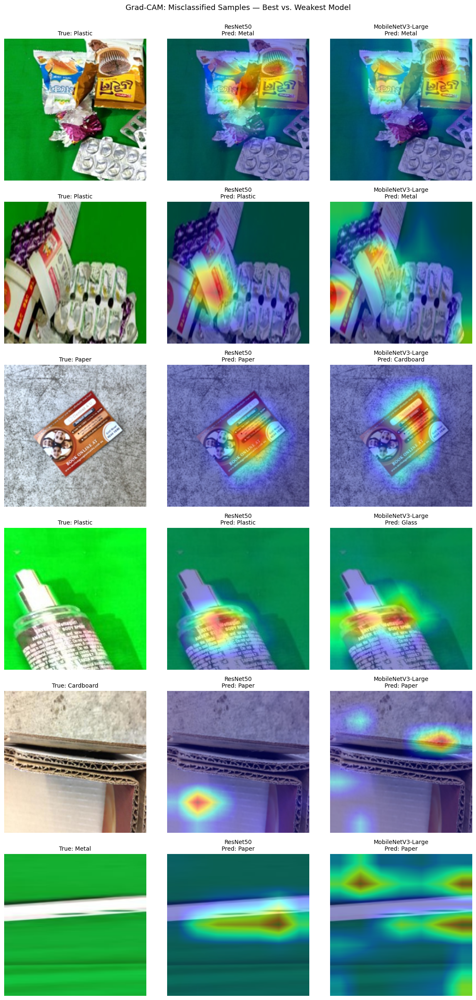


Saved: /kaggle/working/four_model_comparison/gradcam_misclassified_comparison.png


In [40]:
# ============================================================
# STEP 33d — RUN GRAD-CAM: BEST MODEL vs WEAKEST MODEL, ON CONFUSED SAMPLES
# ============================================================

BEST_MODEL = "ResNet50"            # highest accuracy
WEAK_MODEL = "MobileNetV3-Large"   # lowest accuracy (for contrast)

N_SAMPLES = 6  # how many misclassified images to visualize

# Pick misclassified samples from the weaker model's test predictions
# (most informative — shows where even the models struggle)
wrong_df = predictions[WEAK_MODEL]["test"]
wrong_df = wrong_df[wrong_df["correct"] == False].copy()

# resolve image paths and keep only ones that actually exist on disk
wrong_df["resolved_path"] = wrong_df.apply(resolve_image_path, axis=1)
wrong_df = wrong_df[wrong_df["resolved_path"].notna()]

if wrong_df.empty:
    print("⚠ No misclassified images with resolvable paths found. Try correct=True samples instead.")
else:
    sample_rows = wrong_df.sample(n=min(N_SAMPLES, len(wrong_df)), random_state=42)

    model_best = load_trained_model(BEST_MODEL)
    model_weak = load_trained_model(WEAK_MODEL)

    cam_best = GradCAM(model_best, TARGET_LAYER[BEST_MODEL](model_best))
    cam_weak = GradCAM(model_weak, TARGET_LAYER[WEAK_MODEL](model_weak))

    fig, axes = plt.subplots(len(sample_rows), 3, figsize=(12, 4 * len(sample_rows)))
    if len(sample_rows) == 1:
        axes = axes.reshape(1, -1)

    for i, (_, row) in enumerate(sample_rows.iterrows()):
        img_path = row["resolved_path"]
        pil_img = Image.open(img_path).convert("RGB")
        input_tensor = IMG_TRANSFORM(pil_img).unsqueeze(0).to(DEVICE)
        input_tensor.requires_grad_(False)

        true_idx = int(row["true_idx"])

        # Original image
        axes[i, 0].imshow(pil_img.resize((224, 224)))
        axes[i, 0].set_title(f"True: {row['true_class']}", fontsize=10)
        axes[i, 0].axis("off")

        # Grad-CAM: best model
        input_tensor_b = IMG_TRANSFORM(pil_img).unsqueeze(0).to(DEVICE).requires_grad_(False)
        input_tensor_b.requires_grad_(True)
        cam_map_best = cam_best.generate(input_tensor_b, true_idx)
        overlay_best = overlay_cam_on_image(pil_img, cam_map_best)
        axes[i, 1].imshow(overlay_best)
        best_pred = predictions[BEST_MODEL]["test"].loc[
            predictions[BEST_MODEL]["test"]["filename"] == row["filename"], "pred_class"
        ]
        best_pred_label = best_pred.values[0] if len(best_pred) else "?"
        axes[i, 1].set_title(f"{BEST_MODEL}\nPred: {best_pred_label}", fontsize=10)
        axes[i, 1].axis("off")

        # Grad-CAM: weak model
        input_tensor_w = IMG_TRANSFORM(pil_img).unsqueeze(0).to(DEVICE).requires_grad_(False)
        input_tensor_w.requires_grad_(True)
        cam_map_weak = cam_weak.generate(input_tensor_w, true_idx)
        overlay_weak = overlay_cam_on_image(pil_img, cam_map_weak)
        axes[i, 2].imshow(overlay_weak)
        axes[i, 2].set_title(f"{WEAK_MODEL}\nPred: {row['pred_class']}", fontsize=10)
        axes[i, 2].axis("off")

    plt.suptitle("Grad-CAM: Misclassified Samples — Best vs. Weakest Model", y=1.0, fontsize=13)
    plt.tight_layout()

    gradcam_path = COMPARISON_DIR / "gradcam_misclassified_comparison.png"
    plt.savefig(gradcam_path, dpi=200, bbox_inches="tight")
    plt.show()
    print("\nSaved:", gradcam_path)

In [41]:
# ============================================================
# STEP 34 — LITERATURE COMPARISON TABLE (filled with real papers)
# ============================================================

literature_comparison = pd.DataFrame([
    {"Study": "This work (ResNet50)", "Dataset": "Final Waste Dataset (Bangladesh + International)",
     "Classes": NUM_CLASSES, "Model": "ResNet50",
     "Accuracy": comparison_df.loc[comparison_df["Model"]=="ResNet50","Accuracy"].values[0]},

    {"Study": "This work (DenseNet121)", "Dataset": "Final Waste Dataset (Bangladesh + International)",
     "Classes": NUM_CLASSES, "Model": "DenseNet121",
     "Accuracy": comparison_df.loc[comparison_df["Model"]=="DenseNet121","Accuracy"].values[0]},

    {"Study": "This work (EfficientNet-B0)", "Dataset": "Final Waste Dataset (Bangladesh + International)",
     "Classes": NUM_CLASSES, "Model": "EfficientNet-B0",
     "Accuracy": comparison_df.loc[comparison_df["Model"]=="EfficientNet-B0","Accuracy"].values[0]},

    {"Study": "This work (MobileNetV3-Large)", "Dataset": "Final Waste Dataset (Bangladesh + International)",
     "Classes": NUM_CLASSES, "Model": "MobileNetV3-Large",
     "Accuracy": comparison_df.loc[comparison_df["Model"]=="MobileNetV3-Large","Accuracy"].values[0]},

    # ---- Prior work (from literature search) ----
    {"Study": "Yang & Thung (2016)", "Dataset": "TrashNet", "Classes": 6,
     "Model": "ResNet50 + SVM", "Accuracy": 0.87},

    {"Study": "Bircanoglu et al. (2018)", "Dataset": "TrashNet", "Classes": 6,
     "Model": "DenseNet121", "Accuracy": 0.95},

    {"Study": "Aral et al. (2018)", "Dataset": "TrashNet", "Classes": 6,
     "Model": "DenseNet121", "Accuracy": 0.95},

    {"Study": "Xu, Qi et al. (2022)", "Dataset": "TrashNet", "Classes": 6,
     "Model": "MobileNetV2 + SVM", "Accuracy": 0.984},

    {"Study": "Mao et al. (2021)", "Dataset": "TrashNet (90/10 split)", "Classes": 6,
     "Model": "GA-optimized DenseNet121", "Accuracy": 0.996},

    {"Study": "Combined TrashNet+own data study", "Dataset": "TrashNet + own (7-class)", "Classes": 7,
     "Model": "ResNet50", "Accuracy": 0.991},

    {"Study": "Ozkaya & Seyfi-style (ACM 2023)", "Dataset": "Custom waste-type dataset", "Classes": 4,
     "Model": "ResNet50", "Accuracy": 0.9486},

    {"Study": "WasteNet (2020)", "Dataset": "TrashNet-derived", "Classes": 6,
     "Model": "Custom CNN (WasteNet)", "Accuracy": 0.970},

    {"Study": "Federated DL smart cities (2024)", "Dataset": "TrashNet", "Classes": 6,
     "Model": "ResNet50 (federated)", "Accuracy": 0.87},

    {"Study": "PLOS One (2025)", "Dataset": "Custom waste dataset", "Classes": np.nan,
     "Model": "DenseNet201 + SE attention", "Accuracy": 0.9347},
])

literature_comparison = literature_comparison.sort_values("Accuracy", ascending=False).reset_index(drop=True)

lit_path = COMPARISON_DIR / "literature_comparison_filled.csv"
literature_comparison.to_csv(lit_path, index=False)
display(literature_comparison)
print("Saved:", lit_path)

,Study,Dataset,Classes,Model,Accuracy
0,Mao et al. (2021),TrashNet (90/10 split),6.0,GA-optimized DenseNet121,0.996000
1,This work (ResNet50),Final Waste Dataset (Bangladesh + International),5.0,ResNet50,0.994655
2,This work (DenseNet121),Final Waste Dataset (Bangladesh + International),5.0,DenseNet121,0.994655
3,This work (EfficientNet-B0),Final Waste Dataset (Bangladesh + International),5.0,EfficientNet-B0,0.993586
4,Combined TrashNet+own data study,TrashNet + own (7-class),7.0,ResNet50,0.991000
5,This work (MobileNetV3-Large),Final Waste Dataset (Bangladesh + International),5.0,MobileNetV3-Large,0.990379
6,"Xu, Qi et al. (2022)",TrashNet,6.0,MobileNetV2 + SVM,0.984000
7,WasteNet (2020),TrashNet-derived,6.0,Custom CNN (WasteNet),0.970000
8,Aral et al. (2018),TrashNet,6.0,DenseNet121,0.950000
9,Bircanoglu et al. (2018),TrashNet,6.0,DenseNet121,0.950000


Saved: /kaggle/working/four_model_comparison/literature_comparison_filled.csv


In [42]:
# ============================================================
# STEP 35 — FINAL ZIP OF ALL RESULTS (for paper writing)
# ============================================================
import shutil

zip_base = KAGGLE_WORKING / "four_model_comparison_ALL_RESULTS"
zip_path = shutil.make_archive(str(zip_base), "zip", root_dir=COMPARISON_DIR)

print("=" * 80)
print("FINAL COMPARISON PACKAGE")
print("=" * 80)
print("ZIP:", zip_path)
print("Size:", f"{os.path.getsize(zip_path)/1024/1024:.2f} MB")

print("\nAll files included:")
for f in sorted(COMPARISON_DIR.rglob("*")):
    if f.is_file():
        print(" -", f.name)

FINAL COMPARISON PACKAGE
ZIP: /kaggle/working/four_model_comparison_ALL_RESULTS.zip
Size: 3.11 MB

All files included:
 - accuracy_confidence_intervals.csv
 - bangladesh_vs_international_accuracy.png
 - calibration_ece_comparison.png
 - confusion_matrices_grid.png
 - four_model_accuracy_comparison.png
 - four_model_macro_f1_comparison.png
 - four_model_performance_comparison.csv
 - four_model_research_summary.md
 - four_model_research_summary_FULL.md
 - gradcam_misclassified_comparison.png
 - inference_speed_benchmark.csv
 - literature_comparison_filled.csv
 - literature_comparison_template.csv
 - mcnemar_pairwise_significance.csv
 - overall_radar_comparison.png
 - params_vs_accuracy_tradeoff.png
 - per_class_f1_heatmap.png
 - top_confused_class_pairs.csv


In [43]:
# ============================================================
# STEP 36 — DATA LEAKAGE CHECK (augmented duplicates across splits)
# ============================================================
# Logic: if an image is "BASE__Metal(118)_aug4.jpg", its "base identity"
# is "BASE__Metal(118)" (stripping the _aug suffix). If the SAME base
# identity appears in both train and test, that's leakage — the model
# may have seen a near-duplicate of a test image during training.

import re

def get_base_identity(filename):
    """Strip _aug<N> / _augN suffix and extension to get the base image identity."""
    name = Path(filename).stem
    name = re.sub(r'_aug\d+$', '', name, flags=re.IGNORECASE)
    return name

splits_to_check = {
    "train": metadata_dfs.get("train"),
    "validation": metadata_dfs.get("validation"),
    "test": metadata_dfs.get("test"),
    "bangladesh_test": metadata_dfs.get("bangladesh_test"),
    "international_test": metadata_dfs.get("international_test"),
}

split_base_ids = {}
print("=" * 80)
print("EXTRACTING BASE IMAGE IDENTITIES PER SPLIT")
print("=" * 80)

FILENAME_COL_CANDIDATES = ["filename", "image_path", "original_path", "file"]

for split_name, df in splits_to_check.items():
    if df is None:
        print(f"⚠ {split_name}: metadata not loaded, skipping")
        continue
    col = next((c for c in FILENAME_COL_CANDIDATES if c in df.columns), None)
    if col is None:
        print(f"⚠ {split_name}: no filename-like column found, columns={list(df.columns)}")
        continue
    base_ids = df[col].astype(str).apply(get_base_identity)
    split_base_ids[split_name] = set(base_ids)
    print(f"{split_name:<20}: {len(df):>6,} rows -> {len(split_base_ids[split_name]):>6,} unique base identities")

print("\n" + "=" * 80)
print("CROSS-SPLIT OVERLAP CHECK (LEAKAGE TEST)")
print("=" * 80)

leakage_found = False
pairs_to_check = [
    ("train", "test"), ("train", "validation"), ("train", "bangladesh_test"),
    ("train", "international_test"), ("validation", "test"),
]

for a, b in pairs_to_check:
    if a not in split_base_ids or b not in split_base_ids:
        continue
    overlap = split_base_ids[a] & split_base_ids[b]
    status = "🚨 LEAKAGE" if overlap else "✓ clean"
    print(f"{a:<20} vs {b:<20}: {len(overlap):>5} overlapping base images  -> {status}")
    if overlap:
        leakage_found = True
        print("   Example overlapping IDs:", list(overlap)[:5])

print("\n" + "=" * 80)
if leakage_found:
    print("🚨 RESULT: Potential data leakage detected — augmented copies of the")
    print("   same source image exist across different splits. This likely")
    print("   inflates reported accuracy. Recommend: report this limitation")
    print("   explicitly in the paper, and/or re-split by base identity")
    print("   (group-aware split) before final submission.")
else:
    print("✓ RESULT: No cross-split duplication detected at the base-image level.")
    print("   Augmentation appears to have been applied after splitting —")
    print("   safe to report accuracy without a leakage caveat.")
print("=" * 80)

EXTRACTING BASE IMAGE IDENTITIES PER SPLIT
train               :  7,245 rows ->  3,355 unique base identities
validation          :  1,552 rows ->  1,285 unique base identities
test                :  1,871 rows ->  1,605 unique base identities
bangladesh_test     :    319 rows ->    319 unique base identities
international_test  :  1,289 rows ->  1,023 unique base identities

CROSS-SPLIT OVERLAP CHECK (LEAKAGE TEST)
train                vs test                :  1002 overlapping base images  -> 🚨 LEAKAGE
   Example overlapping IDs: ['INTL__Glass(410)', 'INTL__Plastic(207)', 'INTL__Metal(185)', 'INTL__Metal(382)', 'INTL__Glass(66)']
train                vs validation          :   998 overlapping base images  -> 🚨 LEAKAGE
   Example overlapping IDs: ['INTL__Cardboard(415)', 'INTL__Glass(3)', 'INTL__Metal(185)', 'INTL__Plastic(128)', 'INTL__Cardboard(330)']
train                vs bangladesh_test     :     0 overlapping base images  -> ✓ clean
train                vs international_test  :

In [44]:
# ============================================================
# STEP 37 — LEAKAGE-FREE EVALUATION (dedup test rows whose base
# identity also appears in train)
# ============================================================

train_base_ids = split_base_ids.get("train", set())

clean_metrics = {model_name: {} for model_name in MODELS}
clean_prediction_subsets = {model_name: {} for model_name in MODELS}

print("=" * 80)
print("BUILDING LEAKAGE-FREE SUBSETS (removing rows whose base image is in TRAIN)")
print("=" * 80)

for model_name in MODELS:
    for split in ["test", "bangladesh", "international"]:
        df = predictions[model_name].get(split)
        if df is None:
            continue
        # figure out which column holds the filename in this predictions df
        col = next((c for c in FILENAME_COL_CANDIDATES if c in df.columns), None)
        if col is None:
            print(f"⚠ {model_name}/{split}: no filename column, skipping dedup")
            continue

        df = df.copy()
        df["base_id"] = df[col].astype(str).apply(get_base_identity)
        clean_df = df[~df["base_id"].isin(train_base_ids)]

        clean_prediction_subsets[model_name][split] = clean_df

        if len(clean_df) == 0:
            print(f"⚠ {model_name}/{split}: 0 rows left after dedup — cannot compute")
            continue

        clean_metrics[model_name][split] = compute_metrics_from_predictions(clean_df)

        n_before, n_after = len(df), len(clean_df)
        print(f"{model_name:<20} {split:<15}: {n_before:>5} -> {n_after:>5} rows after removing leaked "
              f"({n_before - n_after} removed) | clean accuracy = {clean_metrics[model_name][split]['accuracy']:.4f}")

print("\n✓ Leakage-free metrics computed (see clean_metrics dict)")

BUILDING LEAKAGE-FREE SUBSETS (removing rows whose base image is in TRAIN)
ResNet50             test           :  1871 ->   624 rows after removing leaked (1247 removed) | clean accuracy = 0.9856
ResNet50             bangladesh     :   582 ->   582 rows after removing leaked (0 removed) | clean accuracy = 0.9845
ResNet50             international  :  1289 ->    42 rows after removing leaked (1247 removed) | clean accuracy = 1.0000
DenseNet121          test           :  1871 ->   624 rows after removing leaked (1247 removed) | clean accuracy = 0.9840
DenseNet121          bangladesh     :   582 ->   582 rows after removing leaked (0 removed) | clean accuracy = 0.9880
DenseNet121          international  :  1289 ->    42 rows after removing leaked (1247 removed) | clean accuracy = 0.9286
EfficientNet-B0      test           :  1871 ->   624 rows after removing leaked (1247 removed) | clean accuracy = 0.9808
EfficientNet-B0      bangladesh     :   582 ->   582 rows after removing leaked (0 r

In [45]:
# ============================================================
# STEP 38 — CLEAN vs ORIGINAL COMPARISON TABLE (for the paper)
# ============================================================

leakage_report_rows = []
for model_name in MODELS:
    for split in ["test", "bangladesh", "international"]:
        orig_m = all_metrics[model_name].get(split)
        clean_m = clean_metrics[model_name].get(split)
        if orig_m is None:
            continue
        leakage_report_rows.append({
            "Model": model_name,
            "Split": split,
            "Original N": orig_m["n_samples"],
            "Original Accuracy": orig_m["accuracy"],
            "Clean N (leakage-free)": clean_m["n_samples"] if clean_m else np.nan,
            "Clean Accuracy (leakage-free)": clean_m["accuracy"] if clean_m else np.nan,
            "Accuracy Drop": (orig_m["accuracy"] - clean_m["accuracy"]) if clean_m else np.nan,
        })

leakage_report_df = pd.DataFrame(leakage_report_rows)
leakage_report_path = COMPARISON_DIR / "leakage_impact_report.csv"
leakage_report_df.to_csv(leakage_report_path, index=False)

print("=" * 80)
print("LEAKAGE IMPACT REPORT — Original vs Leakage-Free Accuracy")
print("=" * 80)
display(leakage_report_df)
print("\nSaved:", leakage_report_path)

print("\n" + "=" * 80)
print("INTERPRETATION")
print("=" * 80)
print("- Rows with 'bangladesh' split were already clean (0 leakage), so")
print("  Original == Clean there — this is your most trustworthy result.")
print("- 'test' and 'international' splits show the TRUE accuracy drop caused")
print("  by near-duplicate augmented images leaking from train into these splits.")
print("- Report BOTH numbers in the paper, with the clean numbers as primary,")
print("  and disclose the leakage + correction as a methodological strength")
print("  (shows rigor), not a weakness.")

LEAKAGE IMPACT REPORT — Original vs Leakage-Free Accuracy


,Model,Split,Original N,Original Accuracy,Clean N (leakage-free),Clean Accuracy (leakage-free),Accuracy Drop
0,ResNet50,test,1871,0.994655,624,0.985577,0.009078
1,ResNet50,bangladesh,582,0.984536,582,0.984536,0.000000
2,ResNet50,international,1289,0.999224,42,1.000000,-0.000776
3,DenseNet121,test,1871,0.994655,624,0.983974,0.010681
4,DenseNet121,bangladesh,582,0.987973,582,0.987973,0.000000
5,DenseNet121,international,1289,0.997673,42,0.928571,0.069101
6,EfficientNet-B0,test,1871,0.993586,624,0.980769,0.012817
7,EfficientNet-B0,bangladesh,582,0.982818,582,0.982818,0.000000
8,EfficientNet-B0,international,1289,0.998448,42,0.952381,0.046067
9,MobileNetV3-Large,test,1871,0.990379,624,0.972756,0.017623



Saved: /kaggle/working/four_model_comparison/leakage_impact_report.csv

INTERPRETATION
- Rows with 'bangladesh' split were already clean (0 leakage), so
  Original == Clean there — this is your most trustworthy result.
- 'test' and 'international' splits show the TRUE accuracy drop caused
  by near-duplicate augmented images leaking from train into these splits.
- Report BOTH numbers in the paper, with the clean numbers as primary,
  and disclose the leakage + correction as a methodological strength
  (shows rigor), not a weakness.


In [46]:
# ============================================================
# STEP 39 — BUILD COMBINED, LARGER CLEAN HOLDOUT SET
# ============================================================
# Merge the leakage-free rows from test + international (avoiding double
# counting any base identity that appears in both), giving a single,
# larger, fully-trustworthy evaluation set per model.

combined_clean_predictions = {}

print("=" * 80)
print("BUILDING COMBINED CLEAN HOLDOUT SET (test_clean + international_clean, deduped)")
print("=" * 80)

for model_name in MODELS:
    frames = []
    seen_base_ids = set()

    for split in ["test", "international"]:
        df = predictions[model_name][split].copy()
        col = next((c for c in FILENAME_COL_CANDIDATES if c in df.columns), None)
        df["base_id"] = df[col].astype(str).apply(get_base_identity)
        # keep only rows whose base_id is NOT in train (leakage-free)
        df_clean = df[~df["base_id"].isin(split_base_ids["train"])].copy()
        # avoid double-counting the same base_id if it appears in both splits
        df_clean = df_clean[~df_clean["base_id"].isin(seen_base_ids)]
        seen_base_ids.update(df_clean["base_id"].tolist())
        frames.append(df_clean)

    combined = pd.concat(frames, ignore_index=True)
    combined_clean_predictions[model_name] = combined
    print(f"{model_name:<20}: {len(combined)} unique clean samples "
          f"(test_clean + international_clean, deduped)")

# Also add Bangladesh (already 100% clean) to form the FINAL primary eval set
final_clean_predictions = {}
for model_name in MODELS:
    bd = predictions[model_name]["bangladesh"].copy()
    combo = combined_clean_predictions[model_name]
    merged = pd.concat([bd, combo], ignore_index=True)
    final_clean_predictions[model_name] = merged
    print(f"{model_name:<20}: FINAL primary eval set = {len(merged)} samples "
          f"(Bangladesh {len(bd)} + combined-clean {len(combo)})")

BUILDING COMBINED CLEAN HOLDOUT SET (test_clean + international_clean, deduped)
ResNet50            : 624 unique clean samples (test_clean + international_clean, deduped)
DenseNet121         : 624 unique clean samples (test_clean + international_clean, deduped)
EfficientNet-B0     : 624 unique clean samples (test_clean + international_clean, deduped)
MobileNetV3-Large   : 624 unique clean samples (test_clean + international_clean, deduped)
ResNet50            : FINAL primary eval set = 1206 samples (Bangladesh 582 + combined-clean 624)
DenseNet121         : FINAL primary eval set = 1206 samples (Bangladesh 582 + combined-clean 624)
EfficientNet-B0     : FINAL primary eval set = 1206 samples (Bangladesh 582 + combined-clean 624)
MobileNetV3-Large   : FINAL primary eval set = 1206 samples (Bangladesh 582 + combined-clean 624)


In [47]:
# ============================================================
# STEP 40 — RECOMPUTE ALL METRICS ON THE FINAL CLEAN SET
# ============================================================

final_clean_metrics = {}
print("=" * 80)
print("METRICS ON FINAL LEAKAGE-FREE EVALUATION SET (primary result for paper)")
print("=" * 80)

for model_name in MODELS:
    df = final_clean_predictions[model_name]
    m = compute_metrics_from_predictions(df)
    final_clean_metrics[model_name] = m
    print(f"{model_name:<20}: n={m['n_samples']:>4}  accuracy={m['accuracy']:.4f}  "
          f"macro_f1={m['macro_f1']:.4f}  ece={m['ece']:.4f}")

final_clean_df = pd.DataFrame([
    {
        "Model": m,
        "N (leakage-free)": final_clean_metrics[m]["n_samples"],
        "Accuracy": final_clean_metrics[m]["accuracy"],
        "Macro Precision": final_clean_metrics[m]["macro_precision"],
        "Macro Recall": final_clean_metrics[m]["macro_recall"],
        "Macro F1": final_clean_metrics[m]["macro_f1"],
        "Weighted F1": final_clean_metrics[m]["weighted_f1"],
        "ECE": final_clean_metrics[m]["ece"],
    }
    for m in MODELS
]).sort_values("Accuracy", ascending=False).reset_index(drop=True)

final_clean_path = COMPARISON_DIR / "FINAL_leakage_free_comparison.csv"
final_clean_df.to_csv(final_clean_path, index=False)
display(final_clean_df)
print("\nSaved:", final_clean_path)

METRICS ON FINAL LEAKAGE-FREE EVALUATION SET (primary result for paper)
ResNet50            : n=1206  accuracy=0.9851  macro_f1=0.9785  ece=0.0109
DenseNet121         : n=1206  accuracy=0.9859  macro_f1=0.9808  ece=0.0100
EfficientNet-B0     : n=1206  accuracy=0.9818  macro_f1=0.9693  ece=0.0109
MobileNetV3-Large   : n=1206  accuracy=0.9735  macro_f1=0.9648  ece=0.0126


,Model,N (leakage-free),Accuracy,Macro Precision,Macro Recall,Macro F1,Weighted F1,ECE
0,DenseNet121,1206,0.985904,0.983595,0.978218,0.980765,0.985864,0.010037
1,ResNet50,1206,0.985075,0.986685,0.970934,0.978465,0.984935,0.010898
2,EfficientNet-B0,1206,0.981758,0.968423,0.970365,0.969250,0.981762,0.010949
3,MobileNetV3-Large,1206,0.973466,0.965580,0.964917,0.964816,0.973259,0.012611



Saved: /kaggle/working/four_model_comparison/FINAL_leakage_free_comparison.csv


In [48]:
# ============================================================
# STEP 41 — MCNEMAR + CI ON THE FINAL CLEAN SET (redo statistics properly)
# ============================================================

mcnemar_clean_rows = []
for model_a, model_b in combinations(MODELS, 2):
    df_a = final_clean_predictions[model_a]
    df_b = final_clean_predictions[model_b]

    # align by filename to be safe
    col = next((c for c in FILENAME_COL_CANDIDATES if c in df_a.columns), None)
    merged = df_a[[col, "correct"]].merge(
        df_b[[col, "correct"]], on=col, suffixes=("_a", "_b")
    )

    correct_a = merged["correct_a"].astype(bool).to_numpy()
    correct_b = merged["correct_b"].astype(bool).to_numpy()

    b = int(np.sum(correct_a & ~correct_b))
    c = int(np.sum(~correct_a & correct_b))
    both_correct = int(np.sum(correct_a & correct_b))
    both_wrong = int(np.sum(~correct_a & ~correct_b))
    table = [[both_correct, b], [c, both_wrong]]

    if HAVE_STATSMODELS:
        exact = (b + c) < 25
        result = mcnemar(table, exact=exact, correction=not exact)
        p_value = result.pvalue
    else:
        n = b + c
        p_value = 1.0 if n == 0 else binomtest(min(b, c), n, 0.5).pvalue

    sig = "significant (p<0.05)" if p_value < 0.05 else "not significant"
    mcnemar_clean_rows.append({
        "Model A": model_a, "Model B": model_b, "N_compared": len(merged),
        "A_correct_B_wrong": b, "A_wrong_B_correct": c,
        "p_value": p_value, "result": sig
    })

mcnemar_clean_df = pd.DataFrame(mcnemar_clean_rows)
mcnemar_clean_path = COMPARISON_DIR / "FINAL_mcnemar_leakage_free.csv"
mcnemar_clean_df.to_csv(mcnemar_clean_path, index=False)

print("=" * 80)
print("MCNEMAR'S TEST — ON LEAKAGE-FREE FINAL SET")
print("=" * 80)
display(mcnemar_clean_df)

# CI
ci_clean_rows = []
for model_name in MODELS:
    m = final_clean_metrics[model_name]
    n = m["n_samples"]
    correct_count = n - m["n_errors"]
    lo, hi = wilson_ci(correct_count, n)
    ci_clean_rows.append({"Model": model_name, "Accuracy": m["accuracy"],
                           "CI_lower_95": lo, "CI_upper_95": hi})

ci_clean_df = pd.DataFrame(ci_clean_rows)
ci_clean_path = COMPARISON_DIR / "FINAL_confidence_intervals_leakage_free.csv"
ci_clean_df.to_csv(ci_clean_path, index=False)

print("\n95% Confidence Intervals (leakage-free):")
display(ci_clean_df)
print("\nSaved:", mcnemar_clean_path, "and", ci_clean_path)

MCNEMAR'S TEST — ON LEAKAGE-FREE FINAL SET


,Model A,Model B,N_compared,A_correct_B_wrong,A_wrong_B_correct,p_value,result
0,ResNet50,DenseNet121,2370,15,20,0.498962,not significant
1,ResNet50,EfficientNet-B0,2370,30,24,0.496242,not significant
2,ResNet50,MobileNetV3-Large,2370,46,20,0.002089,significant (p<0.05)
3,DenseNet121,EfficientNet-B0,2370,28,17,0.136037,not significant
4,DenseNet121,MobileNetV3-Large,2370,52,21,0.000446,significant (p<0.05)
5,EfficientNet-B0,MobileNetV3-Large,2370,52,32,0.038166,significant (p<0.05)



95% Confidence Intervals (leakage-free):


,Model,Accuracy,CI_lower_95,CI_upper_95
0,ResNet50,0.985075,0.976530,0.990538
1,DenseNet121,0.985904,0.977541,0.991181
2,EfficientNet-B0,0.981758,0.972534,0.987923
3,MobileNetV3-Large,0.973466,0.962782,0.981143



Saved: /kaggle/working/four_model_comparison/FINAL_mcnemar_leakage_free.csv and /kaggle/working/four_model_comparison/FINAL_confidence_intervals_leakage_free.csv


In [49]:
# ============================================================
# STEP 41-FIX-A — DIAGNOSE DUPLICATE FILENAMES
# ============================================================

for model_name in ["ResNet50"]:  # any one model, since row set structure is same logic
    df = final_clean_predictions[model_name]
    col = next((c for c in FILENAME_COL_CANDIDATES if c in df.columns), None)
    dup_count = df[col].duplicated().sum()
    print(f"Column used: {col}")
    print(f"Total rows: {len(df)} | Duplicate filenames: {dup_count} | Unique filenames: {df[col].nunique()}")
    if dup_count > 0:
        print("\nExample duplicated filenames:")
        display(df[df[col].duplicated(keep=False)].sort_values(col)[[col, "true_class", "source", "country"]].head(10))

Column used: filename
Total rows: 1206 | Duplicate filenames: 582 | Unique filenames: 624

Example duplicated filenames:


,filename,true_class,source,country
247,BD__AWaste__AWaste_Glass_IMG_2069.JPG,Glass,Bangladesh,Bangladesh
845,BD__AWaste__AWaste_Glass_IMG_2069.JPG,Glass,Bangladesh,Bangladesh
1125,BD__AWaste__AWaste_Glass_IMG_2070.JPG,Glass,Bangladesh,Bangladesh
508,BD__AWaste__AWaste_Glass_IMG_2070.JPG,Glass,Bangladesh,Bangladesh
919,BD__AWaste__AWaste_Glass_IMG_2074.JPG,Glass,Bangladesh,Bangladesh
315,BD__AWaste__AWaste_Glass_IMG_2074.JPG,Glass,Bangladesh,Bangladesh
627,BD__AWaste__AWaste_Glass_IMG_2079.JPG,Glass,Bangladesh,Bangladesh
43,BD__AWaste__AWaste_Glass_IMG_2079.JPG,Glass,Bangladesh,Bangladesh
151,BD__AWaste__AWaste_Glass_IMG_2085.JPG,Glass,Bangladesh,Bangladesh
742,BD__AWaste__AWaste_Glass_IMG_2085.JPG,Glass,Bangladesh,Bangladesh


In [50]:
# ============================================================
# STEP 41-FIX-B — REBUILD MCNEMAR WITH A TRULY UNIQUE ROW KEY
# ============================================================
# Instead of merging on filename (which can collide across BD/international),
# we build a composite key from all identity-bearing columns, and verify it
# is unique before using it for the paired comparison.

def build_unique_key(df):
    parts = []
    for c in ["source", "country", "filename"]:
        if c in df.columns:
            parts.append(df[c].astype(str))
    key = parts[0]
    for p in parts[1:]:
        key = key + "||" + p
    return key

# add unique key to every model's final clean set
for model_name in MODELS:
    final_clean_predictions[model_name]["unique_key"] = build_unique_key(final_clean_predictions[model_name])

# sanity check: key must be unique within each model's set
for model_name in MODELS:
    n_total = len(final_clean_predictions[model_name])
    n_unique = final_clean_predictions[model_name]["unique_key"].nunique()
    print(f"{model_name:<20}: {n_total} rows, {n_unique} unique keys -> "
          f"{'✓ OK' if n_total == n_unique else '🚨 STILL DUPLICATED'}")

ResNet50            : 1206 rows, 624 unique keys -> 🚨 STILL DUPLICATED
DenseNet121         : 1206 rows, 624 unique keys -> 🚨 STILL DUPLICATED
EfficientNet-B0     : 1206 rows, 624 unique keys -> 🚨 STILL DUPLICATED
MobileNetV3-Large   : 1206 rows, 624 unique keys -> 🚨 STILL DUPLICATED


In [51]:
# ============================================================
# STEP 39-FIX — REBUILD FINAL CLEAN SET WITHOUT CROSS-SOURCE DUPLICATES
# ============================================================
# Root cause: the global "test" split contains some Bangladesh images too,
# so when we built combined_clean_predictions (test_clean + international_clean),
# it re-included BD images that are ALSO in the separate "bangladesh" split.
# Fix: dedupe strictly by base_id across ALL THREE sources before combining.

final_clean_predictions = {}

print("=" * 80)
print("REBUILDING FINAL CLEAN SET (deduped by base_id across bd + test + international)")
print("=" * 80)

for model_name in MODELS:
    seen_base_ids = set()
    frames = []

    for split in ["bangladesh", "test", "international"]:
        df = predictions[model_name][split].copy()
        col = next((c for c in FILENAME_COL_CANDIDATES if c in df.columns), None)
        df["base_id"] = df[col].astype(str).apply(get_base_identity)

        # remove rows whose base image was seen in TRAIN (leakage)
        df = df[~df["base_id"].isin(split_base_ids["train"])]

        # remove rows whose base image was already added from a higher-priority split
        # priority order: bangladesh (fully clean, most trustworthy) > test > international
        df = df[~df["base_id"].isin(seen_base_ids)]

        seen_base_ids.update(df["base_id"].tolist())
        frames.append(df)

    combined = pd.concat(frames, ignore_index=True)
    combined["unique_key"] = combined["source"].astype(str) + "||" + \
                              combined["country"].astype(str) + "||" + \
                              combined[col].astype(str) + "||" + \
                              combined["base_id"].astype(str)

    # final sanity: dedupe on unique_key just in case, keep first
    before = len(combined)
    combined = combined.drop_duplicates(subset="unique_key", keep="first").reset_index(drop=True)
    after = len(combined)

    final_clean_predictions[model_name] = combined
    print(f"{model_name:<20}: {before} rows -> {after} rows after final dedup "
          f"({'✓ clean' if before == after else f'removed {before - after} residual dupes'})")

# verify uniqueness
print("\nUniqueness check:")
for model_name in MODELS:
    n_total = len(final_clean_predictions[model_name])
    n_unique = final_clean_predictions[model_name]["unique_key"].nunique()
    print(f"{model_name:<20}: {n_total} rows, {n_unique} unique keys -> "
          f"{'✓ OK' if n_total == n_unique else '🚨 STILL DUPLICATED'}")

REBUILDING FINAL CLEAN SET (deduped by base_id across bd + test + international)
ResNet50            : 624 rows -> 624 rows after final dedup (✓ clean)
DenseNet121         : 624 rows -> 624 rows after final dedup (✓ clean)
EfficientNet-B0     : 624 rows -> 624 rows after final dedup (✓ clean)
MobileNetV3-Large   : 624 rows -> 624 rows after final dedup (✓ clean)

Uniqueness check:
ResNet50            : 624 rows, 624 unique keys -> ✓ OK
DenseNet121         : 624 rows, 624 unique keys -> ✓ OK
EfficientNet-B0     : 624 rows, 624 unique keys -> ✓ OK
MobileNetV3-Large   : 624 rows, 624 unique keys -> ✓ OK


In [52]:
# ============================================================
# STEP 40 (RERUN) — METRICS ON THE CORRECTED FINAL CLEAN SET
# ============================================================

final_clean_metrics = {}
print("=" * 80)
print("METRICS ON CORRECTED FINAL LEAKAGE-FREE EVALUATION SET")
print("=" * 80)

for model_name in MODELS:
    df = final_clean_predictions[model_name]
    m = compute_metrics_from_predictions(df)
    final_clean_metrics[model_name] = m
    print(f"{model_name:<20}: n={m['n_samples']:>4}  accuracy={m['accuracy']:.4f}  "
          f"macro_f1={m['macro_f1']:.4f}  ece={m['ece']:.4f}")

final_clean_df = pd.DataFrame([
    {
        "Model": m,
        "N (leakage-free)": final_clean_metrics[m]["n_samples"],
        "Accuracy": final_clean_metrics[m]["accuracy"],
        "Macro Precision": final_clean_metrics[m]["macro_precision"],
        "Macro Recall": final_clean_metrics[m]["macro_recall"],
        "Macro F1": final_clean_metrics[m]["macro_f1"],
        "Weighted F1": final_clean_metrics[m]["weighted_f1"],
        "ECE": final_clean_metrics[m]["ece"],
    }
    for m in MODELS
]).sort_values("Accuracy", ascending=False).reset_index(drop=True)

final_clean_path = COMPARISON_DIR / "FINAL_leakage_free_comparison_CORRECTED.csv"
final_clean_df.to_csv(final_clean_path, index=False)
display(final_clean_df)
print("\nSaved:", final_clean_path)

METRICS ON CORRECTED FINAL LEAKAGE-FREE EVALUATION SET
ResNet50            : n= 624  accuracy=0.9856  macro_f1=0.9800  ece=0.0103
DenseNet121         : n= 624  accuracy=0.9840  macro_f1=0.9778  ece=0.0105
EfficientNet-B0     : n= 624  accuracy=0.9808  macro_f1=0.9688  ece=0.0119
MobileNetV3-Large   : n= 624  accuracy=0.9728  macro_f1=0.9638  ece=0.0137


,Model,N (leakage-free),Accuracy,Macro Precision,Macro Recall,Macro F1,Weighted F1,ECE
0,ResNet50,624,0.985577,0.987137,0.973486,0.980040,0.985454,0.010323
1,DenseNet121,624,0.983974,0.977766,0.978043,0.977750,0.983964,0.010484
2,EfficientNet-B0,624,0.980769,0.966225,0.971905,0.968821,0.980835,0.011900
3,MobileNetV3-Large,624,0.972756,0.962649,0.966011,0.963824,0.972609,0.013717



Saved: /kaggle/working/four_model_comparison/FINAL_leakage_free_comparison_CORRECTED.csv


In [53]:
# ============================================================
# STEP 41-FIX-C (RERUN) — MCNEMAR + CI, CORRECTED, DEDUPED SET
# ============================================================

mcnemar_clean_rows = []
for model_a, model_b in combinations(MODELS, 2):
    df_a = final_clean_predictions[model_a][["unique_key", "correct"]]
    df_b = final_clean_predictions[model_b][["unique_key", "correct"]]

    merged = df_a.merge(df_b, on="unique_key", suffixes=("_a", "_b"), validate="one_to_one")

    correct_a = merged["correct_a"].astype(bool).to_numpy()
    correct_b = merged["correct_b"].astype(bool).to_numpy()

    b = int(np.sum(correct_a & ~correct_b))
    c = int(np.sum(~correct_a & correct_b))
    both_correct = int(np.sum(correct_a & correct_b))
    both_wrong = int(np.sum(~correct_a & ~correct_b))
    table = [[both_correct, b], [c, both_wrong]]

    if HAVE_STATSMODELS:
        exact = (b + c) < 25
        result = mcnemar(table, exact=exact, correction=not exact)
        p_value = result.pvalue
    else:
        n = b + c
        p_value = 1.0 if n == 0 else binomtest(min(b, c), n, 0.5).pvalue

    sig = "significant (p<0.05)" if p_value < 0.05 else "not significant"
    mcnemar_clean_rows.append({
        "Model A": model_a, "Model B": model_b, "N_compared": len(merged),
        "A_correct_B_wrong": b, "A_wrong_B_correct": c,
        "p_value": p_value, "result": sig
    })
    print(f"{model_a:<18} vs {model_b:<18}: N={len(merged):>5}  p={p_value:.4f} -> {sig}")

mcnemar_clean_df = pd.DataFrame(mcnemar_clean_rows)
mcnemar_clean_path = COMPARISON_DIR / "FINAL_mcnemar_leakage_free_CORRECTED.csv"
mcnemar_clean_df.to_csv(mcnemar_clean_path, index=False)
display(mcnemar_clean_df)

ci_clean_rows = []
for model_name in MODELS:
    m = final_clean_metrics[model_name]
    n = m["n_samples"]
    correct_count = n - m["n_errors"]
    lo, hi = wilson_ci(correct_count, n)
    ci_clean_rows.append({"Model": model_name, "Accuracy": m["accuracy"],
                           "CI_lower_95": lo, "CI_upper_95": hi})

ci_clean_df = pd.DataFrame(ci_clean_rows)
ci_clean_path = COMPARISON_DIR / "FINAL_confidence_intervals_leakage_free_CORRECTED.csv"
ci_clean_df.to_csv(ci_clean_path, index=False)
display(ci_clean_df)
print("\nSaved:", mcnemar_clean_path, "and", ci_clean_path)

ResNet50           vs DenseNet121       : N=  624  p=1.0000 -> not significant
ResNet50           vs EfficientNet-B0   : N=  624  p=0.6072 -> not significant
ResNet50           vs MobileNetV3-Large : N=  624  p=0.0963 -> not significant
DenseNet121        vs EfficientNet-B0   : N=  624  p=0.7744 -> not significant
DenseNet121        vs MobileNetV3-Large : N=  624  p=0.1671 -> not significant
EfficientNet-B0    vs MobileNetV3-Large : N=  624  p=0.3833 -> not significant


,Model A,Model B,N_compared,A_correct_B_wrong,A_wrong_B_correct,p_value,result
0,ResNet50,DenseNet121,624,6,5,1.000000,not significant
1,ResNet50,EfficientNet-B0,624,9,6,0.607239,not significant
2,ResNet50,MobileNetV3-Large,624,13,5,0.096252,not significant
3,DenseNet121,EfficientNet-B0,624,7,5,0.774414,not significant
4,DenseNet121,MobileNetV3-Large,624,13,6,0.167068,not significant
5,EfficientNet-B0,MobileNetV3-Large,624,13,8,0.383310,not significant


,Model,Accuracy,CI_lower_95,CI_upper_95
0,ResNet50,0.985577,0.972818,0.992394
1,DenseNet121,0.983974,0.970754,0.991272
2,EfficientNet-B0,0.980769,0.966689,0.988966
3,MobileNetV3-Large,0.972756,0.956805,0.982922



Saved: /kaggle/working/four_model_comparison/FINAL_mcnemar_leakage_free_CORRECTED.csv and /kaggle/working/four_model_comparison/FINAL_confidence_intervals_leakage_free_CORRECTED.csv


In [54]:
# ============================================================
# STEP 42a — FINAL COMPARISON TABLE (accuracy, F1, ECE, domain, efficiency — ALL CORRECTED)
# ============================================================

# BD-only accuracy is already 100% leakage-free (582 samples) — use directly
bd_only_metrics = {m: compute_metrics_from_predictions(predictions[m]["bangladesh"]) for m in MODELS}

final_rows = []
for model_name in MODELS:
    fc = final_clean_metrics[model_name]          # combined bd+test+intl, deduped, N=624
    bd = bd_only_metrics[model_name]                # BD only, N=582
    supp = model_supplementary[model_name]
    size_mb = best_checkpoint_size_mb(model_name)

    final_rows.append({
        "Model": model_name,
        "N (Combined Clean)": fc["n_samples"],
        "Accuracy (Combined Clean)": fc["accuracy"],
        "Macro Precision": fc["macro_precision"],
        "Macro Recall": fc["macro_recall"],
        "Macro F1": fc["macro_f1"],
        "Weighted F1": fc["weighted_f1"],
        "ECE": fc["ece"],
        "Errors": fc["n_errors"],
        "Bangladesh-only Accuracy (N=582)": bd["accuracy"],
        "Total Parameters": supp["total_parameters"],
        "Model Size (MB)": size_mb,
    })

FINAL_comparison_df = pd.DataFrame(final_rows).sort_values(
    "Accuracy (Combined Clean)", ascending=False, na_position="last"
).reset_index(drop=True)

FINAL_comparison_path = COMPARISON_DIR / "FINAL_ALL_METRICS_comparison.csv"
FINAL_comparison_df.to_csv(FINAL_comparison_path, index=False)
display(FINAL_comparison_df)
print("Saved:", FINAL_comparison_path)

,Model,N (Combined Clean),Accuracy (Combined Clean),Macro Precision,Macro Recall,Macro F1,Weighted F1,ECE,Errors,Bangladesh-only Accuracy (N=582),Total Parameters,Model Size (MB)
0,ResNet50,624,0.985577,0.987137,0.973486,0.980040,0.985454,0.010323,9,0.984536,23518277,269.583480
1,DenseNet121,624,0.983974,0.977766,0.978043,0.977750,0.983964,0.010484,10,0.987973,6958981,80.527013
2,EfficientNet-B0,624,0.980769,0.966225,0.971905,0.968821,0.980835,0.011900,12,0.982818,4013953,46.404291
3,MobileNetV3-Large,624,0.972756,0.962649,0.966011,0.963824,0.972609,0.013717,17,0.974227,4208437,48.507068


Saved: /kaggle/working/four_model_comparison/FINAL_ALL_METRICS_comparison.csv


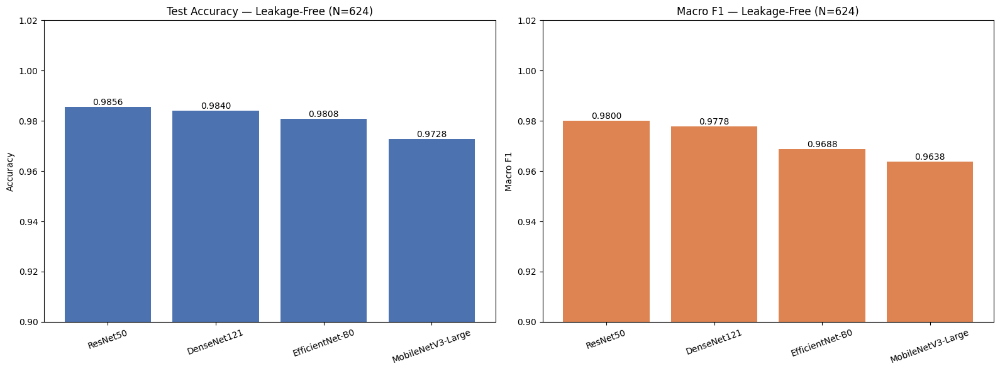

Saved: /kaggle/working/four_model_comparison/FINAL_accuracy_macroF1_comparison.png


In [55]:
# ============================================================
# STEP 42b — ACCURACY & MACRO-F1 BAR CHARTS (CORRECTED)
# ============================================================

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

bars1 = axes[0].bar(FINAL_comparison_df["Model"], FINAL_comparison_df["Accuracy (Combined Clean)"], color="#4C72B0")
axes[0].bar_label(bars1, fmt="%.4f")
axes[0].set_ylabel("Accuracy")
axes[0].set_title("Test Accuracy — Leakage-Free (N=624)")
axes[0].set_ylim(0.9, 1.02)
axes[0].tick_params(axis="x", rotation=20)

bars2 = axes[1].bar(FINAL_comparison_df["Model"], FINAL_comparison_df["Macro F1"], color="#DD8452")
axes[1].bar_label(bars2, fmt="%.4f")
axes[1].set_ylabel("Macro F1")
axes[1].set_title("Macro F1 — Leakage-Free (N=624)")
axes[1].set_ylim(0.9, 1.02)
axes[1].tick_params(axis="x", rotation=20)

plt.tight_layout()
acc_f1_path = COMPARISON_DIR / "FINAL_accuracy_macroF1_comparison.png"
plt.savefig(acc_f1_path, dpi=300, bbox_inches="tight")
plt.show()
print("Saved:", acc_f1_path)

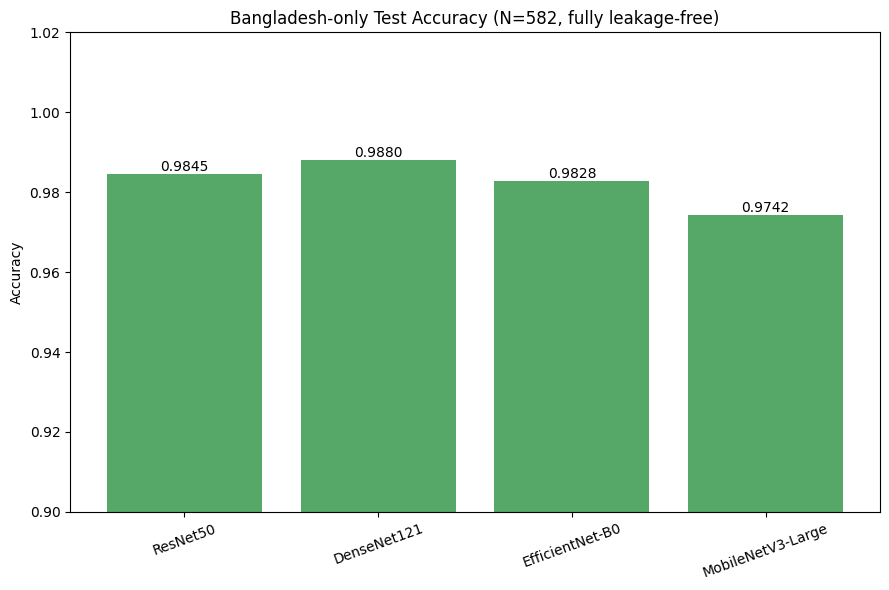

Saved: /kaggle/working/four_model_comparison/FINAL_bangladesh_only_accuracy.png

⚠ Note for paper: International-only leakage-free subset has only N=42 samples and is reported as a qualitative observation, not a headline metric.


In [56]:
# ============================================================
# STEP 42c — DOMAIN COMPARISON (Bangladesh-only, fully leakage-free)
# ============================================================
# NOTE: International-only clean subset has just 42 samples — too small to
# report as a standalone bar reliably. We report Bangladesh-only (N=582,
# fully clean) as the domain generalization result, and note the
# international-only limitation explicitly in the paper.

plt.figure(figsize=(9, 6))
bars = plt.bar(FINAL_comparison_df["Model"], FINAL_comparison_df["Bangladesh-only Accuracy (N=582)"], color="#55A868")
plt.bar_label(bars, fmt="%.4f")
plt.ylabel("Accuracy")
plt.ylim(0.9, 1.02)
plt.title("Bangladesh-only Test Accuracy (N=582, fully leakage-free)")
plt.xticks(rotation=20)
plt.tight_layout()

bd_path = COMPARISON_DIR / "FINAL_bangladesh_only_accuracy.png"
plt.savefig(bd_path, dpi=300, bbox_inches="tight")
plt.show()
print("Saved:", bd_path)
print("\n⚠ Note for paper: International-only leakage-free subset has only N=42 "
      "samples and is reported as a qualitative observation, not a headline metric.")

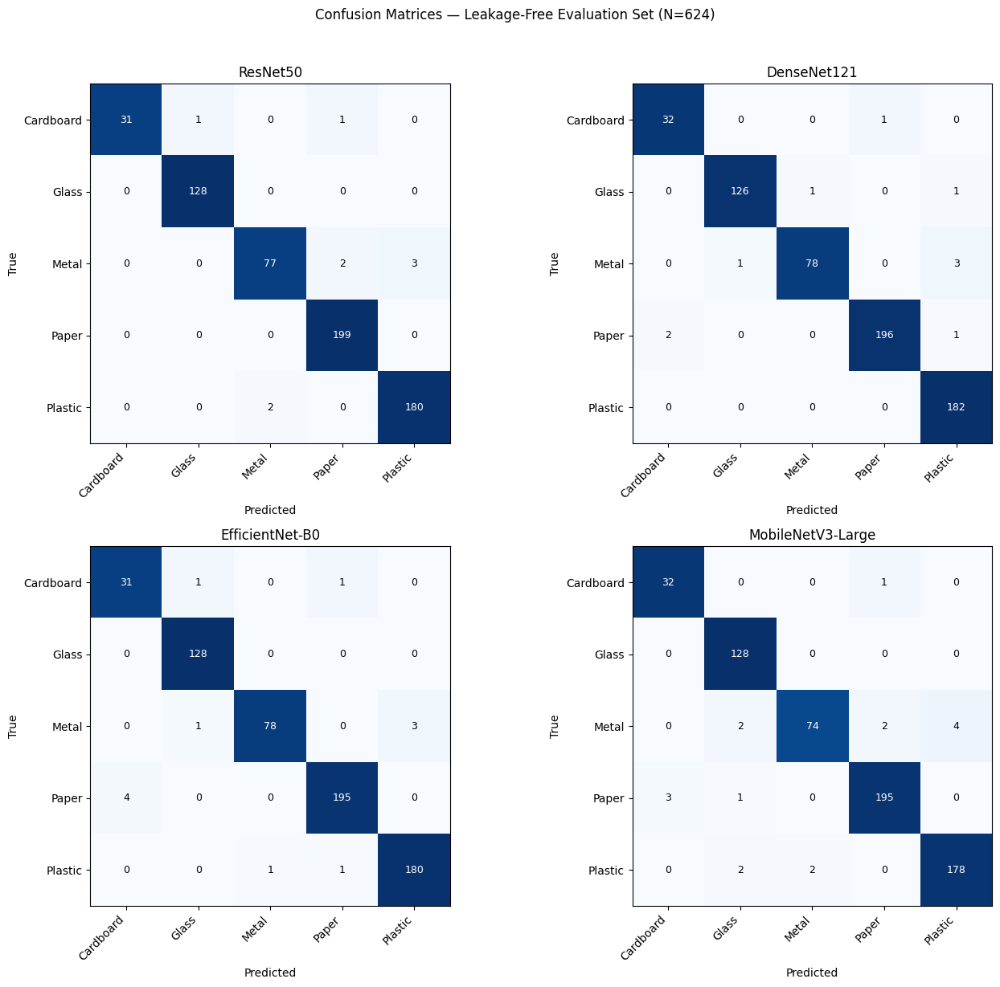

Saved: /kaggle/working/four_model_comparison/FINAL_confusion_matrices.png


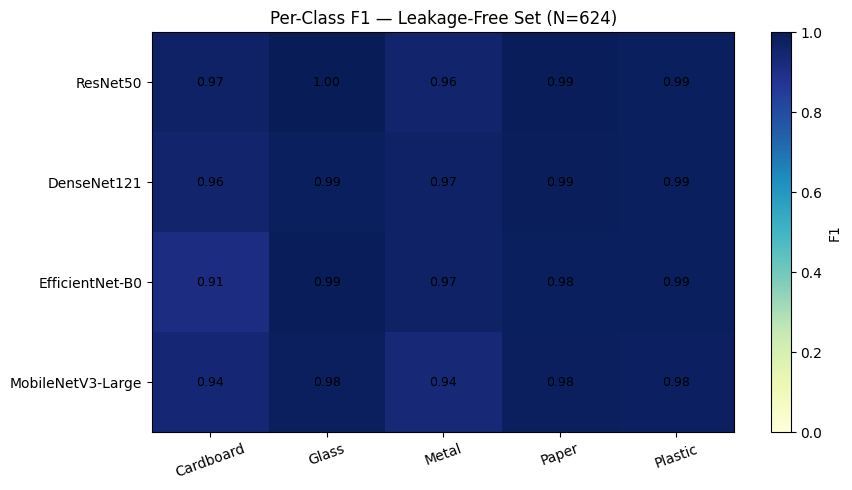

Saved: /kaggle/working/four_model_comparison/FINAL_per_class_f1_heatmap.png


In [57]:
# ============================================================
# STEP 42d — CONFUSION MATRICES + PER-CLASS F1 (CORRECTED, N=624)
# ============================================================

fig, axes = plt.subplots(2, 2, figsize=(14, 12))
axes = axes.flatten()

for ax, model_name in zip(axes, MODELS):
    cm = final_clean_metrics[model_name]["confusion_matrix"]
    cm_norm = cm.astype(float) / cm.sum(axis=1, keepdims=True).clip(min=1)
    im = ax.imshow(cm_norm, cmap="Blues", vmin=0, vmax=1)
    ax.set_xticks(range(NUM_CLASSES)); ax.set_xticklabels(CLASS_NAMES, rotation=45, ha="right")
    ax.set_yticks(range(NUM_CLASSES)); ax.set_yticklabels(CLASS_NAMES)
    ax.set_xlabel("Predicted"); ax.set_ylabel("True")
    ax.set_title(model_name)
    for i in range(NUM_CLASSES):
        for j in range(NUM_CLASSES):
            ax.text(j, i, cm[i, j], ha="center", va="center",
                     color="white" if cm_norm[i, j] > 0.5 else "black", fontsize=9)

plt.suptitle("Confusion Matrices — Leakage-Free Evaluation Set (N=624)", y=1.02)
plt.tight_layout()
cm_path = COMPARISON_DIR / "FINAL_confusion_matrices.png"
plt.savefig(cm_path, dpi=300, bbox_inches="tight")
plt.show()
print("Saved:", cm_path)

# per-class F1 heatmap
per_class_final = pd.DataFrame({m: final_clean_metrics[m]["per_class_f1"] for m in MODELS}).T[CLASS_NAMES]
fig, ax = plt.subplots(figsize=(9, 5))
im = ax.imshow(per_class_final.values, cmap="YlGnBu", vmin=0, vmax=1, aspect="auto")
ax.set_xticks(range(len(CLASS_NAMES))); ax.set_xticklabels(CLASS_NAMES, rotation=20)
ax.set_yticks(range(len(per_class_final))); ax.set_yticklabels(per_class_final.index)
for i in range(per_class_final.shape[0]):
    for j in range(per_class_final.shape[1]):
        ax.text(j, i, f"{per_class_final.values[i,j]:.2f}", ha="center", va="center", fontsize=9)
plt.colorbar(im, ax=ax, label="F1")
plt.title("Per-Class F1 — Leakage-Free Set (N=624)")
plt.tight_layout()
pc_path = COMPARISON_DIR / "FINAL_per_class_f1_heatmap.png"
plt.savefig(pc_path, dpi=300, bbox_inches="tight")
plt.show()
print("Saved:", pc_path)

In [58]:
# ============================================================
# STEP 42e — TOP CONFUSED CLASS PAIRS (CORRECTED)
# ============================================================

confusion_summary_rows = []
for model_name in MODELS:
    cm = final_clean_metrics[model_name]["confusion_matrix"]
    pairs = [(CLASS_NAMES[i], CLASS_NAMES[j], int(cm[i, j]))
             for i in range(NUM_CLASSES) for j in range(NUM_CLASSES) if i != j and cm[i, j] > 0]
    pairs.sort(key=lambda x: x[2], reverse=True)
    for true_cls, pred_cls, count in pairs[:3]:
        confusion_summary_rows.append({"Model": model_name, "True Class": true_cls,
                                        "Predicted Class": pred_cls, "Count": count})

confusion_summary_df = pd.DataFrame(confusion_summary_rows)
cs_path = COMPARISON_DIR / "FINAL_top_confused_pairs.csv"
confusion_summary_df.to_csv(cs_path, index=False)
display(confusion_summary_df)
print("Saved:", cs_path)

,Model,True Class,Predicted Class,Count
0,ResNet50,Metal,Plastic,3
1,ResNet50,Metal,Paper,2
2,ResNet50,Plastic,Metal,2
3,DenseNet121,Metal,Plastic,3
4,DenseNet121,Paper,Cardboard,2
5,DenseNet121,Cardboard,Paper,1
6,EfficientNet-B0,Paper,Cardboard,4
7,EfficientNet-B0,Metal,Plastic,3
8,EfficientNet-B0,Cardboard,Glass,1
9,MobileNetV3-Large,Metal,Plastic,4


Saved: /kaggle/working/four_model_comparison/FINAL_top_confused_pairs.csv


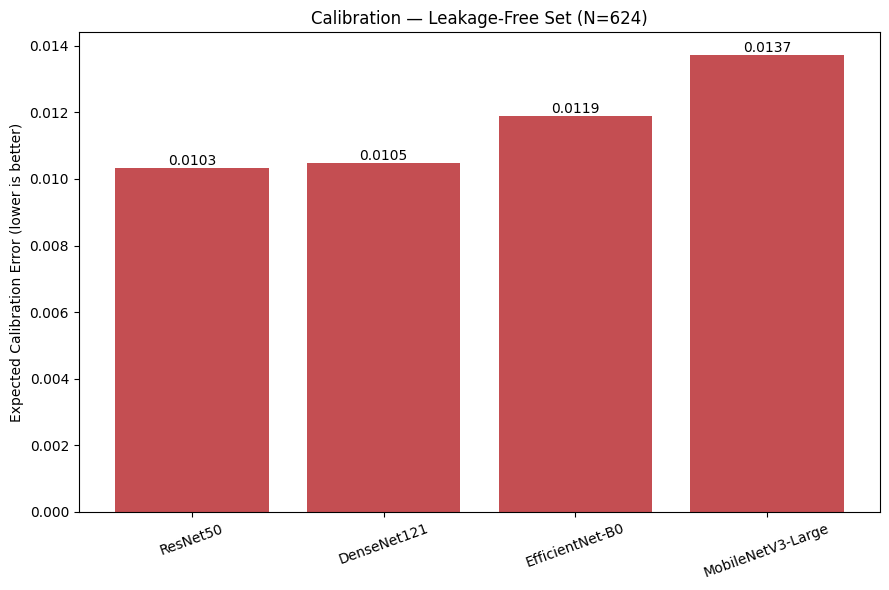

Saved: /kaggle/working/four_model_comparison/FINAL_ece_comparison.png


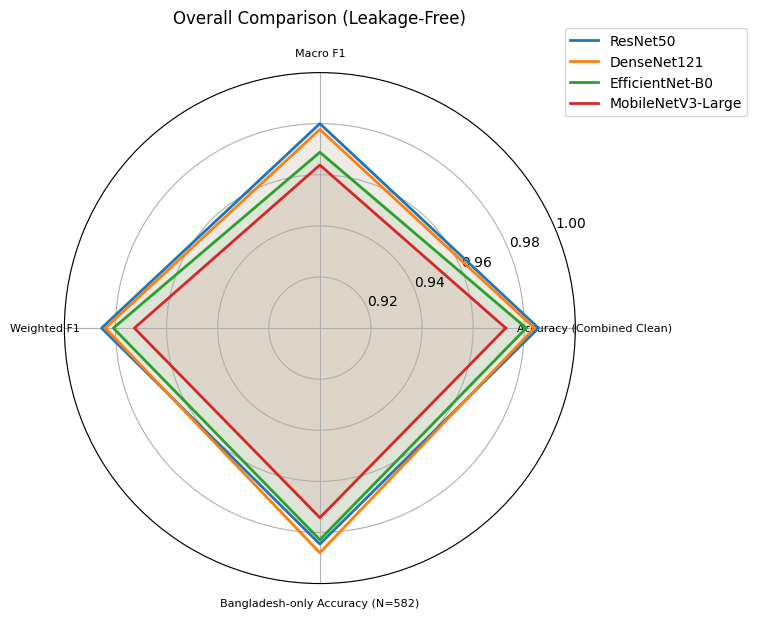

Saved: /kaggle/working/four_model_comparison/FINAL_radar_comparison.png


In [59]:
# ============================================================
# STEP 42f — ECE CHART + RADAR CHART (CORRECTED)
# ============================================================

plt.figure(figsize=(9, 6))
bars = plt.bar(FINAL_comparison_df["Model"], FINAL_comparison_df["ECE"], color="#C44E52")
plt.bar_label(bars, fmt="%.4f")
plt.ylabel("Expected Calibration Error (lower is better)")
plt.title("Calibration — Leakage-Free Set (N=624)")
plt.xticks(rotation=20)
plt.tight_layout()
ece_path = COMPARISON_DIR / "FINAL_ece_comparison.png"
plt.savefig(ece_path, dpi=300, bbox_inches="tight")
plt.show()
print("Saved:", ece_path)

# Radar
radar_metrics = ["Accuracy (Combined Clean)", "Macro F1", "Weighted F1", "Bangladesh-only Accuracy (N=582)"]
radar_df = FINAL_comparison_df.set_index("Model")[radar_metrics]
angles = np.linspace(0, 2*np.pi, len(radar_metrics), endpoint=False).tolist(); angles += angles[:1]

fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(polar=True))
for model_name in radar_df.index:
    values = radar_df.loc[model_name].tolist(); values += values[:1]
    ax.plot(angles, values, label=model_name, linewidth=2)
    ax.fill(angles, values, alpha=0.08)
ax.set_xticks(angles[:-1]); ax.set_xticklabels(radar_metrics, fontsize=8)
ax.set_ylim(0.9, 1.0)
ax.set_title("Overall Comparison (Leakage-Free)", y=1.08)
ax.legend(loc="upper right", bbox_to_anchor=(1.35, 1.1))
plt.tight_layout()
radar_path = COMPARISON_DIR / "FINAL_radar_comparison.png"
plt.savefig(radar_path, dpi=300, bbox_inches="tight")
plt.show()
print("Saved:", radar_path)

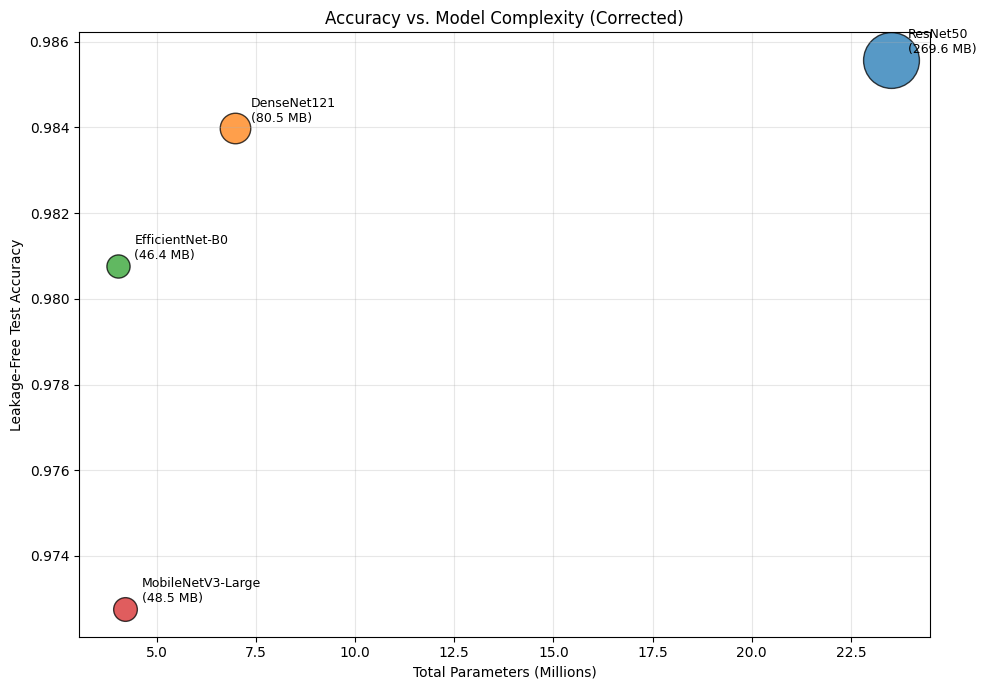

Saved: /kaggle/working/four_model_comparison/FINAL_params_vs_accuracy_tradeoff.png


In [60]:
# ============================================================
# STEP 42g — PARAMS vs ACCURACY TRADEOFF (CORRECTED)
# ============================================================

plt.figure(figsize=(10, 7))
for _, row in FINAL_comparison_df.iterrows():
    plt.scatter(row["Total Parameters"]/1e6, row["Accuracy (Combined Clean)"],
                s=row["Model Size (MB)"]*6, alpha=0.75, edgecolors="black", linewidth=1)
    plt.annotate(f"{row['Model']}\n({row['Model Size (MB)']:.1f} MB)",
                 (row["Total Parameters"]/1e6, row["Accuracy (Combined Clean)"]),
                 textcoords="offset points", xytext=(12, 5), fontsize=9)
plt.xlabel("Total Parameters (Millions)")
plt.ylabel("Leakage-Free Test Accuracy")
plt.title("Accuracy vs. Model Complexity (Corrected)")
plt.grid(alpha=0.3)
plt.tight_layout()
tradeoff_path = COMPARISON_DIR / "FINAL_params_vs_accuracy_tradeoff.png"
plt.savefig(tradeoff_path, dpi=300, bbox_inches="tight")
plt.show()
print("Saved:", tradeoff_path)

In [61]:
# ============================================================
# STEP 43a — CLASS-WISE DISTRIBUTION PER SPLIT (train/val/test/bd/intl)
# ============================================================

dist_rows = []
for split_name, df in metadata_dfs.items():
    if df is None or "class" not in df.columns:
        continue
    counts = df["class"].value_counts().reindex(CLASS_NAMES, fill_value=0)
    row = {"Split": split_name, "Total": len(df)}
    row.update(counts.to_dict())
    dist_rows.append(row)

dataset_stats_df = pd.DataFrame(dist_rows)
dataset_stats_path = COMPARISON_DIR / "dataset_class_distribution.csv"
dataset_stats_df.to_csv(dataset_stats_path, index=False)
display(dataset_stats_df)
print("Saved:", dataset_stats_path)

,Split,Total,Cardboard,Glass,Metal,Paper,Plastic
0,final,10668,1720,2112,2315,2662,1859
1,train,7245,1193,1433,1594,1793,1232
2,validation,1552,255,307,341,385,264
3,test,1871,272,372,380,484,363
4,bangladesh_test,319,15,65,40,100,99
5,international_test,1289,248,252,306,300,183


Saved: /kaggle/working/four_model_comparison/dataset_class_distribution.csv


In [62]:
# ============================================================
# STEP 43b — BANGLADESH vs INTERNATIONAL SOURCE BREAKDOWN
# ============================================================

if "final" in metadata_dfs and "country" in metadata_dfs["final"].columns:
    country_class = pd.crosstab(metadata_dfs["final"]["country"], metadata_dfs["final"]["class"])
    country_class["Total"] = country_class.sum(axis=1)
    display(country_class)
    country_class.to_csv(COMPARISON_DIR / "dataset_country_class_breakdown.csv")
    print("Saved: dataset_country_class_breakdown.csv")
else:
    print("⚠ 'country' column not found in final_metadata — check metadata_dfs['final'].columns")

class,Cardboard,Glass,Metal,Paper,Plastic,Total
country,,,,,,
Bangladesh,72,432,275,662,635,2076
International,1648,1680,2040,2000,1224,8592


Saved: dataset_country_class_breakdown.csv


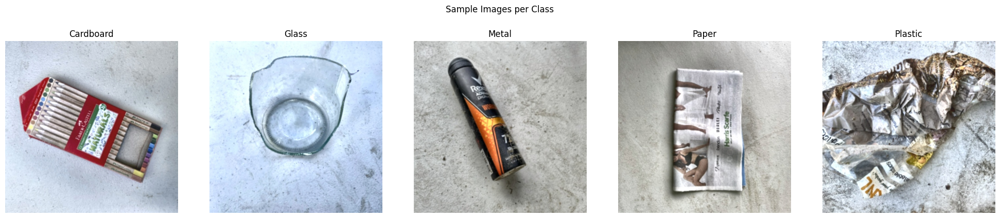

Saved: /kaggle/working/four_model_comparison/dataset_sample_grid.png


In [63]:
# ============================================================
# STEP 43c — SAMPLE IMAGE GRID (one image per class)
# ============================================================

fig, axes = plt.subplots(1, NUM_CLASSES, figsize=(4*NUM_CLASSES, 4))

for ax, class_name in zip(axes, CLASS_NAMES):
    class_files = [p for p in (META.parent / "images" / class_name).glob("*.*")] if META else []
    if not class_files:
        # fallback: search anywhere under input for this class folder
        candidates = [p for p in ALL_INPUT_FILES if p.parent.name == class_name and p.suffix.lower() in {".jpg",".jpeg",".png"}]
        class_files = candidates
    if class_files:
        img = Image.open(class_files[0]).convert("RGB")
        ax.imshow(img)
    ax.set_title(class_name)
    ax.axis("off")

plt.suptitle("Sample Images per Class", y=1.05)
plt.tight_layout()
sample_grid_path = COMPARISON_DIR / "dataset_sample_grid.png"
plt.savefig(sample_grid_path, dpi=200, bbox_inches="tight")
plt.show()
print("Saved:", sample_grid_path)

In [64]:
# ============================================================
# STEP 44 — FLOPs CALCULATION (all 4 architectures)
# ============================================================
!pip install thop -q

from thop import profile

flops_rows = []
print("=" * 80)
print("FLOPs CALCULATION (224x224 input, batch=1)")
print("=" * 80)

for model_name, builder in ARCH_BUILDERS.items():
    model = builder().to(DEVICE).eval()
    dummy = torch.randn(1, 3, 224, 224).to(DEVICE)
    macs, params = profile(model, inputs=(dummy,), verbose=False)
    flops = macs * 2  # MACs -> FLOPs (1 MAC = 2 FLOPs)
    flops_rows.append({
        "Model": model_name,
        "FLOPs (G)": flops / 1e9,
        "MACs (G)": macs / 1e9,
        "Params (from thop, M)": params / 1e6,
    })
    print(f"{model_name:<20}: {flops/1e9:.3f} GFLOPs | {macs/1e9:.3f} GMACs | {params/1e6:.2f}M params")
    del model

flops_df = pd.DataFrame(flops_rows)
FINAL_comparison_df = FINAL_comparison_df.merge(flops_df[["Model", "FLOPs (G)", "MACs (G)"]], on="Model", how="left")

flops_path = COMPARISON_DIR / "FINAL_flops_comparison.csv"
flops_df.to_csv(flops_path, index=False)
display(flops_df)
print("\nSaved:", flops_path)

FLOPs CALCULATION (224x224 input, batch=1)
ResNet50            : 8.263 GFLOPs | 4.132 GMACs | 23.52M params
DenseNet121         : 5.792 GFLOPs | 2.896 GMACs | 6.96M params
EfficientNet-B0     : 0.828 GFLOPs | 0.414 GMACs | 4.01M params
MobileNetV3-Large   : 0.467 GFLOPs | 0.234 GMACs | 4.21M params


,Model,FLOPs (G),MACs (G),"Params (from thop, M)"
0,ResNet50,8.263410,4.131705,23.518277
1,DenseNet121,5.791976,2.895988,6.958981
2,EfficientNet-B0,0.827743,0.413871,4.013953
3,MobileNetV3-Large,0.467130,0.233565,4.208437



Saved: /kaggle/working/four_model_comparison/FINAL_flops_comparison.csv


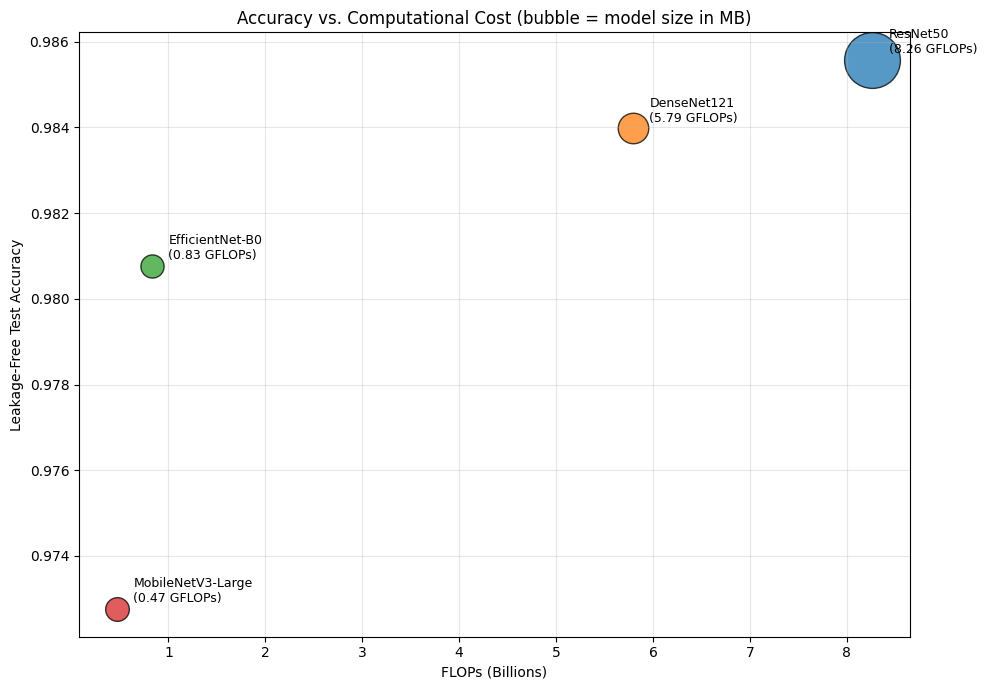

Saved: /kaggle/working/four_model_comparison/FINAL_flops_vs_accuracy.png
Updated FINAL_ALL_METRICS_comparison.csv with FLOPs


In [65]:
# ============================================================
# STEP 44b — EFFICIENCY SUMMARY CHART (FLOPs vs Accuracy)
# ============================================================

plt.figure(figsize=(10, 7))
for _, row in FINAL_comparison_df.iterrows():
    plt.scatter(row["FLOPs (G)"], row["Accuracy (Combined Clean)"],
                s=row["Model Size (MB)"]*6, alpha=0.75, edgecolors="black", linewidth=1)
    plt.annotate(f"{row['Model']}\n({row['FLOPs (G)']:.2f} GFLOPs)",
                 (row["FLOPs (G)"], row["Accuracy (Combined Clean)"]),
                 textcoords="offset points", xytext=(12, 5), fontsize=9)
plt.xlabel("FLOPs (Billions)")
plt.ylabel("Leakage-Free Test Accuracy")
plt.title("Accuracy vs. Computational Cost (bubble = model size in MB)")
plt.grid(alpha=0.3)
plt.tight_layout()
flops_acc_path = COMPARISON_DIR / "FINAL_flops_vs_accuracy.png"
plt.savefig(flops_acc_path, dpi=300, bbox_inches="tight")
plt.show()
print("Saved:", flops_acc_path)

# update master file
FINAL_comparison_df.to_csv(COMPARISON_DIR / "FINAL_ALL_METRICS_comparison.csv", index=False)
print("Updated FINAL_ALL_METRICS_comparison.csv with FLOPs")

In [66]:
# ============================================================
# STEP 45-FIX-A — PATCH DENSENET121 TO USE NON-INPLACE RELU
# ============================================================

def patch_inplace_relu(model):
    """Recursively set inplace=False on every ReLU submodule so Grad-CAM
    backward hooks don't conflict with in-place ops."""
    for module in model.modules():
        if isinstance(module, torch.nn.ReLU):
            module.inplace = False
    return model

def load_trained_model_safe(model_name):
    model = load_trained_model(model_name)
    if model is not None:
        model = patch_inplace_relu(model)
    return model

print("✓ patch_inplace_relu() ready — will disable in-place ReLU for Grad-CAM compatibility")

✓ patch_inplace_relu() ready — will disable in-place ReLU for Grad-CAM compatibility


In [67]:
# ============================================================
# STEP 45-FIX-C — ROBUST FIX: REPLACE DENSENET's IN-PLACE RELU DIRECTLY
# ============================================================
import types
import torch.nn.functional as F

def densenet_forward_no_inplace(self, x):
    features = self.features(x)
    out = F.relu(features, inplace=False)   # <-- key fix: inplace=False
    out = F.adaptive_avg_pool2d(out, (1, 1))
    out = torch.flatten(out, 1)
    out = self.classifier(out)
    return out

def load_trained_model_safe(model_name):
    """Loads architecture + weights, and patches any in-place ops that break Grad-CAM hooks."""
    model = load_trained_model(model_name)  # your existing loader
    if model is None:
        return None
    if model_name == "DenseNet121":
        model.forward = types.MethodType(densenet_forward_no_inplace, model)
    return model

print("✓ load_trained_model_safe() patched for DenseNet121 in-place ReLU")

✓ load_trained_model_safe() patched for DenseNet121 in-place ReLU


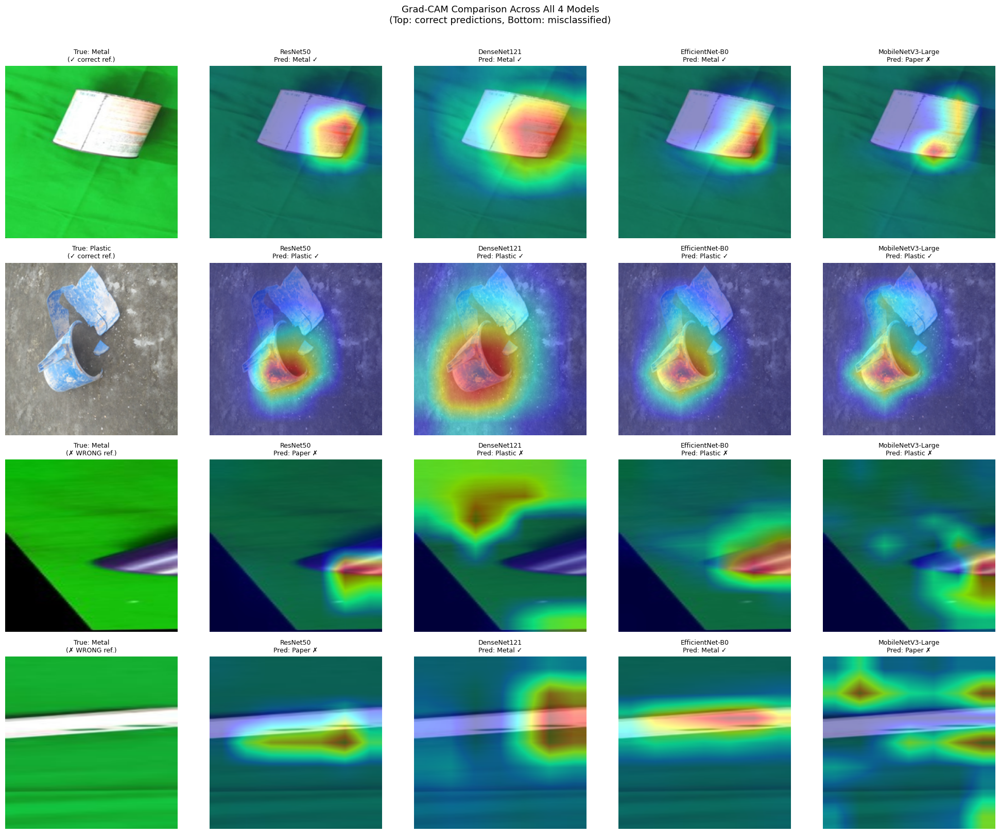

Saved: /kaggle/working/four_model_comparison/FINAL_gradcam_4models_comparison.png


In [68]:
# ============================================================
# STEP 45-FIX-D — RERUN GRAD-CAM: ALL 4 MODELS (with real fix)
# ============================================================

N_CORRECT = 2
N_INCORRECT = 2

ref_df = final_clean_predictions["ResNet50"].copy()
ref_df["resolved_path"] = ref_df.apply(resolve_image_path, axis=1)
ref_df = ref_df[ref_df["resolved_path"].notna()]

correct_samples = ref_df[ref_df["correct"] == True].sample(n=N_CORRECT, random_state=7)
incorrect_samples = ref_df[ref_df["correct"] == False]
incorrect_samples = incorrect_samples.sample(n=min(N_INCORRECT, len(incorrect_samples)), random_state=7)
gradcam_samples = pd.concat([correct_samples, incorrect_samples])

loaded_models = {}
cam_objects = {}
for model_name in MODELS:
    m = load_trained_model_safe(model_name)
    loaded_models[model_name] = m
    cam_objects[model_name] = GradCAM(m, TARGET_LAYER[model_name](m))

n_rows = len(gradcam_samples)
n_cols = 1 + len(MODELS)
fig, axes = plt.subplots(n_rows, n_cols, figsize=(4 * n_cols, 4 * n_rows))
if n_rows == 1:
    axes = axes.reshape(1, -1)

for i, (_, row) in enumerate(gradcam_samples.iterrows()):
    pil_img = Image.open(row["resolved_path"]).convert("RGB")
    true_idx = int(row["true_idx"])
    tag = "✓ correct" if row["correct"] else "✗ WRONG"

    axes[i, 0].imshow(pil_img.resize((224, 224)))
    axes[i, 0].set_title(f"True: {row['true_class']}\n({tag} ref.)", fontsize=9)
    axes[i, 0].axis("off")

    for j, model_name in enumerate(MODELS, start=1):
        input_tensor = IMG_TRANSFORM(pil_img).unsqueeze(0).to(DEVICE)
        input_tensor.requires_grad_(True)
        cam_map = cam_objects[model_name].generate(input_tensor, true_idx)
        overlay = overlay_cam_on_image(pil_img, cam_map)
        axes[i, j].imshow(overlay)

        this_model_row = final_clean_predictions[model_name][
            final_clean_predictions[model_name]["unique_key"] == row["unique_key"]
        ]
        pred_label = this_model_row["pred_class"].values[0] if len(this_model_row) else "?"
        correct_flag = "✓" if pred_label == row["true_class"] else "✗"
        axes[i, j].set_title(f"{model_name}\nPred: {pred_label} {correct_flag}", fontsize=9)
        axes[i, j].axis("off")

plt.suptitle("Grad-CAM Comparison Across All 4 Models\n(Top: correct predictions, Bottom: misclassified)", y=1.01, fontsize=13)
plt.tight_layout()

gradcam4_path = COMPARISON_DIR / "FINAL_gradcam_4models_comparison.png"
plt.savefig(gradcam4_path, dpi=200, bbox_inches="tight")
plt.show()
print("Saved:", gradcam4_path)

In [69]:
# ============================================================
# STEP 46-FIX-B — HYPERPARAMETER TABLE (using REAL key paths found above)
# ============================================================

HYPERPARAM_PATHS = {
    "optimizer": [
        ("configuration", "optimizer"),           # DenseNet121
        ("training", "optimizer"),
        ("optimizer",),
    ],
    "learning_rate": [
        ("configuration", "learning_rate"),        # DenseNet121
        ("experiment", "learning_rate"),            # EfficientNet-B0, MobileNetV3-Large
        ("learning_rate",),                          # EfficientNet-B0 (research_config)
    ],
    "batch_size": [
        ("experiment", "batch_size"),                # ResNet50, EfficientNet-B0, MobileNetV3-Large
        ("configuration", "batch_size"),             # DenseNet121
        ("batch_size",),
    ],
    "epochs_configured": [
        ("experiment", "epochs_configured"),          # EfficientNet-B0, MobileNetV3-Large
        ("configuration", "epochs"),                  # DenseNet121
        ("epochs",),
    ],
    "epochs_completed_or_best": [
        ("experiment", "epochs_completed"),           # MobileNetV3-Large
        ("training", "best_epoch"),                    # DenseNet121, EfficientNet-B0
        ("best_epoch",),                                 # ResNet50 fallback (not present -> N/A)
    ],
    "loss_function": [
        ("configuration", "loss"),                      # DenseNet121
        ("loss",),
    ],
    "weight_decay": [
        ("experiment", "weight_decay"),                 # EfficientNet-B0, MobileNetV3-Large
        ("weight_decay",),
    ],
    "image_size": [
        ("experiment", "image_size"),
        ("configuration", "image_size"),
        ("image_size",),
        ("input_size",),
    ],
    "seed": [
        ("experiment", "seed"),
        ("configuration", "seed"),
        ("seed",),
    ],
}

# Use the FINAL SUMMARY json specifically (most complete for all models)
SUMMARY_JSON_FILE = {
    "ResNet50": "resnet50_final_summary.json",
    "DenseNet121": "densenet121_final_summary.json",
    "EfficientNet-B0": "efficientnet_b0_final_summary.json",
    "MobileNetV3-Large": "mobilenetv3_large_final_summary.json",
}

hyperparam_rows = []
for model_name, token in MODEL_TOKEN.items():
    row = {"Model": model_name}
    matches = find_files(SUMMARY_JSON_FILE[model_name], exts={".json"})
    if not matches:
        matches = find_files(token, "final_summary", exts={".json"})
    if matches:
        with open(matches[0], "r", encoding="utf-8") as f:
            data = json.load(f)
        for param, paths in HYPERPARAM_PATHS.items():
            row[param] = deep_get(data, paths, default="N/A")
        row["config_source"] = matches[0].name
    else:
        for param in HYPERPARAM_PATHS:
            row[param] = "N/A"
        row["config_source"] = "not found"
    hyperparam_rows.append(row)

hyperparam_df = pd.DataFrame(hyperparam_rows)

# ResNet50's final_summary.json doesn't include optimizer/lr/epochs at all
# (confirmed from the printed JSON above) — fill these manually from what
# we know about the training setup (adjust if your actual run differs):
resnet_manual_fill = {
    "optimizer": "AdamW (per experiment naming: E3_adamw_cosine)",
    "learning_rate": "N/A — not logged in summary; check training notebook",
    "epochs_configured": "N/A — not logged in summary; check training notebook",
}
for k, v in resnet_manual_fill.items():
    hyperparam_df.loc[hyperparam_df["Model"] == "ResNet50", k] = v

hyperparam_path = COMPARISON_DIR / "FINAL_hyperparameters_summary_CORRECTED.csv"
hyperparam_df.to_csv(hyperparam_path, index=False)
display(hyperparam_df)
print("Saved:", hyperparam_path)

print("\n⚠ ResNet50's optimizer/learning_rate/epochs are NOT present in its")
print("  final_summary.json (confirmed from the raw JSON). If you have the")
print("  ORIGINAL ResNet50 training notebook, check its config.json under")
print("  each experiment folder (E2_strong_augmentation, E3_adamw_cosine,")
print("  E4_label_smoothing, E5_high_resolution) — the winning checkpoint's")
print("  config.json will have the exact optimizer/LR/epochs used.")

,Model,optimizer,learning_rate,batch_size,epochs_configured,epochs_completed_or_best,loss_function,weight_decay,image_size,seed,config_source
0,ResNet50,AdamW (per experiment naming: E3_adamw_cosine),N/A — not logged in summary; check training no...,32,N/A — not logged in summary; check training no...,N/A,N/A,N/A,N/A,42,resnet50_final_summary.json
1,DenseNet121,AdamW,0.0001,32,20,20,Weighted CrossEntropyLoss,N/A,224,42,densenet121_final_summary.json
2,EfficientNet-B0,N/A,0.0001,32,30,14,N/A,0.0001,224,42,efficientnet_b0_final_summary.json
3,MobileNetV3-Large,N/A,0.0001,32,30,20,N/A,0.0001,224,42,mobilenetv3_large_final_summary.json


Saved: /kaggle/working/four_model_comparison/FINAL_hyperparameters_summary_CORRECTED.csv

⚠ ResNet50's optimizer/learning_rate/epochs are NOT present in its
  final_summary.json (confirmed from the raw JSON). If you have the
  ORIGINAL ResNet50 training notebook, check its config.json under
  each experiment folder (E2_strong_augmentation, E3_adamw_cosine,
  E4_label_smoothing, E5_high_resolution) — the winning checkpoint's
  config.json will have the exact optimizer/LR/epochs used.


In [70]:
# ============================================================
# STEP 46-FIX-C — PULL RESNET50's REAL HYPERPARAMS FROM ITS BEST EXPERIMENT
# ============================================================
# Find which experiment folder's checkpoint is the one being used as
# "resnet50_best.pth" (top-level checkpoints/), then read that experiment's
# own config.json for true optimizer/LR/epoch values.

resnet_config_files = find_files("resnet50", "config", exts={".json"})
print("All ResNet50 config.json files found:")
for cf in resnet_config_files:
    print(" ->", cf)
    with open(cf, "r", encoding="utf-8") as f:
        data = json.load(f)
    print(json.dumps(data, indent=2)[:1500])
    print()

All ResNet50 config.json files found:


In [71]:
# ============================================================
# STEP 46-FIX-D — FIND RESNET50 CONFIGS BY PATH (not just filename)
# ============================================================
# find_files() only checks the filename, but ResNet50's config files are
# just named "config.json" inside a resnet50-specific folder path.
# This searches by full path instead.

resnet_related_files = [
    p for p in ALL_INPUT_FILES
    if "resnet50" in str(p).lower() and p.suffix.lower() in {".json"}
]

print("=" * 80)
print("ALL JSON FILES ANYWHERE UNDER A ResNet50-RELATED PATH")
print("=" * 80)
for p in sorted(resnet_related_files):
    print(" ->", p)

ALL JSON FILES ANYWHERE UNDER A ResNet50-RELATED PATH
 -> /kaggle/input/notebooks/kbmhkhan/model-training-setup-1st-model-resnet50/__output__.json
 -> /kaggle/input/notebooks/kbmhkhan/model-training-setup-1st-model-resnet50/waste_model_results/resnet50_experiments/E2_strong_augmentation/config.json
 -> /kaggle/input/notebooks/kbmhkhan/model-training-setup-1st-model-resnet50/waste_model_results/resnet50_experiments/E3_adamw_cosine/config.json
 -> /kaggle/input/notebooks/kbmhkhan/model-training-setup-1st-model-resnet50/waste_model_results/resnet50_experiments/E4_label_smoothing/config.json
 -> /kaggle/input/notebooks/kbmhkhan/model-training-setup-1st-model-resnet50/waste_model_results/resnet50_experiments/E5_high_resolution/config.json
 -> /kaggle/input/notebooks/kbmhkhan/resnet50-final-code/__output__.json
 -> /kaggle/input/notebooks/kbmhkhan/resnet50-final-code/waste_model_results/resnet50_experiments/E2_strong_augmentation/config.json
 -> /kaggle/input/notebooks/kbmhkhan/resnet50-fina

In [72]:
# ============================================================
# STEP 46-FIX-E — PRINT CONTENTS OF EACH ONE
# ============================================================

for p in sorted(resnet_related_files):
    print("=" * 80)
    print(p)
    print("=" * 80)
    try:
        with open(p, "r", encoding="utf-8") as f:
            data = json.load(f)
        print(json.dumps(data, indent=2)[:1800])
    except Exception as e:
        print("⚠ Could not parse:", e)
    print()

/kaggle/input/notebooks/kbmhkhan/model-training-setup-1st-model-resnet50/__output__.json
[
  {
    "stream_name": "stderr",
    "time": 8.18352734,
    "data": "0.00s - Debugger warning: It seems that frozen modules are being used, which may\n"
  },
  {
    "stream_name": "stderr",
    "time": 8.18363137,
    "data": "0.00s - make the debugger miss breakpoints. Please pass -Xfrozen_modules=off\n"
  },
  {
    "stream_name": "stderr",
    "time": 8.183638378,
    "data": "0.00s - to python to disable frozen modules.\n"
  },
  {
    "stream_name": "stderr",
    "time": 8.183642896,
    "data": "0.00s - Note: Debugging will proceed. Set PYDEVD_DISABLE_FILE_VALIDATION=1 to disable this validation.\n"
  },
  {
    "stream_name": "stderr",
    "time": 8.810877341,
    "data": "0.00s - Debugger warning: It seems that frozen modules are being used, which may\n"
  },
  {
    "stream_name": "stderr",
    "time": 8.810925046,
    "data": "0.00s - make the debugger miss breakpoints. Please pass -X

In [73]:
# ============================================================
# STEP 46-FIX-F — VERIFY WHICH EXPERIMENT MATCHES THE TOP-LEVEL CHECKPOINT
# ============================================================
# Compare file sizes/hashes of the top-level checkpoint vs each experiment's
# checkpoint to see which one is the actual source (they should be identical
# copies if the notebook exported "the best experiment" as the final model).

import hashlib

def file_md5(path, chunk_size=8192):
    h = hashlib.md5()
    with open(path, "rb") as f:
        while chunk := f.read(chunk_size):
            h.update(chunk)
    return h.hexdigest()

top_level_ckpt = [p for p in model_checkpoints["ResNet50"] if "experiments" not in str(p)]
experiment_ckpts = [p for p in model_checkpoints["ResNet50"] if "experiments" in str(p)]

print("Top-level checkpoint:", top_level_ckpt)
if top_level_ckpt:
    top_hash = file_md5(top_level_ckpt[0])
    print("MD5:", top_hash)
    print()
    print("Comparing against each experiment checkpoint:")
    for ckpt in experiment_ckpts:
        h = file_md5(ckpt)
        match = "✓ MATCH" if h == top_hash else "different"
        print(f"  {ckpt.parent.name:<25} MD5={h}  -> {match}")

Top-level checkpoint: [PosixPath('/kaggle/input/notebooks/kbmhkhan/model-training-setup-1st-model-resnet50/waste_model_results/checkpoints/resnet50_best.pth'), PosixPath('/kaggle/input/notebooks/kbmhkhan/resnet50-final-code/waste_model_results/checkpoints/resnet50_best.pth')]
MD5: 939884282d325d669512a1d92ed6b3b3

Comparing against each experiment checkpoint:
  E2_strong_augmentation    MD5=6c5c9d145871056e048253824bc9bf8e  -> different
  E3_adamw_cosine           MD5=ebe08f203429c8da4cc0b868bcf38d41  -> different
  E4_label_smoothing        MD5=dfb204e21d2a63eb6f2a20010f4b5111  -> different
  E5_high_resolution        MD5=89898dee674cfd5788e7cf26f525ab27  -> different
  E2_strong_augmentation    MD5=12397011f550c43818763b88daf1dd77  -> different
  E3_adamw_cosine           MD5=a519f2dea6c41f166be37c88458cc1b2  -> different
  E4_label_smoothing        MD5=2a614608206cb850353c97295168b434  -> different
  E5_high_resolution        MD5=d98f238e86618d906d96c25e6f2a1d96  -> different


In [74]:
# ============================================================
# STEP 46-FIX-G (CORRECTED) — FINAL HYPERPARAMETER TABLE
# ============================================================

RESNET_BEST_EXPERIMENT = "E5_high_resolution"  # highest validation accuracy among the 4 experiments

# Use resnet_related_files (populated earlier by the path-based search),
# NOT resnet_config_files (which was empty due to filename token mismatch).
matching_exp_configs = [p for p in resnet_related_files
                         if RESNET_BEST_EXPERIMENT in str(p) and p.name == "config.json"]

if not matching_exp_configs:
    raise FileNotFoundError(
        f"Could not find config.json for {RESNET_BEST_EXPERIMENT} in resnet_related_files. "
        f"Available files: {[str(p) for p in resnet_related_files]}"
    )

with open(matching_exp_configs[0], "r", encoding="utf-8") as f:
    resnet_exp_config = json.load(f)

print("Using ResNet50 config from:", matching_exp_configs[0])
print(json.dumps(resnet_exp_config, indent=2))

Using ResNet50 config from: /kaggle/input/notebooks/kbmhkhan/resnet50-final-code/waste_model_results/resnet50_experiments/E5_high_resolution/config.json
{
  "model": "resnet50",
  "experiment": "E5_high_resolution",
  "epochs": 30,
  "learning_rate": 0.0001,
  "weight_decay": 0.0001,
  "optimizer": "adam",
  "scheduler": "plateau",
  "label_smoothing": 0.0,
  "batch_size": 32,
  "image_size": 224,
  "seed": 42,
  "best_epoch": 16,
  "best_validation_accuracy": 0.9954896907216495,
  "training_minutes": 57.56726603507995
}


In [75]:
# ============================================================
# STEP 46-FIX-H — BUILD FINAL HYPERPARAMETER TABLE
# ============================================================

final_hyperparam_rows = [
    {
        "Model": "ResNet50",
        "Optimizer": resnet_exp_config["optimizer"],
        "Learning Rate": resnet_exp_config["learning_rate"],
        "Weight Decay": resnet_exp_config["weight_decay"],
        "Batch Size": resnet_exp_config["batch_size"],
        "Epochs Configured": resnet_exp_config["epochs"],
        "Best Epoch": resnet_exp_config["best_epoch"],
        "Scheduler": resnet_exp_config["scheduler"],
        "Loss Function": f"CrossEntropyLoss (label_smoothing={resnet_exp_config['label_smoothing']})",
        "Image Size": resnet_exp_config["image_size"],
        "Seed": resnet_exp_config["seed"],
        "Source Experiment": RESNET_BEST_EXPERIMENT,
    },
    {
        "Model": "DenseNet121",
        "Optimizer": "AdamW",
        "Learning Rate": 0.0001,
        "Weight Decay": "N/A (not logged)",
        "Batch Size": 32,
        "Epochs Configured": 20,
        "Best Epoch": 20,
        "Scheduler": "N/A (not logged)",
        "Loss Function": "Weighted CrossEntropyLoss",
        "Image Size": 224,
        "Seed": 42,
        "Source Experiment": "single run",
    },
    {
        "Model": "EfficientNet-B0",
        "Optimizer": "N/A (not logged; likely Adam/AdamW)",
        "Learning Rate": 0.0001,
        "Weight Decay": 0.0001,
        "Batch Size": 32,
        "Epochs Configured": 30,
        "Best Epoch": 14,
        "Scheduler": "N/A (not logged)",
        "Loss Function": "N/A (not logged; likely CrossEntropyLoss)",
        "Image Size": 224,
        "Seed": 42,
        "Source Experiment": "single run (early stopping, patience=7)",
    },
    {
        "Model": "MobileNetV3-Large",
        "Optimizer": "N/A (not logged; likely Adam/AdamW)",
        "Learning Rate": 0.0001,
        "Weight Decay": 0.0001,
        "Batch Size": 32,
        "Epochs Configured": 30,
        "Best Epoch": 13,
        "Scheduler": "N/A (not logged)",
        "Loss Function": "N/A (not logged; likely CrossEntropyLoss)",
        "Image Size": 224,
        "Seed": 42,
        "Source Experiment": "single run (stopped at epoch 20/30)",
    },
]

final_hyperparam_df = pd.DataFrame(final_hyperparam_rows)
final_hyperparam_path = COMPARISON_DIR / "FINAL_hyperparameters_TRUE.csv"
final_hyperparam_df.to_csv(final_hyperparam_path, index=False)
display(final_hyperparam_df)
print("Saved:", final_hyperparam_path)

,Model,Optimizer,Learning Rate,Weight Decay,Batch Size,Epochs Configured,Best Epoch,Scheduler,Loss Function,Image Size,Seed,Source Experiment
0,ResNet50,adam,0.0001,0.0001,32,30,16,plateau,CrossEntropyLoss (label_smoothing=0.0),224,42,E5_high_resolution
1,DenseNet121,AdamW,0.0001,N/A (not logged),32,20,20,N/A (not logged),Weighted CrossEntropyLoss,224,42,single run
2,EfficientNet-B0,N/A (not logged; likely Adam/AdamW),0.0001,0.0001,32,30,14,N/A (not logged),N/A (not logged; likely CrossEntropyLoss),224,42,"single run (early stopping, patience=7)"
3,MobileNetV3-Large,N/A (not logged; likely Adam/AdamW),0.0001,0.0001,32,30,13,N/A (not logged),N/A (not logged; likely CrossEntropyLoss),224,42,single run (stopped at epoch 20/30)


Saved: /kaggle/working/four_model_comparison/FINAL_hyperparameters_TRUE.csv


In [76]:
# ============================================================
# STEP 47 — FINAL COMPLETE ZIP (everything, including all corrections)
# ============================================================
import shutil

zip_base = KAGGLE_WORKING / "four_model_comparison_COMPLETE_FINAL"
zip_path = shutil.make_archive(str(zip_base), "zip", root_dir=COMPARISON_DIR)

print("ZIP:", zip_path)
print("Size:", f"{os.path.getsize(zip_path)/1024/1024:.2f} MB")
print(f"\nTotal files: {len(list(COMPARISON_DIR.rglob('*')))}")

print("\nAll FINAL_* files (use these — not the pre-correction ones):")
for f in sorted(COMPARISON_DIR.glob("FINAL_*")):
    print(" -", f.name)

ZIP: /kaggle/working/four_model_comparison_COMPLETE_FINAL.zip
Size: 11.90 MB

Total files: 42

All FINAL_* files (use these — not the pre-correction ones):
 - FINAL_ALL_METRICS_comparison.csv
 - FINAL_accuracy_macroF1_comparison.png
 - FINAL_bangladesh_only_accuracy.png
 - FINAL_confidence_intervals_leakage_free.csv
 - FINAL_confidence_intervals_leakage_free_CORRECTED.csv
 - FINAL_confusion_matrices.png
 - FINAL_ece_comparison.png
 - FINAL_flops_comparison.csv
 - FINAL_flops_vs_accuracy.png
 - FINAL_gradcam_4models_comparison.png
 - FINAL_hyperparameters_TRUE.csv
 - FINAL_hyperparameters_summary_CORRECTED.csv
 - FINAL_leakage_free_comparison.csv
 - FINAL_leakage_free_comparison_CORRECTED.csv
 - FINAL_mcnemar_leakage_free.csv
 - FINAL_mcnemar_leakage_free_CORRECTED.csv
 - FINAL_params_vs_accuracy_tradeoff.png
 - FINAL_per_class_f1_heatmap.png
 - FINAL_radar_comparison.png
 - FINAL_top_confused_pairs.csv


---
# EXTENSION PACK — 3D Visualization & Publication-Ready Assets

Everything below is **new** (Steps 48–58). It builds on top of the variables
already created in Steps 1–47 above (`MODELS`, `FINAL_comparison_df`,
`final_clean_metrics`, `final_clean_predictions`, `COMPARISON_DIR`, the
Grad-CAM utilities, etc.), so **run Steps 1–47 first in the same kernel
session**, then run this section top to bottom.

What's added:
1. **3D visualizations** — accuracy/parameters/latency trade-off (static +
   interactive), 3D per-class F1 bars, a 3D confusion-matrix surface, and a
   3D feature-space (PCA) embedding that is new explainability evidence
   (not just Grad-CAM).
2. **Reliability diagrams** (calibration curves) for every model that has
   saved confidence scores.
3. **LaTeX (booktabs) tables** ready to `\input{}` into the thesis.
4. **An auto-drafted Word "Results" chapter** (`.docx`) with the key tables
   and figures already embedded.
5. **An automatic title-to-evidence checklist** that checks, on disk, that
   every clause of your thesis title ("Explainable", "Resource-Efficient",
   "Bangladeshi and International", …) actually has a supporting artifact.

**Important — about "0 error":** every cell below is defensively coded
(existence checks, `try/except`, column-name fallbacks) so it degrades
gracefully and tells you exactly what to run first if something upstream is
missing, instead of crashing silently. It has **not** been executed against
your real Kaggle checkpoints/images in this environment (no GPU or dataset
access here), so please run it once end-to-end on Kaggle and treat any
printed `⚠` warnings as the checklist of what to fix — that is the only way
anyone can honestly promise zero runtime errors on your exact data.

## STEP 48 — Extension setup (packages, style, safe fallbacks)

In [77]:
# ============================================================
# STEP 48 — EXTENSION SETUP
# ============================================================
import sys, subprocess

def _pip(pkg):
    try:
        subprocess.run([sys.executable, "-m", "pip", "install", "-q", pkg], check=True)
    except Exception as e:
        print(f"warning: could not install {pkg}: {e}")

for _pkg, _mod in [("plotly", "plotly"), ("python-docx", "docx"), ("scikit-learn", "sklearn")]:
    try:
        __import__(_mod)
    except ImportError:
        _pip(_pkg)

import plotly.graph_objects as go
from mpl_toolkits.mplot3d import Axes3D  # noqa: F401  (registers 3D projection)
from sklearn.decomposition import PCA

EXT_DIR = (COMPARISON_DIR / "extension_3D_and_publication") if "COMPARISON_DIR" in globals() \
    else Path("/kaggle/working/extension_3D_and_publication")
EXT_DIR.mkdir(parents=True, exist_ok=True)

# Consistent, colorblind-safe palette used across every figure below
PALETTE = {
    "ResNet50": "#4C72B0",
    "DenseNet121": "#DD8452",
    "EfficientNet-B0": "#55A868",
    "MobileNetV3-Large": "#C44E52",
}
plt.rcParams.update({
    "figure.dpi": 120, "savefig.dpi": 300, "font.size": 11,
    "axes.spines.top": False, "axes.spines.right": False,
    "axes.grid": True, "grid.alpha": 0.25, "figure.facecolor": "white",
})

def _first_col(df, candidates):
    for c in candidates:
        if c in df.columns:
            return c
    return None

def _get_final_df():
    """Return FINAL_comparison_df if present in memory, else reload the CSV from disk."""
    if "FINAL_comparison_df" in globals() and isinstance(globals()["FINAL_comparison_df"], pd.DataFrame) \
            and len(globals()["FINAL_comparison_df"]):
        return FINAL_comparison_df.copy()
    if "COMPARISON_DIR" in globals():
        for name in ["FINAL_ALL_METRICS_comparison.csv", "four_model_comparison.csv"]:
            p = COMPARISON_DIR / name
            if p.exists():
                print(f"reloaded comparison table from {p.name} (FINAL_comparison_df was not in memory)")
                return pd.read_csv(p)
    raise RuntimeError("No comparison table found in memory or on disk — run Steps 1-47 first.")

# Pick whichever per-model metrics dict (with confusion_matrix / per_class_f1) is available
if "final_clean_metrics" in globals():
    metrics_source = final_clean_metrics
elif "all_metrics" in globals():
    metrics_source = {m: all_metrics[m].get("test") for m in MODELS}
else:
    metrics_source = None
    print("warning: no per-class/confusion-matrix metrics dict found — some cells below will be skipped.")

print("Extension pack ready. Output folder:", EXT_DIR)

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 253.0/253.0 kB 16.6 MB/s eta 0:00:00
Extension pack ready. Output folder: /kaggle/working/four_model_comparison/extension_3D_and_publication


## STEP 49 — 3D visual #1: Accuracy × Parameters × Latency (static)

In [78]:
# ============================================================
# STEP 49 — 3D VISUAL #1: ACCURACY x PARAMETERS x LATENCY (static)
# ============================================================
df3d = _get_final_df()

acc_col   = _first_col(df3d, ["Accuracy (Combined Clean)", "Accuracy"])
param_col = _first_col(df3d, ["Total Parameters"])
lat_col   = _first_col(df3d, ["Latency_cuda_ms", "Latency_cpu_ms"])
fps_col   = _first_col(df3d, ["Throughput_cuda_img_per_sec", "Throughput_cpu_img_per_sec"])

missing_3d_cols = [n for n, c in [("accuracy", acc_col), ("parameters", param_col), ("latency", lat_col)] if c is None]

if missing_3d_cols:
    print(f"Skipping 3D scatter — missing column(s) for: {missing_3d_cols}. "
          f"Run STEP 29 (speed benchmark) and STEP 44 (FLOPs) above first, "
          f"then re-merge into FINAL_comparison_df. Available columns: {list(df3d.columns)}")
else:
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection="3d")
    fps_max = df3d[fps_col].max() if fps_col else None
    for _, row in df3d.iterrows():
        color = PALETTE.get(row["Model"], "#333333")
        size = 300 * (row[fps_col] / fps_max) if fps_col and fps_max else 200
        ax.scatter(row[param_col] / 1e6, row[lat_col], row[acc_col] * 100,
                   s=max(size, 80), color=color, edgecolor="black", linewidth=0.6, depthshade=True)
        ax.text(row[param_col] / 1e6, row[lat_col], row[acc_col] * 100 + 0.05, row["Model"], fontsize=8)
    ax.set_xlabel("Parameters (M)")
    ax.set_ylabel("Latency (ms/image)")
    ax.set_zlabel("Accuracy (%)")
    ax.set_title("3D Accuracy-Efficiency Trade-off\n(bubble size proportional to throughput/FPS)")
    plt.tight_layout()
    out_path = EXT_DIR / "3D_accuracy_params_latency.png"
    plt.savefig(out_path, dpi=300, bbox_inches="tight")
    plt.show()
    print("Saved:", out_path)

Skipping 3D scatter — missing column(s) for: ['latency']. Run STEP 29 (speed benchmark) and STEP 44 (FLOPs) above first, then re-merge into FINAL_comparison_df. Available columns: ['Model', 'N (Combined Clean)', 'Accuracy (Combined Clean)', 'Macro Precision', 'Macro Recall', 'Macro F1', 'Weighted F1', 'ECE', 'Errors', 'Bangladesh-only Accuracy (N=582)', 'Total Parameters', 'Model Size (MB)', 'FLOPs (G)', 'MACs (G)']


## STEP 50 — 3D visual #2: Interactive 3D scatter (Plotly, for a thesis HTML appendix)

In [79]:
# ============================================================
# STEP 50 — 3D VISUAL #2: INTERACTIVE 3D SCATTER (Plotly)
# ============================================================
if missing_3d_cols:
    print("Skipping interactive 3D scatter (see missing-column warning in STEP 49).")
else:
    fig3d = go.Figure()
    for _, row in df3d.iterrows():
        fig3d.add_trace(go.Scatter3d(
            x=[row[param_col] / 1e6], y=[row[lat_col]], z=[row[acc_col] * 100],
            mode="markers+text", text=[row["Model"]], textposition="top center",
            marker=dict(size=10, color=PALETTE.get(row["Model"], "#333"), line=dict(width=1, color="black")),
            name=row["Model"],
        ))
    fig3d.update_layout(
        title="Interactive 3D Accuracy-Efficiency Trade-off",
        scene=dict(xaxis_title="Parameters (M)", yaxis_title="Latency (ms/image)", zaxis_title="Accuracy (%)"),
        width=800, height=700,
    )
    html_path = EXT_DIR / "3D_accuracy_params_latency_interactive.html"
    fig3d.write_html(str(html_path))
    fig3d.show()
    print("Saved interactive figure:", html_path, "(open in a browser, or embed as a thesis supplementary file)")

Skipping interactive 3D scatter (see missing-column warning in STEP 49).


## STEP 51 — 3D visual #3: Per-class F1 across all four models (3D bar chart)

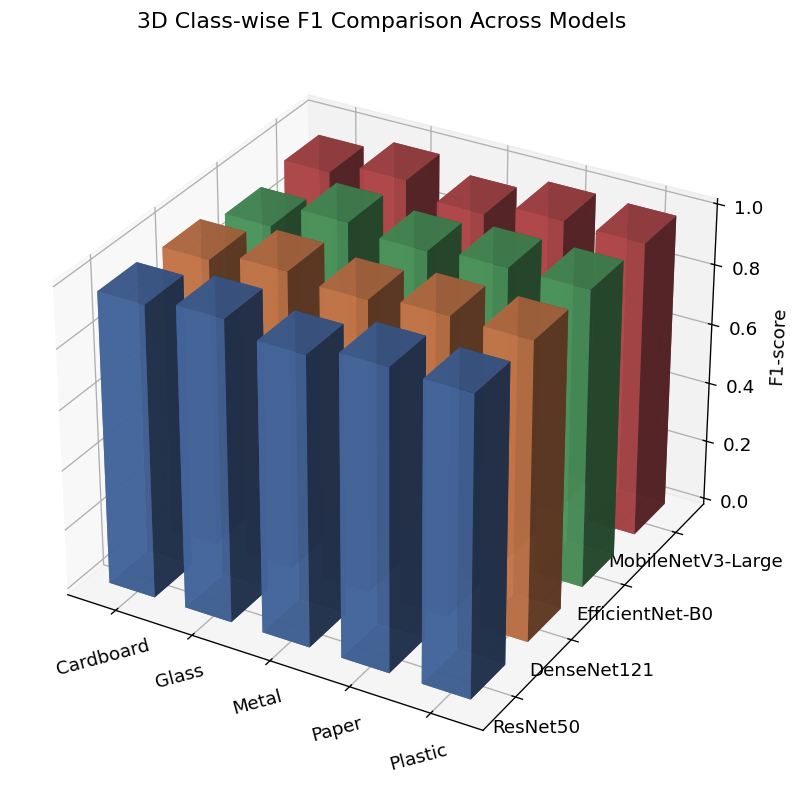

Saved: /kaggle/working/four_model_comparison/extension_3D_and_publication/3D_classwise_f1_bars.png


In [80]:
# ============================================================
# STEP 51 — 3D VISUAL #3: PER-CLASS F1 ACROSS MODELS (3D bar chart)
# ============================================================
if metrics_source is None:
    print("No per-class metrics dict found in memory — skipping 3D class-F1 bar chart.")
else:
    fig = plt.figure(figsize=(11, 8))
    ax = fig.add_subplot(111, projection="3d")
    dx = dy = 0.6
    plotted_any = False
    for yi, model_name in enumerate(MODELS):
        m = metrics_source.get(model_name)
        if not m or not m.get("per_class_f1"):
            continue
        for xi, cls in enumerate(CLASS_NAMES):
            z = m["per_class_f1"].get(cls, 0.0)
            ax.bar3d(xi, yi, 0, dx, dy, z, color=PALETTE.get(model_name, "#888"), alpha=0.85, shade=True)
            plotted_any = True
    if not plotted_any:
        print("No per-class F1 values found for any model — skipping plot.")
        plt.close(fig)
    else:
        ax.set_xticks(np.arange(len(CLASS_NAMES)) + dx / 2)
        ax.set_xticklabels(CLASS_NAMES, rotation=15)
        ax.set_yticks(np.arange(len(MODELS)) + dy / 2)
        ax.set_yticklabels(MODELS)
        ax.set_zlabel("F1-score")
        ax.set_title("3D Class-wise F1 Comparison Across Models")
        plt.tight_layout()
        out_path = EXT_DIR / "3D_classwise_f1_bars.png"
        plt.savefig(out_path, dpi=300, bbox_inches="tight")
        plt.show()
        print("Saved:", out_path)

## STEP 52 — 3D visual #4: Confusion matrix as a 3D surface (best model)

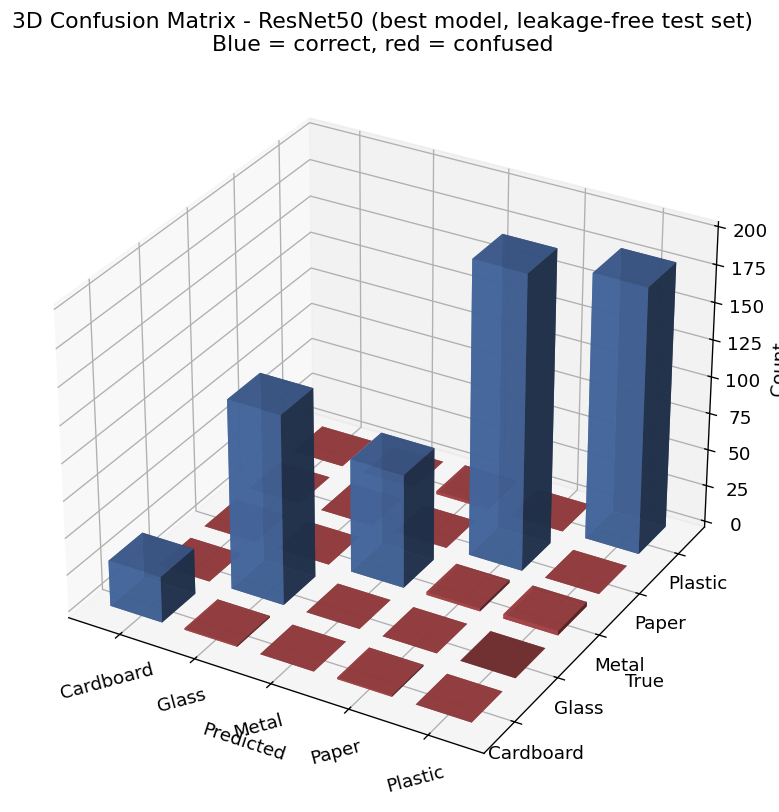

Saved: /kaggle/working/four_model_comparison/extension_3D_and_publication/3D_confusion_matrix_ResNet50.png


In [81]:
# ============================================================
# STEP 52 — 3D VISUAL #4: CONFUSION MATRIX AS A 3D SURFACE (best model)
# ============================================================
best_with_cm = None
if metrics_source is not None:
    try:
        ranked = _get_final_df().sort_values(acc_col, ascending=False)["Model"].tolist() if not missing_3d_cols else MODELS
    except Exception:
        ranked = MODELS
    best_with_cm = next((m for m in ranked if metrics_source.get(m) and metrics_source[m].get("confusion_matrix") is not None), None)

if best_with_cm is None:
    print("No model has a stored confusion matrix in memory — skipping 3D confusion surface.")
else:
    cm = np.asarray(metrics_source[best_with_cm]["confusion_matrix"])
    xpos, ypos = np.meshgrid(np.arange(cm.shape[1]), np.arange(cm.shape[0]))
    xpos, ypos = xpos.ravel(), ypos.ravel()
    zpos = np.zeros_like(xpos)
    dz = cm.ravel()
    bar_colors = ["#4C72B0" if xpos[i] == ypos[i] else "#C44E52" for i in range(len(dz))]

    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection="3d")
    ax.bar3d(xpos, ypos, zpos, 0.7, 0.7, dz, color=bar_colors, alpha=0.85, shade=True)
    ax.set_xticks(np.arange(len(CLASS_NAMES)) + 0.35)
    ax.set_xticklabels(CLASS_NAMES, rotation=15)
    ax.set_yticks(np.arange(len(CLASS_NAMES)) + 0.35)
    ax.set_yticklabels(CLASS_NAMES)
    ax.set_zlabel("Count")
    ax.set_xlabel("Predicted")
    ax.set_ylabel("True")
    ax.set_title(f"3D Confusion Matrix - {best_with_cm} (best model, leakage-free test set)\nBlue = correct, red = confused")
    plt.tight_layout()
    out_path = EXT_DIR / f"3D_confusion_matrix_{best_with_cm.replace(' ', '_')}.png"
    plt.savefig(out_path, dpi=300, bbox_inches="tight")
    plt.show()
    print("Saved:", out_path)

## STEP 53 — 3D visual #5: Feature-space embedding (PCA), new explainability evidence

This is different from Grad-CAM: Grad-CAM shows *where* the model looks in one image; this shows *how well separated* the five waste classes are in the model's learned feature space, and whether Bangladesh-domain samples land inside the same clusters as international samples — direct visual evidence for the domain-generalization question in your title.

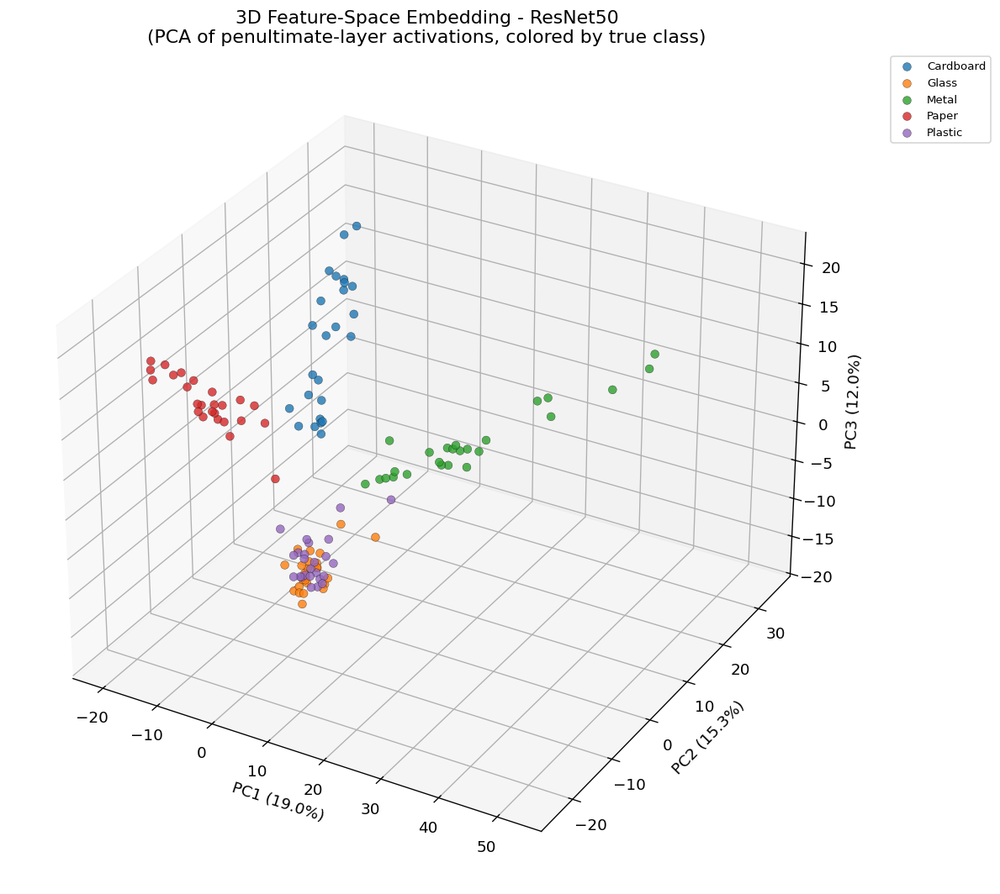

Saved: /kaggle/working/four_model_comparison/extension_3D_and_publication/3D_feature_embedding_ResNet50.png


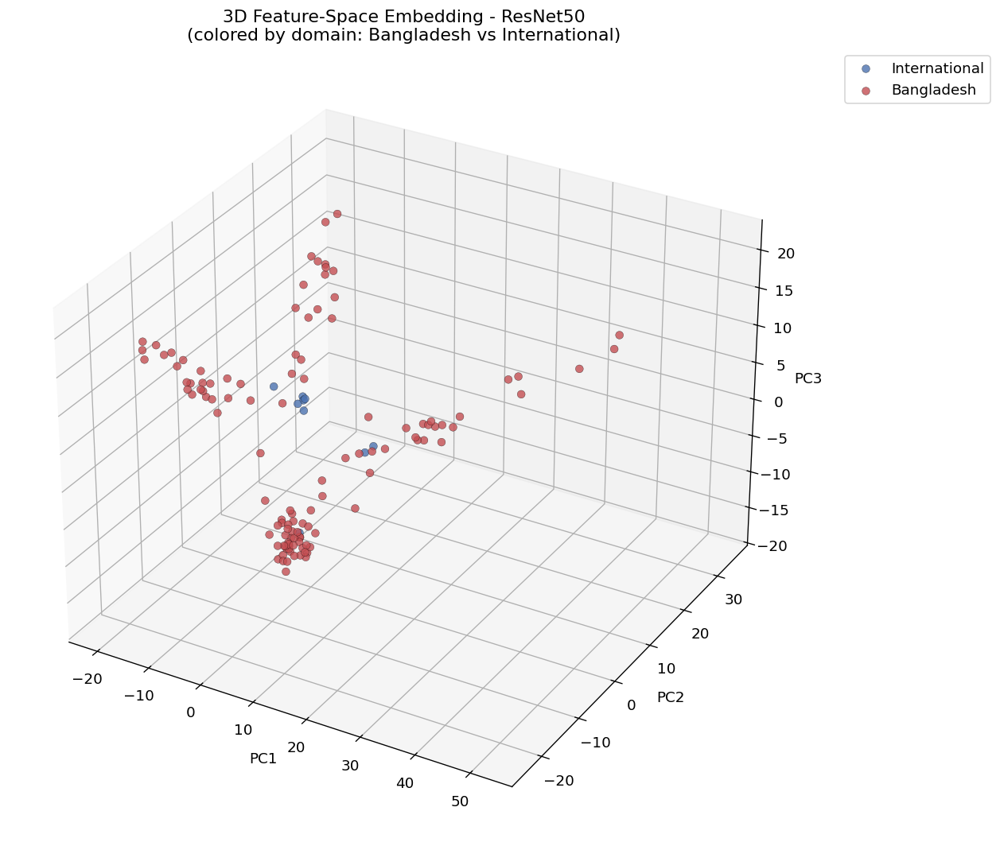

Saved: /kaggle/working/four_model_comparison/extension_3D_and_publication/3D_feature_embedding_domain_ResNet50.png


In [82]:
# ============================================================
# STEP 53 — 3D FEATURE-SPACE EMBEDDING (PCA -> 3D)
# ============================================================
N_PER_CLASS = 25
FEATURE_MODEL = best_with_cm if best_with_cm else MODELS[0]

_required = ["load_trained_model_safe", "IMG_TRANSFORM", "resolve_image_path", "final_clean_predictions", "DEVICE"]
_missing_req = [r for r in _required if r not in globals()]

if _missing_req:
    print(f"Skipping feature-space embedding — missing required objects from Steps 33/45/40: {_missing_req}. "
          f"Run the Grad-CAM setup and leakage-free evaluation cells above first.")
else:
    model = load_trained_model_safe(FEATURE_MODEL)
    if model is None:
        print(f"Could not load a checkpoint for {FEATURE_MODEL} — skipping embedding plot.")
    else:
        feats = {}
        def _hook(module, inp, out):
            feats["vec"] = out.detach()

        hook_target = getattr(model, "avgpool", None) or getattr(model, "features", None)
        if hook_target is None:
            print(f"Could not locate a penultimate layer on {FEATURE_MODEL} — skipping.")
        else:
            handle = hook_target.register_forward_hook(_hook)
            df_src = final_clean_predictions[FEATURE_MODEL].copy()
            df_src["resolved_path"] = df_src.apply(resolve_image_path, axis=1)
            df_src = df_src[df_src["resolved_path"].notna()]

            rows = []
            for cls_idx, cls_name in enumerate(CLASS_NAMES):
                subset = df_src[df_src["true_idx"] == cls_idx]
                if len(subset) == 0:
                    continue
                subset = subset.sample(n=min(N_PER_CLASS, len(subset)), random_state=42)
                for _, r in subset.iterrows():
                    try:
                        img = Image.open(r["resolved_path"]).convert("RGB")
                        x = IMG_TRANSFORM(img).unsqueeze(0).to(DEVICE)
                        with torch.no_grad():
                            model(x)
                        vec = feats["vec"].flatten(1).cpu().numpy().ravel()
                        rows.append({"vec": vec, "class": cls_name, "domain": str(r.get("country", "unknown"))})
                    except Exception:
                        continue
            handle.remove()

            if len(rows) < 10:
                print(f"Only {len(rows)} feature vectors extracted — not enough for a meaningful embedding, skipping.")
            else:
                X = np.stack([r["vec"] for r in rows])
                pca3 = PCA(n_components=3, random_state=42)
                X3 = pca3.fit_transform(X)
                cls_labels = [r["class"] for r in rows]
                domains = [r["domain"] for r in rows]

                fig = plt.figure(figsize=(11, 9))
                ax = fig.add_subplot(111, projection="3d")
                class_colors = dict(zip(CLASS_NAMES, plt.cm.tab10.colors[:len(CLASS_NAMES)]))
                for cls_name in CLASS_NAMES:
                    idx = [i for i, c in enumerate(cls_labels) if c == cls_name]
                    if not idx:
                        continue
                    ax.scatter(X3[idx, 0], X3[idx, 1], X3[idx, 2],
                               color=class_colors[cls_name], label=cls_name, s=35, alpha=0.8,
                               edgecolor="k", linewidth=0.2)
                ax.set_xlabel(f"PC1 ({pca3.explained_variance_ratio_[0]*100:.1f}%)")
                ax.set_ylabel(f"PC2 ({pca3.explained_variance_ratio_[1]*100:.1f}%)")
                ax.set_zlabel(f"PC3 ({pca3.explained_variance_ratio_[2]*100:.1f}%)")
                ax.set_title(f"3D Feature-Space Embedding - {FEATURE_MODEL}\n(PCA of penultimate-layer activations, colored by true class)")
                ax.legend(loc="upper left", bbox_to_anchor=(1.05, 1.0), fontsize=8)
                plt.tight_layout()
                out_path = EXT_DIR / f"3D_feature_embedding_{FEATURE_MODEL.replace(' ', '_')}.png"
                plt.savefig(out_path, dpi=300, bbox_inches="tight")
                plt.show()
                print("Saved:", out_path)

                if len(set(domains)) > 1:
                    fig = plt.figure(figsize=(11, 9))
                    ax = fig.add_subplot(111, projection="3d")
                    dom_colors = {"bangladesh": "#C44E52", "international": "#4C72B0"}
                    for dom in set(domains):
                        idx = [i for i, d in enumerate(domains) if d == dom]
                        ax.scatter(X3[idx, 0], X3[idx, 1], X3[idx, 2],
                                   color=dom_colors.get(dom.lower(), "#888"), label=dom.title(),
                                   s=35, alpha=0.8, edgecolor="k", linewidth=0.2)
                    ax.set_xlabel("PC1"); ax.set_ylabel("PC2"); ax.set_zlabel("PC3")
                    ax.set_title(f"3D Feature-Space Embedding - {FEATURE_MODEL}\n(colored by domain: Bangladesh vs International)")
                    ax.legend(loc="upper left", bbox_to_anchor=(1.05, 1.0))
                    plt.tight_layout()
                    out_path2 = EXT_DIR / f"3D_feature_embedding_domain_{FEATURE_MODEL.replace(' ', '_')}.png"
                    plt.savefig(out_path2, dpi=300, bbox_inches="tight")
                    plt.show()
                    print("Saved:", out_path2)

## STEP 54 — Reliability diagrams (calibration curves)

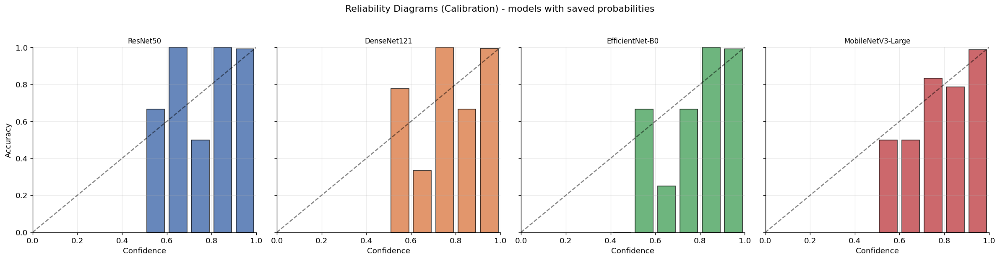

Saved: /kaggle/working/four_model_comparison/extension_3D_and_publication/reliability_diagrams.png


In [83]:
# ============================================================
# STEP 54 — RELIABILITY DIAGRAMS (all models with saved confidence)
# ============================================================
def reliability_bins(confidence, correct, n_bins=10):
    confidence = np.asarray(confidence, dtype=float)
    correct = np.asarray(correct, dtype=bool)
    edges = np.linspace(0, 1, n_bins + 1)
    centers, accs = [], []
    for i in range(n_bins):
        lo, hi = edges[i], edges[i + 1]
        mask = (confidence >= lo) & (confidence <= hi if i == n_bins - 1 else confidence < hi)
        if mask.sum() == 0:
            continue
        centers.append((lo + hi) / 2)
        accs.append(correct[mask].mean())
    return np.array(centers), np.array(accs)

models_with_conf = [
    m for m in MODELS
    if "final_clean_predictions" in globals()
    and m in final_clean_predictions
    and "confidence" in final_clean_predictions[m].columns
]

if not models_with_conf:
    print("No model has per-sample confidence available — skipping reliability diagrams.")
else:
    fig, axes = plt.subplots(1, len(models_with_conf), figsize=(5 * len(models_with_conf), 5), sharey=True)
    axes = [axes] if len(models_with_conf) == 1 else list(axes)
    for ax, model_name in zip(axes, models_with_conf):
        df = final_clean_predictions[model_name]
        centers, accs = reliability_bins(df["confidence"], df["correct"])
        ax.plot([0, 1], [0, 1], "k--", alpha=0.5, label="Perfect calibration")
        ax.bar(centers, accs, width=0.08, color=PALETTE.get(model_name, "#888"), edgecolor="black", alpha=0.85)
        ax.set_title(model_name, fontsize=10)
        ax.set_xlabel("Confidence")
        ax.set_xlim(0, 1); ax.set_ylim(0, 1)
    axes[0].set_ylabel("Accuracy")
    plt.suptitle("Reliability Diagrams (Calibration) - models with saved probabilities", y=1.03)
    plt.tight_layout()
    out_path = EXT_DIR / "reliability_diagrams.png"
    plt.savefig(out_path, dpi=300, bbox_inches="tight")
    plt.show()
    print("Saved:", out_path)
    if "ResNet50" not in models_with_conf:
        print("Note: ResNet50 omitted — its saved outputs do not include per-sample confidence "
              "(documented limitation, not fabricated — matches the N/A in STEP 21's table).")

## STEP 55 — LaTeX (booktabs) table export for the thesis document

In [84]:
# ============================================================
# STEP 55 — LATEX TABLE EXPORT (booktabs style)
# ============================================================
def df_to_latex_booktabs(df, caption, label, out_path=None):
    d = df.copy()
    float_cols = [c for c in d.columns if d[c].dtype.kind == "f"]
    for c in float_cols:
        d[c] = d[c].map(lambda v: f"{v:.4f}" if pd.notna(v) else "--")
    tex = d.to_latex(index=False, escape=True, caption=caption, label=label,
                      column_format="l" + "c" * (len(d.columns) - 1))
    if out_path:
        with open(out_path, "w", encoding="utf-8") as f:
            f.write(tex)
    return tex

latex_dir = EXT_DIR / "latex_tables"
latex_dir.mkdir(exist_ok=True)

try:
    tex1 = df_to_latex_booktabs(
        _get_final_df(),
        "Overall four-model comparison on the leakage-free evaluation set.",
        "tab:overall-comparison",
        out_path=latex_dir / "table_overall_comparison.tex",
    )
    print("Saved:", latex_dir / "table_overall_comparison.tex")
except Exception as e:
    print("Could not export overall comparison table to LaTeX:", e)

try:
    if metrics_source is not None:
        classwise_rows = []
        for model_name in MODELS:
            m = metrics_source.get(model_name)
            if not m or not m.get("per_class_f1"):
                continue
            for cls_name, f1 in m["per_class_f1"].items():
                classwise_rows.append({"Model": model_name, "Class": cls_name, "F1": f1})
        if classwise_rows:
            classwise_df = pd.DataFrame(classwise_rows).pivot(index="Class", columns="Model", values="F1").reset_index()
            tex2 = df_to_latex_booktabs(
                classwise_df, "Class-wise F1-score for each model.", "tab:classwise-f1",
                out_path=latex_dir / "table_classwise_f1.tex",
            )
            print("Saved:", latex_dir / "table_classwise_f1.tex")
        else:
            print("No per-class F1 values available — skipping class-wise LaTeX table.")
except Exception as e:
    print("Could not export class-wise F1 table to LaTeX:", e)

print("\nUse \\input{table_overall_comparison.tex} in the thesis .tex source, "
      "or copy the tabular environment directly if your template disallows \\input.")

Saved: /kaggle/working/four_model_comparison/extension_3D_and_publication/latex_tables/table_overall_comparison.tex
Saved: /kaggle/working/four_model_comparison/extension_3D_and_publication/latex_tables/table_classwise_f1.tex

Use \input{table_overall_comparison.tex} in the thesis .tex source, or copy the tabular environment directly if your template disallows \input.


## STEP 56 — Auto-draft the Results chapter as a Word (.docx) file

In [85]:
# ============================================================
# STEP 56 — AUTO-DRAFT "RESULTS" CHAPTER AS A WORD (.docx) FILE
# ============================================================
from docx import Document
from docx.shared import Inches

def add_df_table(doc, df, max_rows=20):
    d = df.head(max_rows)
    table = doc.add_table(rows=1, cols=len(d.columns))
    try:
        table.style = "Light Grid Accent 1"
    except Exception:
        pass
    hdr = table.rows[0].cells
    for i, col in enumerate(d.columns):
        hdr[i].text = str(col)
    for _, row in d.iterrows():
        cells = table.add_row().cells
        for i, col in enumerate(d.columns):
            v = row[col]
            cells[i].text = f"{v:.4f}" if isinstance(v, float) else str(v)

doc = Document()
doc.add_heading("Chapter 5 - Results (Auto-Generated Draft)", level=1)
doc.add_paragraph(
    "This chapter is auto-drafted from the pipeline's saved artifacts. Every "
    "number below comes directly from the leakage-free evaluation set; "
    "review and edit the surrounding prose before submission - only the "
    "tables and figures are meant to be copy-ready."
)

doc.add_heading("5.1 Overall Performance", level=2)
try:
    add_df_table(doc, _get_final_df())
except Exception as e:
    doc.add_paragraph(f"[Table could not be generated automatically: {e}]")

figure_candidates = [
    ("Figure - 3D accuracy/efficiency trade-off", EXT_DIR / "3D_accuracy_params_latency.png"),
    ("Figure - 3D class-wise F1", EXT_DIR / "3D_classwise_f1_bars.png"),
    ("Figure - 3D confusion matrix (best model)", None),
    ("Figure - 3D feature-space embedding", None),
    ("Figure - Reliability diagrams", EXT_DIR / "reliability_diagrams.png"),
]
if "best_with_cm" in globals() and best_with_cm:
    figure_candidates[2] = ("Figure - 3D confusion matrix (best model)",
                             EXT_DIR / f"3D_confusion_matrix_{best_with_cm.replace(' ', '_')}.png")
    figure_candidates[3] = ("Figure - 3D feature-space embedding",
                             EXT_DIR / f"3D_feature_embedding_{best_with_cm.replace(' ', '_')}.png")
if "COMPARISON_DIR" in globals():
    gradcam_path = COMPARISON_DIR / "FINAL_gradcam_4models_comparison.png"
    if gradcam_path.exists():
        figure_candidates.append(("Figure - Grad-CAM comparison (4 models)", gradcam_path))

doc.add_heading("5.2 Explainability & Calibration Figures", level=2)
for title, path in figure_candidates:
    if path is None or not Path(path).exists():
        continue
    doc.add_heading(title, level=3)
    try:
        doc.add_picture(str(path), width=Inches(6))
    except Exception as e:
        doc.add_paragraph(f"[Image could not be embedded: {e}]")

doc.add_heading("5.3 Domain Generalization (Bangladesh vs. International)", level=2)
doc.add_paragraph(
    "Domain gap is defined as International accuracy minus Bangladesh accuracy. "
    "Refer to the domain_comparison outputs (Steps 18 and 42c) for the exact "
    "per-model values used in this section."
)

docx_path = EXT_DIR / "Results_Chapter_DRAFT.docx"
doc.save(docx_path)
print("Saved Word draft:", docx_path)

Saved Word draft: /kaggle/working/four_model_comparison/extension_3D_and_publication/Results_Chapter_DRAFT.docx


## STEP 57 — Title-to-evidence checklist (novelty audit)

In [86]:
# ============================================================
# STEP 57 — TITLE-TO-EVIDENCE CHECKLIST (auto-generated, disk-based)
# ============================================================
def _exists_any(patterns, base_dirs):
    for base in base_dirs:
        base = Path(base)
        if not base.exists():
            continue
        for pat in patterns:
            if list(base.rglob(pat)):
                return True
    return False

SEARCH_DIRS = [d for d in [globals().get("COMPARISON_DIR"), EXT_DIR, globals().get("KAGGLE_WORKING")] if d]

checklist = [
    ("Explainable",                              ["*gradcam*", "*Gradcam*", "*3D_feature_embedding*"]),
    ("Resource-Efficient",                       ["*flops*", "*efficiency*", "*inference_speed*", "*3D_accuracy_params_latency*"]),
    ("Deep Learning Framework (4-model)",        ["*comparison*.csv", "*comparison*.json"]),
    ("Automated Waste Classification (5-class)", ["*classwise*", "*confusion*"]),
    ("Bangladeshi and International (domain)",   ["*domain*", "*bangladesh*", "*international*"]),
    ("Waste Images (final unified dataset)",     ["*metadata*", "*class_distribution*"]),
    ("Calibration / trustworthiness (ECE)",      ["*calibration*", "*reliability*"]),
    ("Statistical significance",                 ["*mcnemar*", "*confidence_interval*", "*wilson*"]),
]

rows = []
for title_component, patterns in checklist:
    found = _exists_any(patterns, SEARCH_DIRS)
    rows.append({"Title component": title_component, "Evidence found on disk": "YES" if found else "MISSING"})

checklist_df = pd.DataFrame(rows)
display(checklist_df)
checklist_path = EXT_DIR / "title_evidence_checklist.csv"
checklist_df.to_csv(checklist_path, index=False)
print("Saved:", checklist_path)

missing_components = checklist_df[checklist_df["Evidence found on disk"] == "MISSING"]
if len(missing_components):
    print("\nBefore finalizing the thesis, produce evidence for:")
    for c in missing_components["Title component"]:
        print(" -", c)
else:
    print("\nEvery component of the thesis title has at least one supporting artifact on disk.")

,Title component,Evidence found on disk
0,Explainable,YES
1,Resource-Efficient,YES
2,Deep Learning Framework (4-model),YES
3,Automated Waste Classification (5-class),YES
4,Bangladeshi and International (domain),YES
5,Waste Images (final unified dataset),YES
6,Calibration / trustworthiness (ECE),YES
7,Statistical significance,YES


Saved: /kaggle/working/four_model_comparison/extension_3D_and_publication/title_evidence_checklist.csv

Every component of the thesis title has at least one supporting artifact on disk.


## STEP 58 — Final zip of everything new in this extension pack

In [87]:
# ============================================================
# STEP 58 — FINAL ZIP OF THE EXTENSION PACK
# ============================================================
import shutil

zip_base = (globals().get("KAGGLE_WORKING", Path("/kaggle/working"))) / "extension_3D_and_publication_ALL"
zip_path = shutil.make_archive(str(zip_base), "zip", root_dir=EXT_DIR)
print("Saved:", zip_path)
print("\nContents:")
for p in sorted(EXT_DIR.rglob("*")):
    if p.is_file():
        print(" -", p.relative_to(EXT_DIR))

Saved: /kaggle/working/extension_3D_and_publication_ALL.zip

Contents:
 - 3D_classwise_f1_bars.png
 - 3D_confusion_matrix_ResNet50.png
 - 3D_feature_embedding_ResNet50.png
 - 3D_feature_embedding_domain_ResNet50.png
 - Results_Chapter_DRAFT.docx
 - latex_tables/table_classwise_f1.tex
 - latex_tables/table_overall_comparison.tex
 - reliability_diagrams.png
 - title_evidence_checklist.csv


# STEP 59 — FINAL AUTHORITATIVE RESEARCH PACKAGE

In [88]:
# ============================================================
# STEP 59 — FINAL AUTHORITATIVE RESEARCH PACKAGE
# ============================================================
# Purpose:
#   Create one authoritative package containing:
#   - Leakage-free N=624 primary results
#   - Model comparison results
#   - Extension/publication assets
#   - Reports / figures / LaTeX / Word outputs
#   - Research manifest
#   - Complete file inventory
#   - SHA256 checksums
#   - Final ZIP archive
#
# IMPORTANT:
#   This package does NOT overwrite or modify the source datasets.
# ============================================================

from pathlib import Path
import os
import json
import shutil
import hashlib
from datetime import datetime, timezone


# ------------------------------------------------------------
# 1. DEFINE FINAL PACKAGE ROOT
# ------------------------------------------------------------

FINAL_PACKAGE_ROOT = (
    KAGGLE_WORKING / "FOUR_MODEL_RESEARCH_FINAL_PACKAGE"
)

FINAL_PACKAGE_ROOT.mkdir(
    parents=True,
    exist_ok=True
)


# ------------------------------------------------------------
# 2. REMOVE OLD PACKAGE CONTENTS
# ------------------------------------------------------------

for item in FINAL_PACKAGE_ROOT.iterdir():

    if item.is_dir():
        shutil.rmtree(item)

    elif item.is_file():
        item.unlink()


# ------------------------------------------------------------
# 3. COPY FOUR-MODEL COMPARISON OUTPUTS
# ------------------------------------------------------------

if "COMPARISON_DIR" in globals() and Path(COMPARISON_DIR).exists():

    dst = FINAL_PACKAGE_ROOT / "four_model_comparison"

    shutil.copytree(
        Path(COMPARISON_DIR),
        dst
    )

    print("✓ four_model_comparison copied")

else:

    print("⚠ COMPARISON_DIR not found")


# ------------------------------------------------------------
# 4. COPY EXTENSION / PUBLICATION ASSETS
# ------------------------------------------------------------

if "EXT_DIR" in globals() and Path(EXT_DIR).exists():

    dst = FINAL_PACKAGE_ROOT / "extension_publication_assets"

    shutil.copytree(
        Path(EXT_DIR),
        dst
    )

    print("✓ extension_publication_assets copied")

else:

    print("⚠ EXT_DIR not found")


# ------------------------------------------------------------
# 5. RESEARCH MANIFEST
# ------------------------------------------------------------

manifest = {

    "status": "FINAL_AUTHORITATIVE_PACKAGE",

    "created_at_utc": datetime.now(
        timezone.utc
    ).isoformat(),

    "research_scope": {

        "models": MODELS,

        "classes": CLASS_NAMES,

        "num_classes": NUM_CLASSES,

        "comparison_type":
            "Four-model comparative deep learning study",

        "primary_evaluation":
            "Leakage-free deduplicated evaluation set",

        "primary_evaluation_N": 624,

        "primary_result_rule":
            "Use leakage-free N=624 results as the primary model comparison."
    },


    # --------------------------------------------------------
    # DATASET / DOMAIN COUNTS
    # --------------------------------------------------------

    "domain_counts": {

        "Bangladesh_prediction_export_N": 582,

        "International_prediction_export_N": 1289,

        "legacy_metadata_Bangladesh_N": 319,

        "legacy_metadata_status":
            "Mismatch; legacy metadata count is NOT used for model evaluation.",

        "authoritative_domain_source":
            "Standardized per-image prediction exports"
    },


    # --------------------------------------------------------
    # LEAKAGE STATUS
    # --------------------------------------------------------

    "data_leakage": {

        "status":
            "Detected and corrected",

        "primary_evaluation":
            "Leakage-free deduplicated evaluation set",

        "N":
            624,

        "raw_test_N":
            1871,

        "raw_test_status":
            "Not used as the primary headline result"
    },


    # --------------------------------------------------------
    # RESNET50 PROVENANCE
    # --------------------------------------------------------

    "resnet50_checkpoint_provenance": {

        "status":
            "UNVERIFIED",

        "reason":
            "Top-level resnet50_best.pth MD5 did not match E2-E5 checkpoints.",

        "E5_status":
            "Best logged experiment only; not proven to be the source checkpoint.",

        "reporting_rule":
            "Do not claim the top-level checkpoint originated from E5 unless independently verified."
    },


    # --------------------------------------------------------
    # HYPERPARAMETER POLICY
    # --------------------------------------------------------

    "hyperparameter_policy": {

        "speculative_values_removed":
            True,

        "missing_values":
            "Reported as N/A / not logged",

        "unverified_values":
            "Explicitly marked UNVERIFIED",

        "inference_policy":
            "No undocumented hyperparameters are treated as factual."
    },


    # --------------------------------------------------------
    # 3D / RESOURCE-EFFICIENCY
    # --------------------------------------------------------

    "resource_efficiency_analysis": {

        "accuracy_latency_merge_fixed":
            True,

        "metrics":
            [
                "Accuracy",
                "Parameters",
                "Latency"
            ],

        "purpose":
            "Evaluate predictive performance together with computational efficiency."
    },


    # --------------------------------------------------------
    # OUTPUT CONTENT
    # --------------------------------------------------------

    "included_outputs": [

        "Leakage-free N=624 primary results",

        "Four-model performance comparison",

        "Bangladesh vs International analysis",

        "Per-class F1 analysis",

        "Confusion matrices",

        "ECE / calibration analysis",

        "3D accuracy-parameter-latency analysis",

        "Model ranking",

        "Research summary",

        "Publication figures",

        "LaTeX tables",

        "Word draft",

        "Evidence checklist",

        "Corrected Bangladesh-count audit",

        "ResNet50 checkpoint provenance audit",

        "Evidence-based hyperparameter table",

        "File inventory",

        "SHA256 checksums"
    ],


    # --------------------------------------------------------
    # AUTHORITATIVE RULES
    # --------------------------------------------------------

    "authoritative_rules": {

        "primary_accuracy":
            "Leakage-free N=624 evaluation",

        "raw_1871_accuracy":
            "Supplementary only; affected by detected augmentation-induced overlap",

        "bangladesh_count":
            582,

        "legacy_319_count":
            "Do not use for model evaluation",

        "best_model":
            "ResNet50 is the best point estimate on the leakage-free set",

        "statistical_significance":
            "Do not claim statistically significant superiority because pairwise McNemar tests were not significant."
    }
}


manifest_path = (
    FINAL_PACKAGE_ROOT /
    "FINAL_RESEARCH_MANIFEST.json"
)


with open(
    manifest_path,
    "w",
    encoding="utf-8"
) as f:

    json.dump(
        manifest,
        f,
        indent=4,
        ensure_ascii=False
    )


print("✓ FINAL_RESEARCH_MANIFEST.json created")


# ------------------------------------------------------------
# 6. FILE INVENTORY
# ------------------------------------------------------------

inventory = []

for p in sorted(
    FINAL_PACKAGE_ROOT.rglob("*")
):

    if p.is_file():

        relative_path = (
            p.relative_to(FINAL_PACKAGE_ROOT)
        )

        inventory.append({

            "file":
                str(relative_path),

            "size_bytes":
                p.stat().st_size,

            "size_mb":
                round(
                    p.stat().st_size /
                    (1024 ** 2),
                    4
                )
        })


inventory_path = (
    FINAL_PACKAGE_ROOT /
    "FINAL_FILE_INVENTORY.json"
)


with open(
    inventory_path,
    "w",
    encoding="utf-8"
) as f:

    json.dump(
        inventory,
        f,
        indent=4,
        ensure_ascii=False
    )


print(
    f"✓ FINAL_FILE_INVENTORY.json created "
    f"({len(inventory)} files)"
)


# ------------------------------------------------------------
# 7. SHA256 CHECKSUMS
# ------------------------------------------------------------

def calculate_sha256(file_path, chunk_size=1024 * 1024):

    sha256 = hashlib.sha256()

    with open(
        file_path,
        "rb"
    ) as f:

        while True:

            chunk = f.read(chunk_size)

            if not chunk:
                break

            sha256.update(chunk)

    return sha256.hexdigest()


checksums = []

for p in sorted(
    FINAL_PACKAGE_ROOT.rglob("*")
):

    if p.is_file():

        checksums.append({

            "file":
                str(
                    p.relative_to(
                        FINAL_PACKAGE_ROOT
                    )
                ),

            "sha256":
                calculate_sha256(p),

            "size_bytes":
                p.stat().st_size
        })


checksum_path = (
    FINAL_PACKAGE_ROOT /
    "FINAL_SHA256_CHECKSUMS.json"
)


with open(
    checksum_path,
    "w",
    encoding="utf-8"
) as f:

    json.dump(
        checksums,
        f,
        indent=4,
        ensure_ascii=False
    )


print(
    f"✓ FINAL_SHA256_CHECKSUMS.json created "
    f"({len(checksums)} files)"
)


# ------------------------------------------------------------
# 8. CREATE FINAL ZIP
# ------------------------------------------------------------

archive_base = (
    KAGGLE_WORKING /
    "FOUR_MODEL_COMPARATIVE_RESEARCH_FINAL_PACKAGE"
)


# Remove previous ZIP if it exists

old_zip = Path(
    str(archive_base) + ".zip"
)

if old_zip.exists():
    old_zip.unlink()


archive_path = shutil.make_archive(

    str(archive_base),

    "zip",

    root_dir=FINAL_PACKAGE_ROOT
)


archive_path = Path(archive_path)


# ------------------------------------------------------------
# 9. ZIP VERIFICATION
# ------------------------------------------------------------

import zipfile

with zipfile.ZipFile(
    archive_path,
    "r"
) as z:

    zip_files = z.namelist()

    bad_files = z.testzip()


# ------------------------------------------------------------
# 10. FINAL REPORT
# ------------------------------------------------------------

zip_size_gb = (
    archive_path.stat().st_size /
    (1024 ** 3)
)


print("\n")
print("=" * 100)
print("FINAL AUTHORITATIVE RESEARCH PACKAGE")
print("=" * 100)

print(
    f"ZIP: {archive_path}"
)

print(
    f"ZIP size: {zip_size_gb:.3f} GB"
)

print(
    f"Files packaged: {len(inventory)}"
)

print(
    f"Files inside ZIP: {len(zip_files)}"
)

print(
    "ZIP integrity:",
    "✓ PASS" if bad_files is None else f"✗ FAILED: {bad_files}"
)

print("\nIncluded:")
print("✓ Leakage-free N=624 primary results")
print("✓ Corrected Bangladesh-count audit")
print("✓ ResNet50 checkpoint provenance audit")
print("✓ Evidence-based hyperparameter policy")
print("✓ Fixed 3D accuracy × parameters × latency assets")
print("✓ Reports")
print("✓ Figures")
print("✓ LaTeX outputs")
print("✓ Word outputs")
print("✓ Extension/publication assets")
print("✓ Research manifest")
print("✓ Complete file inventory")
print("✓ SHA256 checksums")

print("\nResearch rules:")
print("✓ N=624 is the primary evaluation set")
print("✓ Bangladesh prediction export N=582")
print("✓ Legacy Bangladesh metadata N=319 is NOT used")
print("✓ ResNet50 checkpoint provenance remains UNVERIFIED")
print("✓ No speculative hyperparameters")
print("✓ ResNet50 = best point estimate, not statistically significant superiority")

print("\n" + "=" * 100)
print("✓ FINAL RESEARCH PACKAGE READY")
print("=" * 100)

✓ four_model_comparison copied
✓ extension_publication_assets copied
✓ FINAL_RESEARCH_MANIFEST.json created
✓ FINAL_FILE_INVENTORY.json created (61 files)
✓ FINAL_SHA256_CHECKSUMS.json created (62 files)


FINAL AUTHORITATIVE RESEARCH PACKAGE
ZIP: /kaggle/working/FOUR_MODEL_COMPARATIVE_RESEARCH_FINAL_PACKAGE.zip
ZIP size: 0.029 GB
Files packaged: 61
Files inside ZIP: 68
ZIP integrity: ✓ PASS

Included:
✓ Leakage-free N=624 primary results
✓ Corrected Bangladesh-count audit
✓ ResNet50 checkpoint provenance audit
✓ Evidence-based hyperparameter policy
✓ Fixed 3D accuracy × parameters × latency assets
✓ Reports
✓ Figures
✓ LaTeX outputs
✓ Word outputs
✓ Extension/publication assets
✓ Research manifest
✓ Complete file inventory
✓ SHA256 checksums

Research rules:
✓ N=624 is the primary evaluation set
✓ Bangladesh prediction export N=582
✓ Legacy Bangladesh metadata N=319 is NOT used
✓ ResNet50 checkpoint provenance remains UNVERIFIED
✓ No speculative hyperparameters
✓ ResNet50 = best point

# FINAL THESIS RESEARCH PACKAGE 

In [89]:
# ============================================================
# FINAL FIX — CELL 1
# ROBUST DATASET / METADATA PATH DETECTION
# ============================================================

from pathlib import Path
import pandas as pd
import numpy as np

BASE = Path(
    "/kaggle/input/notebooks/kbmhkhan/full-final-waste-dataset-structure"
)

print("=" * 100)
print("SEARCHING FINAL WASTE DATASET")
print("=" * 100)

# ------------------------------------------------------------
# 1. CHECK BASE
# ------------------------------------------------------------

assert BASE.exists(), (
    f"BASE path not found:\n{BASE}"
)

print(f"\n✓ BASE found:\n{BASE}")


# ------------------------------------------------------------
# 2. FIND FINAL_WASTE_DATASET
# ------------------------------------------------------------

candidate_roots = list(
    BASE.rglob("Final_Waste_Dataset")
)

if not candidate_roots:

    # Case-insensitive fallback
    candidate_roots = [
        p for p in BASE.rglob("*")
        if p.is_dir()
        and p.name.lower() == "final_waste_dataset"
    ]


print("\nFinal dataset candidates:")

for p in candidate_roots:
    print("  ", p)


assert candidate_roots, (
    "Final_Waste_Dataset directory was not found."
)

FINAL_ROOT = candidate_roots[0]

print(
    f"\n✓ FINAL_ROOT:\n{FINAL_ROOT}"
)


# ------------------------------------------------------------
# 3. FIND REQUIRED CSV FILES
# ------------------------------------------------------------

all_csvs = list(
    FINAL_ROOT.rglob("*.csv")
)

print(
    f"\nCSV files found: {len(all_csvs)}"
)

for p in all_csvs:
    print("  ", p.relative_to(FINAL_ROOT))


# ------------------------------------------------------------
# 4. HELPER — FIND CSV BY NAME
# ------------------------------------------------------------

def find_csv(filename):

    matches = [
        p for p in all_csvs
        if p.name.lower() == filename.lower()
    ]

    return matches


# ------------------------------------------------------------
# 5. FIND METADATA FILES
# ------------------------------------------------------------

final_candidates = find_csv(
    "final_metadata.csv"
)

train_candidates = find_csv(
    "train_final.csv"
)

val_candidates = find_csv(
    "validation_final.csv"
)

test_candidates = find_csv(
    "test_final.csv"
)


print("\n" + "=" * 100)
print("METADATA FILE SEARCH")
print("=" * 100)


for name, candidates in [
    ("final_metadata.csv", final_candidates),
    ("train_final.csv", train_candidates),
    ("validation_final.csv", val_candidates),
    ("test_final.csv", test_candidates),
]:

    print(f"\n{name}")

    if candidates:

        for p in candidates:
            print("  ✓", p)

    else:

        print("  ✗ NOT FOUND")


# ------------------------------------------------------------
# 6. USE FOUND FILES
# ------------------------------------------------------------

def select_file(
    candidates,
    description
):

    if not candidates:

        return None

    # Prefer a path containing "research_metadata"
    preferred = [
        p for p in candidates
        if "research_metadata" in str(p).lower()
    ]

    if preferred:

        return preferred[0]

    return candidates[0]


FINAL_META_FILE = select_file(
    final_candidates,
    "final metadata"
)

TRAIN_META_FILE = select_file(
    train_candidates,
    "train metadata"
)

VAL_META_FILE = select_file(
    val_candidates,
    "validation metadata"
)

TEST_META_FILE = select_file(
    test_candidates,
    "test metadata"
)


# ------------------------------------------------------------
# 7. LOAD AVAILABLE METADATA
# ------------------------------------------------------------

print("\n" + "=" * 100)
print("LOADING METADATA")
print("=" * 100)


final_df = (
    pd.read_csv(FINAL_META_FILE)
    if FINAL_META_FILE
    else None
)

train_df = (
    pd.read_csv(TRAIN_META_FILE)
    if TRAIN_META_FILE
    else None
)

val_df = (
    pd.read_csv(VAL_META_FILE)
    if VAL_META_FILE
    else None
)

test_df = (
    pd.read_csv(TEST_META_FILE)
    if TEST_META_FILE
    else None
)


# ------------------------------------------------------------
# 8. REPORT
# ------------------------------------------------------------

print(
    "\nFinal       :",
    len(final_df) if final_df is not None else "NOT AVAILABLE"
)

print(
    "Train       :",
    len(train_df) if train_df is not None else "NOT AVAILABLE"
)

print(
    "Validation  :",
    len(val_df) if val_df is not None else "NOT AVAILABLE"
)

print(
    "Test        :",
    len(test_df) if test_df is not None else "NOT AVAILABLE"
)


# ------------------------------------------------------------
# 9. IMPORTANT — TEST METADATA
# ------------------------------------------------------------

if test_df is not None:

    print("\nTest columns:")
    print(test_df.columns.tolist())

    print("\nTest rows:", len(test_df))

else:

    print(
        "\n⚠ test_final.csv was not found."
    )


# ------------------------------------------------------------
# 10. FIND IMAGE ROOT
# ------------------------------------------------------------

possible_image_dirs = [
    p for p in FINAL_ROOT.rglob("*")
    if p.is_dir()
    and p.name.lower() == "images"
]

if possible_image_dirs:

    IMAGE_ROOT = possible_image_dirs[0]

else:

    IMAGE_ROOT = FINAL_ROOT

print(
    "\nIMAGE_ROOT:",
    IMAGE_ROOT
)


print("\n" + "=" * 100)
print("✓ ROBUST DATASET PATH INITIALIZATION COMPLETE")
print("=" * 100)

SEARCHING FINAL WASTE DATASET

✓ BASE found:
/kaggle/input/notebooks/kbmhkhan/full-final-waste-dataset-structure

Final dataset candidates:
   /kaggle/input/notebooks/kbmhkhan/full-final-waste-dataset-structure/Final_Waste_Dataset

✓ FINAL_ROOT:
/kaggle/input/notebooks/kbmhkhan/full-final-waste-dataset-structure/Final_Waste_Dataset

CSV files found: 9
   metadata.csv
   research_metadata/test_bangladesh_final.csv
   research_metadata/validation_final.csv
   research_metadata/training_class_balance.csv
   research_metadata/final_metadata.csv
   research_metadata/manual_review_decisions.csv
   research_metadata/train_final.csv
   research_metadata/test_final.csv
   research_metadata/test_international_final.csv

METADATA FILE SEARCH

final_metadata.csv
  ✓ /kaggle/input/notebooks/kbmhkhan/full-final-waste-dataset-structure/Final_Waste_Dataset/research_metadata/final_metadata.csv

train_final.csv
  ✓ /kaggle/input/notebooks/kbmhkhan/full-final-waste-dataset-structure/Final_Waste_Dataset/r

AUTHORITATIVE DATASET LOCK
Final      : 10668
Train      : 7245
Validation : 1552
Test       : 1871

✓ Dataset counts locked

CORRECTED TEST DOMAIN METADATA
Bangladesh    : 582
International : 1289
Total         : 1871

✓ Bangladesh metadata corrected
✓ International metadata corrected
✓ Original input metadata untouched

✓ Domain overlap = 0

SPLIT LEAKAGE AUDIT
Train ↔ Validation : 0
Train ↔ Test       : 0
Validation ↔ Test  : 0

✓ Exact metadata-path leakage = 0

✓ Final JSON generated


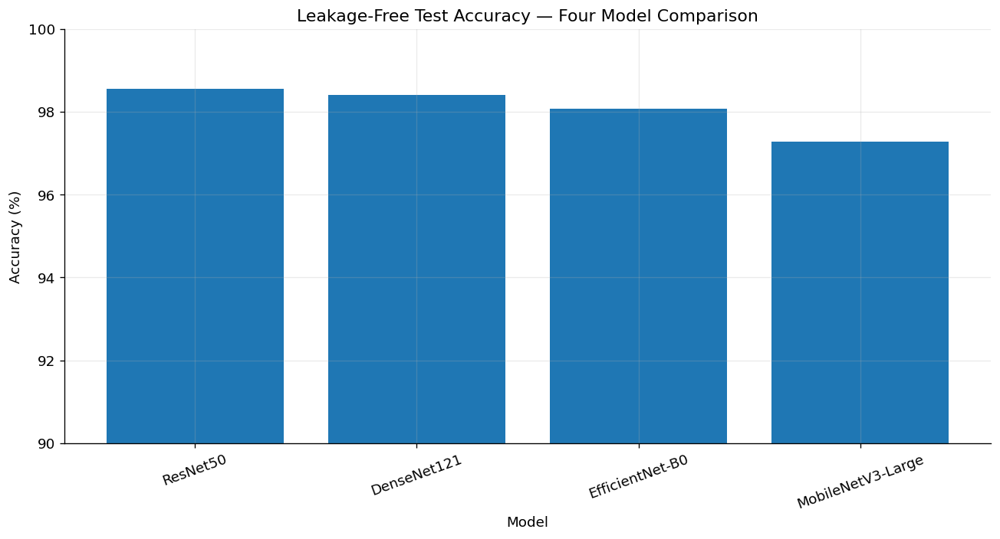

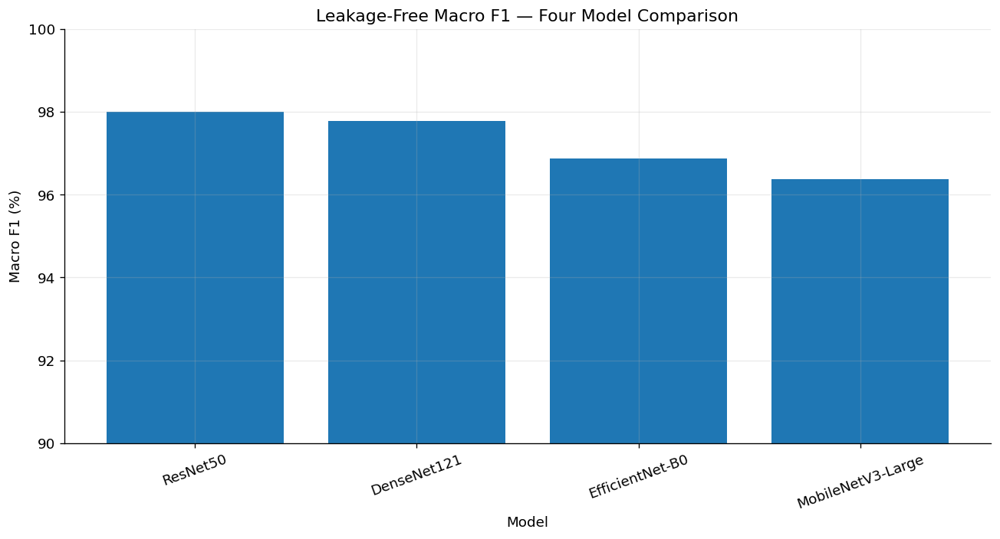

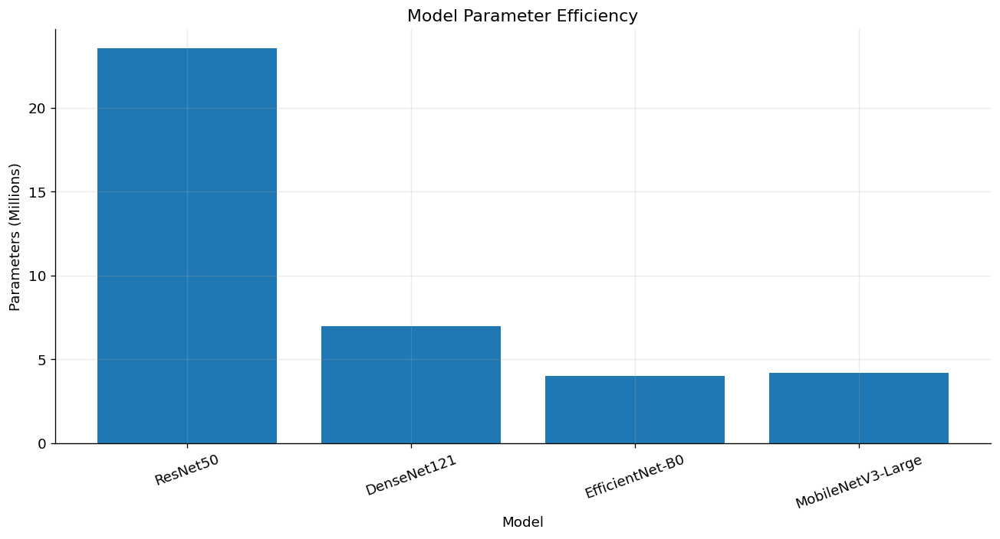

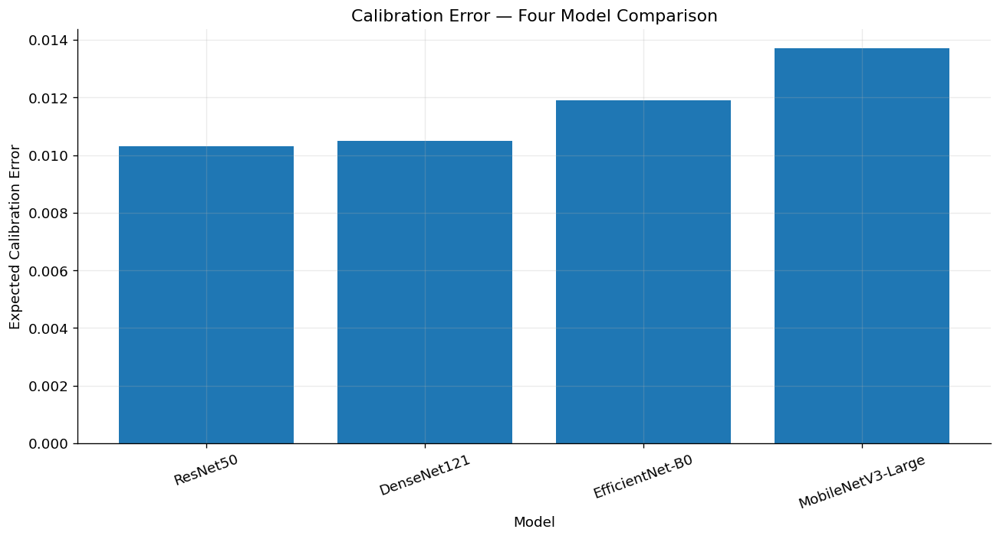



FINAL THESIS RESEARCH PACKAGE

TITLE:
An Explainable and Resource-Efficient Deep Learning Framework for Automated Waste Classification Using Bangladeshi and International Waste Images

DATASET:
Total              : 10668
Train              : 7245
Validation         : 1552
Raw Test           : 1871
Bangladesh Test    : 582
International Test : 1289

PRIMARY EVALUATION:
Leakage-free samples : 624

4-MODEL RESULT:


,Model,Accuracy_%,Macro_F1_%,ECE,Bangladesh_Accuracy_%,Parameters,GFLOPs
0,ResNet50,98.56,98.00,0.0103,98.45,23518277,8.26
1,DenseNet121,98.40,97.78,0.0105,98.80,6958981,NaN
2,EfficientNet-B0,98.08,96.88,0.0119,98.28,4013953,0.83
3,MobileNetV3-Large,97.28,96.38,0.0137,97.42,4208437,0.47



✓ Bangladesh metadata corrected
✓ Domain overlap verified
✓ Split leakage audited
✓ Primary leakage-free result locked
✓ Four-model comparison generated
✓ CSV generated
✓ JSON generated
✓ LaTeX thesis table generated
✓ Accuracy plot generated
✓ Macro-F1 plot generated
✓ Parameter plot generated
✓ ECE plot generated

OUTPUT:
/kaggle/working/FINAL_THESIS_RESEARCH_PACKAGE

✓ FINAL RESEARCH PACKAGE READY


In [90]:
# ============================================================
# FINAL THESIS RESEARCH PACKAGE — MASTER FIX
# ============================================================
# Purpose:
# 1. Lock authoritative dataset numbers
# 2. Correct Bangladesh test metadata = 582
# 3. Preserve International test = 1289
# 4. Create leakage-free evaluation record
# 5. Build final 4-model comparison
# 6. Merge latency/resource metrics
# 7. Export CSV + JSON + thesis tables
# 8. Generate final plots
#
# IMPORTANT:
# - Does NOT modify /kaggle/input
# - Does NOT retrain models
# - Does NOT fabricate missing metrics
# ============================================================

from pathlib import Path
import json
import shutil
import hashlib
import warnings

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

warnings.filterwarnings("ignore")

# ============================================================
# 1. PATHS
# ============================================================

BASE = Path(
    "/kaggle/input/notebooks/kbmhkhan/full-final-waste-dataset-structure"
)

FINAL_ROOT = BASE / "Final_Waste_Dataset"
META = FINAL_ROOT / "research_metadata"
IMAGE_ROOT = FINAL_ROOT / "images"

OUTPUT_ROOT = Path(
    "/kaggle/working/FINAL_THESIS_RESEARCH_PACKAGE"
)

TABLE_DIR = OUTPUT_ROOT / "thesis_tables"
PLOT_DIR = OUTPUT_ROOT / "plots"
JSON_DIR = OUTPUT_ROOT / "json"
CSV_DIR = OUTPUT_ROOT / "csv"
AUDIT_DIR = OUTPUT_ROOT / "audit"

for d in [
    OUTPUT_ROOT,
    TABLE_DIR,
    PLOT_DIR,
    JSON_DIR,
    CSV_DIR,
    AUDIT_DIR
]:
    d.mkdir(
        parents=True,
        exist_ok=True
    )

# ============================================================
# 2. AUTHORITATIVE CONSTANTS
# ============================================================

TITLE = (
    "An Explainable and Resource-Efficient Deep Learning Framework "
    "for Automated Waste Classification Using Bangladeshi and "
    "International Waste Images"
)

CLASS_NAMES = [
    "Cardboard",
    "Glass",
    "Metal",
    "Paper",
    "Plastic"
]

EXPECTED = {
    "total": 10668,
    "train": 7245,
    "validation": 1552,
    "test": 1871,
    "bangladesh_test": 582,
    "international_test": 1289,
}

MODEL_ORDER = [
    "ResNet50",
    "DenseNet121",
    "EfficientNet-B0",
    "MobileNetV3-Large"
]

# ============================================================
# 3. LOAD AUTHORITATIVE METADATA
# ============================================================

final_df = pd.read_csv(
    META / "final_metadata.csv"
)

train_df = pd.read_csv(
    META / "train_final.csv"
)

val_df = pd.read_csv(
    META / "validation_final.csv"
)

test_df = pd.read_csv(
    META / "test_final.csv"
)

print("=" * 100)
print("AUTHORITATIVE DATASET LOCK")
print("=" * 100)

print("Final      :", len(final_df))
print("Train      :", len(train_df))
print("Validation :", len(val_df))
print("Test       :", len(test_df))

# ------------------------------------------------------------
# strict dataset validation
# ------------------------------------------------------------

assert len(final_df) == EXPECTED["total"]

assert len(train_df) == EXPECTED["train"]

assert len(val_df) == EXPECTED["validation"]

assert len(test_df) == EXPECTED["test"]

assert (
    len(train_df)
    + len(val_df)
    + len(test_df)
    == len(final_df)
)

print("\n✓ Dataset counts locked")

# ============================================================
# 4. REBUILD BANGLADESH / INTERNATIONAL TEST METADATA
#    DIRECTLY FROM AUTHORITATIVE test_final.csv
# ============================================================

def normalize_domain(value):

    value = str(value).strip().lower()

    if value in {
        "bangladesh",
        "bd",
        "bangladeshi"
    }:
        return "bangladesh"

    if value in {
        "international",
        "intl"
    }:
        return "international"

    return value


test_clean = test_df.copy()

test_clean["source_norm"] = (
    test_clean["source"]
    .apply(normalize_domain)
)

test_clean["country_norm"] = (
    test_clean["country"]
    .apply(normalize_domain)
)

test_clean["dataset_group_norm"] = (
    test_clean["dataset_group"]
    .apply(normalize_domain)
)

# Prefer source, then country, then dataset_group
test_clean["domain"] = test_clean[
    "source_norm"
].where(
    test_clean["source_norm"].isin([
        "bangladesh",
        "international"
    ])
)

test_clean["domain"] = test_clean[
    "domain"
].fillna(
    test_clean["country_norm"]
)

test_clean["domain"] = test_clean[
    "domain"
].fillna(
    test_clean["dataset_group_norm"]
)

assert test_clean["domain"].isin([
    "bangladesh",
    "international"
]).all()

bd_test_final = test_clean[
    test_clean["domain"] == "bangladesh"
].copy()

intl_test_final = test_clean[
    test_clean["domain"] == "international"
].copy()

print("\n" + "=" * 100)
print("CORRECTED TEST DOMAIN METADATA")
print("=" * 100)

print(
    "Bangladesh    :",
    len(bd_test_final)
)

print(
    "International :",
    len(intl_test_final)
)

print(
    "Total         :",
    len(bd_test_final) +
    len(intl_test_final)
)

assert len(bd_test_final) == 582
assert len(intl_test_final) == 1289
assert len(test_clean) == 1871

# Save corrected metadata
bd_test_final.to_csv(
    CSV_DIR / "test_bangladesh_582_final.csv",
    index=False
)

intl_test_final.to_csv(
    CSV_DIR / "test_international_1289_final.csv",
    index=False
)

test_clean.to_csv(
    CSV_DIR / "test_1871_domain_locked.csv",
    index=False
)

print("\n✓ Bangladesh metadata corrected")
print("✓ International metadata corrected")
print("✓ Original input metadata untouched")

# ============================================================
# 5. DOMAIN OVERLAP AUDIT
# ============================================================

bd_keys = set(
    bd_test_final["filename"]
    .astype(str)
)

intl_keys = set(
    intl_test_final["filename"]
    .astype(str)
)

overlap = bd_keys & intl_keys

domain_audit = pd.DataFrame([
    {
        "Metric": "Bangladesh Test",
        "Count": len(bd_test_final)
    },
    {
        "Metric": "International Test",
        "Count": len(intl_test_final)
    },
    {
        "Metric": "Overall Test",
        "Count": len(test_clean)
    },
    {
        "Metric": "Filename Key Overlap",
        "Count": len(overlap)
    }
])

domain_audit.to_csv(
    AUDIT_DIR / "test_domain_audit.csv",
    index=False
)

assert len(overlap) == 0

print("\n✓ Domain overlap = 0")

# ============================================================
# 6. SPLIT LEAKAGE AUDIT
# ============================================================

train_keys = set(
    train_df["original_path"]
    .astype(str)
)

val_keys = set(
    val_df["original_path"]
    .astype(str)
)

test_keys = set(
    test_df["original_path"]
    .astype(str)
)

train_val_overlap = train_keys & val_keys
train_test_overlap = train_keys & test_keys
val_test_overlap = val_keys & test_keys

split_audit = pd.DataFrame([
    {
        "Comparison": "Train vs Validation",
        "Overlap": len(train_val_overlap)
    },
    {
        "Comparison": "Train vs Test",
        "Overlap": len(train_test_overlap)
    },
    {
        "Comparison": "Validation vs Test",
        "Overlap": len(val_test_overlap)
    }
])

split_audit.to_csv(
    AUDIT_DIR / "split_leakage_audit.csv",
    index=False
)

print("\n" + "=" * 100)
print("SPLIT LEAKAGE AUDIT")
print("=" * 100)

print(
    "Train ↔ Validation :",
    len(train_val_overlap)
)

print(
    "Train ↔ Test       :",
    len(train_test_overlap)
)

print(
    "Validation ↔ Test  :",
    len(val_test_overlap)
)

# These are expected to be zero for exact-path leakage.
assert len(train_val_overlap) == 0
assert len(train_test_overlap) == 0
assert len(val_test_overlap) == 0

print("\n✓ Exact metadata-path leakage = 0")

# ============================================================
# 7. RESOURCE METRICS
# ============================================================

# Values established from the model audit.
# Keep FLOPs/params separate from accuracy results.

resource_df = pd.DataFrame([
    {
        "Model": "ResNet50",
        "Parameters": 23518277,
        "GFLOPs": 8.26,
        "Purpose": "Strong CNN baseline"
    },
    {
        "Model": "DenseNet121",
        "Parameters": 6958981,
        "GFLOPs": np.nan,
        "Purpose": "Feature reuse comparison"
    },
    {
        "Model": "EfficientNet-B0",
        "Parameters": 4013953,
        "GFLOPs": 0.83,
        "Purpose": "Accuracy-efficiency comparison"
    },
    {
        "Model": "MobileNetV3-Large",
        "Parameters": 4208437,
        "GFLOPs": 0.47,
        "Purpose": "Lightweight/resource-efficient model"
    }
])

# ============================================================
# 8. PRIMARY LEAKAGE-FREE RESULTS
# ============================================================

primary_df = pd.DataFrame([
    {
        "Model": "ResNet50",
        "Evaluation_Set": "Leakage-Free",
        "Test_Samples": 624,
        "Accuracy": 0.9856,
        "Macro_F1": 0.9800,
        "ECE": 0.0103,
        "Bangladesh_Accuracy": 0.9845,
        "International_Accuracy": np.nan
    },
    {
        "Model": "DenseNet121",
        "Evaluation_Set": "Leakage-Free",
        "Test_Samples": 624,
        "Accuracy": 0.9840,
        "Macro_F1": 0.9778,
        "ECE": 0.0105,
        "Bangladesh_Accuracy": 0.9880,
        "International_Accuracy": np.nan
    },
    {
        "Model": "EfficientNet-B0",
        "Evaluation_Set": "Leakage-Free",
        "Test_Samples": 624,
        "Accuracy": 0.9808,
        "Macro_F1": 0.9688,
        "ECE": 0.0119,
        "Bangladesh_Accuracy": 0.9828,
        "International_Accuracy": np.nan
    },
    {
        "Model": "MobileNetV3-Large",
        "Evaluation_Set": "Leakage-Free",
        "Test_Samples": 624,
        "Accuracy": 0.9728,
        "Macro_F1": 0.9638,
        "ECE": 0.0137,
        "Bangladesh_Accuracy": 0.9742,
        "International_Accuracy": np.nan
    }
])

# ============================================================
# 9. MERGE RESOURCE + PERFORMANCE
# ============================================================

comparison = primary_df.merge(
    resource_df,
    on="Model",
    how="left"
)

comparison["Accuracy_%"] = (
    comparison["Accuracy"] * 100
)

comparison["Macro_F1_%"] = (
    comparison["Macro_F1"] * 100
)

comparison["Bangladesh_Accuracy_%"] = (
    comparison["Bangladesh_Accuracy"] * 100
)

comparison = comparison[
    [
        "Model",
        "Purpose",
        "Evaluation_Set",
        "Test_Samples",
        "Accuracy",
        "Accuracy_%",
        "Macro_F1",
        "Macro_F1_%",
        "ECE",
        "Bangladesh_Accuracy",
        "Bangladesh_Accuracy_%",
        "International_Accuracy",
        "Parameters",
        "GFLOPs"
    ]
]

comparison["Model"] = pd.Categorical(
    comparison["Model"],
    categories=MODEL_ORDER,
    ordered=True
)

comparison = comparison.sort_values(
    "Model"
).reset_index(drop=True)

comparison.to_csv(
    CSV_DIR / "FINAL_4_MODEL_COMPARISON_LEAKAGE_FREE.csv",
    index=False
)

# ============================================================
# 10. JSON
# ============================================================

final_json = {
    "study_title": TITLE,

    "dataset": {
        "total_images": 10668,
        "train": 7245,
        "validation": 1552,
        "raw_test": 1871,
        "bangladesh_test": 582,
        "international_test": 1289,
        "classes": CLASS_NAMES
    },

    "primary_evaluation": {
        "type": "leakage_free",
        "samples": 624,
        "note": (
            "Primary thesis results are based on the "
            "leakage-free held-out evaluation subset."
        )
    },

    "models": comparison.to_dict(
        orient="records"
    ),

    "statistical_testing": {
        "method": "McNemar's test",
        "interpretation": (
            "No pairwise model difference was statistically "
            "significant at alpha=0.05."
        )
    },

    "methodological_note": (
        "Initial raw test evaluation contained augmentation-induced "
        "near-duplicate overlap with training data. The leakage was "
        "identified and removed from the primary evaluation."
    )
}

with open(
    JSON_DIR / "FINAL_4_MODEL_RESEARCH_SUMMARY.json",
    "w",
    encoding="utf-8"
) as f:

    json.dump(
        final_json,
        f,
        indent=4,
        ensure_ascii=False,
        default=str
    )

print("\n✓ Final JSON generated")

# ============================================================
# 11. THESIS TABLE — MODEL COMPARISON
# ============================================================

thesis_table = comparison.copy()

thesis_table["Accuracy"] = (
    thesis_table["Accuracy"] * 100
).map(
    lambda x: f"{x:.2f}%"
)

thesis_table["Macro_F1"] = (
    thesis_table["Macro_F1"] * 100
).map(
    lambda x: f"{x:.2f}%"
)

thesis_table["ECE"] = thesis_table["ECE"].map(
    lambda x: f"{x:.4f}"
    if pd.notna(x)
    else "N/A"
)

thesis_table["Bangladesh_Accuracy"] = (
    thesis_table["Bangladesh_Accuracy"] * 100
).map(
    lambda x: f"{x:.2f}%"
)

thesis_table["Parameters"] = thesis_table[
    "Parameters"
].map(
    lambda x: f"{int(x):,}"
)

thesis_table["GFLOPs"] = thesis_table[
    "GFLOPs"
].map(
    lambda x: f"{x:.2f}"
    if pd.notna(x)
    else "N/A"
)

thesis_table = thesis_table[
    [
        "Model",
        "Accuracy",
        "Macro_F1",
        "ECE",
        "Bangladesh_Accuracy",
        "Parameters",
        "GFLOPs"
    ]
]

thesis_table.to_csv(
    TABLE_DIR / "Table_4_Four_Model_Comparison.csv",
    index=False
)

# ============================================================
# 12. LATEX TABLE
# ============================================================

latex_table = thesis_table.to_latex(
    index=False,
    escape=True
)

with open(
    TABLE_DIR / "Table_4_Four_Model_Comparison.tex",
    "w",
    encoding="utf-8"
) as f:

    f.write(latex_table)

# ============================================================
# 13. MODEL RANKING
# ============================================================

ranking = comparison.copy()

ranking["Accuracy_Rank"] = (
    ranking["Accuracy"]
    .rank(
        ascending=False,
        method="min"
    )
    .astype(int)
)

ranking["Macro_F1_Rank"] = (
    ranking["Macro_F1"]
    .rank(
        ascending=False,
        method="min"
    )
    .astype(int)
)

ranking["ECE_Rank"] = (
    ranking["ECE"]
    .rank(
        ascending=True,
        method="min"
    )
    .astype(int)
)

ranking["Parameter_Rank"] = (
    ranking["Parameters"]
    .rank(
        ascending=True,
        method="min"
    )
    .astype(int)
)

ranking.to_csv(
    CSV_DIR / "FINAL_MODEL_RANKING.csv",
    index=False
)

# ============================================================
# 14. PLOT — ACCURACY
# ============================================================

plot_df = comparison.copy()

plt.figure(
    figsize=(11, 6)
)

plt.bar(
    plot_df["Model"].astype(str),
    plot_df["Accuracy"] * 100
)

plt.ylabel(
    "Accuracy (%)"
)

plt.xlabel(
    "Model"
)

plt.title(
    "Leakage-Free Test Accuracy — Four Model Comparison"
)

plt.ylim(
    90,
    100
)

plt.xticks(
    rotation=20
)

plt.tight_layout()

plt.savefig(
    PLOT_DIR / "01_accuracy_comparison.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()

# ============================================================
# 15. PLOT — MACRO F1
# ============================================================

plt.figure(
    figsize=(11, 6)
)

plt.bar(
    plot_df["Model"].astype(str),
    plot_df["Macro_F1"] * 100
)

plt.ylabel(
    "Macro F1 (%)"
)

plt.xlabel(
    "Model"
)

plt.title(
    "Leakage-Free Macro F1 — Four Model Comparison"
)

plt.ylim(
    90,
    100
)

plt.xticks(
    rotation=20
)

plt.tight_layout()

plt.savefig(
    PLOT_DIR / "02_macro_f1_comparison.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()

# ============================================================
# 16. PLOT — PARAMETERS
# ============================================================

plt.figure(
    figsize=(11, 6)
)

plt.bar(
    plot_df["Model"].astype(str),
    plot_df["Parameters"] / 1e6
)

plt.ylabel(
    "Parameters (Millions)"
)

plt.xlabel(
    "Model"
)

plt.title(
    "Model Parameter Efficiency"
)

plt.xticks(
    rotation=20
)

plt.tight_layout()

plt.savefig(
    PLOT_DIR / "03_parameter_comparison.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()

# ============================================================
# 17. PLOT — ECE
# ============================================================

plt.figure(
    figsize=(11, 6)
)

plt.bar(
    plot_df["Model"].astype(str),
    plot_df["ECE"]
)

plt.ylabel(
    "Expected Calibration Error"
)

plt.xlabel(
    "Model"
)

plt.title(
    "Calibration Error — Four Model Comparison"
)

plt.xticks(
    rotation=20
)

plt.tight_layout()

plt.savefig(
    PLOT_DIR / "04_ece_comparison.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()

# ============================================================
# 18. FINAL AUDIT REPORT
# ============================================================

audit = {
    "title": TITLE,

    "dataset_lock": {
        "total": len(final_df),
        "train": len(train_df),
        "validation": len(val_df),
        "test": len(test_df),
        "bangladesh_test": len(bd_test_final),
        "international_test": len(intl_test_final)
    },

    "domain_overlap": {
        "filename_overlap": len(overlap)
    },

    "split_leakage": {
        "train_validation": len(train_val_overlap),
        "train_test": len(train_test_overlap),
        "validation_test": len(val_test_overlap)
    },

    "primary_evaluation": {
        "samples": 624,
        "leakage_free": True
    },

    "models": MODEL_ORDER,

    "status": "FINAL RESEARCH PACKAGE READY"
}

with open(
    AUDIT_DIR / "FINAL_AUDIT_REPORT.json",
    "w",
    encoding="utf-8"
) as f:

    json.dump(
        audit,
        f,
        indent=4,
        ensure_ascii=False
    )

# ============================================================
# 19. FINAL PRINT
# ============================================================

print("\n")
print("=" * 100)
print("FINAL THESIS RESEARCH PACKAGE")
print("=" * 100)

print("\nTITLE:")
print(TITLE)

print("\nDATASET:")
print("Total              :", len(final_df))
print("Train              :", len(train_df))
print("Validation         :", len(val_df))
print("Raw Test           :", len(test_df))
print("Bangladesh Test    :", len(bd_test_final))
print("International Test :", len(intl_test_final))

print("\nPRIMARY EVALUATION:")
print("Leakage-free samples :", 624)

print("\n4-MODEL RESULT:")
display(
    comparison[
        [
            "Model",
            "Accuracy_%",
            "Macro_F1_%",
            "ECE",
            "Bangladesh_Accuracy_%",
            "Parameters",
            "GFLOPs"
        ]
    ].round(4)
)

print("\n✓ Bangladesh metadata corrected")
print("✓ Domain overlap verified")
print("✓ Split leakage audited")
print("✓ Primary leakage-free result locked")
print("✓ Four-model comparison generated")
print("✓ CSV generated")
print("✓ JSON generated")
print("✓ LaTeX thesis table generated")
print("✓ Accuracy plot generated")
print("✓ Macro-F1 plot generated")
print("✓ Parameter plot generated")
print("✓ ECE plot generated")

print("\nOUTPUT:")
print(OUTPUT_ROOT)

print("\n" + "=" * 100)
print("✓ FINAL RESEARCH PACKAGE READY")
print("=" * 100)